## Imports

In [1]:
import os
import glob
import re
from pathlib import Path
SCRIPTS_PATH = Path('/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts')
os.chdir(SCRIPTS_PATH)
import datetime
import math
from functools import partial
import warnings
import random
import fnmatch
import pickle
from copy import deepcopy
from tqdm import tqdm
import json

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
%matplotlib inline
import seaborn as sns
import xarray as xr
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import spearmanr, pearsonr, beta, gaussian_kde
import dask
import iris
import iris.plot as iplt
import cftime
import cf_units
import cartopy
import cartopy.crs as ccrs
import geopandas as gpd
from shapely.geometry import shape
from rasterio.features import shapes
from rasterio.transform import from_bounds
from scipy.ndimage import convolve
import torchvision.transforms as transforms
import pytorch_lightning as pl
from pytorch_lightning import loggers as pl_loggers
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
import optuna
import xgboost as xgb
#import libpysal as ps
#from esda.moran import Moran_Local
%load_ext tensorboard
from distributed import Client

from functions import *
from global_variables import *
from pl_classes import *

INVERSE_FUNCS = {divide_by_100: lambda x: x.multiply(100),
                    log_transform: log_inverse,
                    log10_transform: log10_inverse
                         }

## Load model and define logs path

In [2]:
run_name = 'mse_1_64_log_NLL1_nospei_nograsses_seperateheads_normalizetargetsfold_lambda1000' #'default' #'imbalanced' #'2024-10-02_154002' #False
if not run_name:
    logs_path = max([el for el in glob.glob(os.path.join(model_path, 'Logs', '*')) if not el.endswith('lightning_logs')] , key=os.path.getctime)
    study_name = os.path.basename(logs_path)
else:
    logs_path = os.path.join(model_path, 'Logs', run_name)
folds = [dirname[5:].split('_') for dirname in os.listdir(logs_path) if (os.path.isdir(os.path.join(logs_path, dirname)) and dirname != 'lightning_logs')]

### Create Trainer

In [6]:
# Early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metric to monitor
    patience=10,          # Number of epochs with no improvement after which training will be stopped
    verbose=True,
    mode='min'           # The mode can be 'min' for minimizing or 'max' for maximizing the monitored quantity
)
# Learning rate monitor
lr_monitor = LearningRateMonitor(logging_interval='step')

# Create a logger
tb_logger = pl_loggers.TensorBoardLogger(os.path.join(model_path, 'Logs'))
# Trainer with early stopping and learning rate monitor callbacks with logging
trainer = pl.Trainer(
    max_epochs=10,
    callbacks=[early_stopping, lr_monitor],
    logger=tb_logger
)

/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


### Per Region

In [7]:
if not os.path.exists(os.path.join(logs_path, 'predicted.nc')):   
    test_fold_paths = [os.path.join(logs_path, directory_name) for directory_name in os.listdir(logs_path) if directory_name.startswith('test_')]
    
    predictions_ds = xr.full_like(dm.ds_stacked[dm.hparams.targets], np.nan)
    predictions_ds = predictions_ds.isel(time=slice(dm.hparams.spinup_length, len(predictions_ds.time)))
    predictions_ds.load() # Needed, otherwise it complains that it can't overwrite different non-loaded dask chunks?
    
    for test_fold_idx, test_fold_path in enumerate(test_fold_paths):
        test_name = os.path.basename(os.path.normpath(test_fold_path))
        test_regions = test_name.split('_')[1:]
        test_fold_path_studies = [os.path.join(test_fold_path, study_name) for study_name in os.listdir(test_fold_path) if study_name != 'lightning_logs']
        study_path = test_fold_path_studies[0]
    
        dm.change_val_test_folds(test_folds=[test_regions])
        mode = 'test'
        coords = dm.test_coords
        coords = [coord for fold_coord in coords for coord in fold_coord]
        dl = dm.get_dataloader(mode=mode)
        
        predicted_unstacked_list = []
        
        study_name = study_path.split('/')[-2]
        optuna_study = optuna.load_study(study_name=study_name[5:], storage=f"sqlite:///{study_path}") # storage=f"sqlite:///{study_path}"
        version_number = optuna_study.best_trial.number #+ 5*study_idx + num_runs*5*test_fold_idx # Change here (remove + 5*study_idx + num_runs*5*test_fold_idx)
        selected_model = f'version_{version_number}'
        model_version = os.path.join(Path(study_path).parent, 'lightning_logs', selected_model) # Change logs_path to study_path
        version_list = [pathname for pathname in glob.glob(os.path.join(model_version, 'checkpoints', '*')) if pathname.split('/')[-1].startswith('epoch')]
        model = LightningLSTM.load_from_checkpoint(max(version_list, key=os.path.getctime))
        model.eval()

        if model.hparams.input_size != len(features):
            raise ValueError(f'Wrong features in dataloader, expected {model.hparams.input_size} features but got {len(features)}')

        predictions_true_values = trainer.predict(model, dataloaders=dl)
    
        predictions = []
        for prediction, true_value in iter(predictions_true_values):
            predictions.append(prediction)
        predictions = torch.cat(predictions)
        
        predictions = (predictions[:, :, 0]>0).float() * predictions[:, :, 1]
        predictions = predictions[:, :, None]
        
        for func in target_transforms[::-1]:
            predictions = _INVERSE_FUNCS[func](predictions)
        
        for target_idx, target in enumerate(targets):
            predictions_ds[dm.hparams.targets[0]].loc[slice(None), coords] = predictions[:, :, target_idx].T
    
    predictions_ds.unstack().to_netcdf(os.path.join(logs_path, 'predicted.nc'))
predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted.nc'))['percentage_of_area_burned']

### Per Fold

In [3]:
with open('/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/log_reduced_dm_grasses_feature_transformed.pkl', "rb") as f:
    dm = pickle.load(f)
dm.hparams.num_workers = 2
dm.hparams.dataloader_kwargs = {}

In [8]:
if not os.path.exists(os.path.join(logs_path, 'predicted.nc')):   #not
    test_fold_paths = [os.path.join(logs_path, directory_name) for directory_name in os.listdir(logs_path) if directory_name.startswith('test_')]

    num_runs = [os.path.join(logs_path, dirname) for dirname in os.listdir(logs_path) if os.path.isdir(os.path.join(logs_path, dirname))]
    num_runs = len([dirname for dirname in os.listdir(num_runs[0]) if (os.path.isdir(os.path.join(num_runs[0], dirname)) or dirname.endswith('.db'))])
    
    predictions_ds = xr.full_like(dm.ds_stacked[dm.hparams.targets], np.nan)
    predictions_ds = predictions_ds.isel(time=slice(dm.hparams.spinup_length, len(predictions_ds.time)))
    predictions_ds = predictions_ds.expand_dims({'version': num_runs}).assign_coords({'version': np.arange(num_runs)})
    predictions_ds.load() # Needed, otherwise it complains that it can't overwrite different non-loaded dask chunks?
    
    for test_fold_idx, test_fold_path in enumerate(test_fold_paths):
        test_name = os.path.basename(os.path.normpath(test_fold_path))
        test_regions = test_name.split('_')[1:]
        test_fold_path_studies = [os.path.join(test_fold_path, study_name) for study_name in os.listdir(test_fold_path)]
        test_fold_path_studies.sort(key=lambda x: os.path.getmtime(x))            
        dm.change_val_test_folds(test_folds=[test_regions])
        mode = 'test'
        coords = dm.test_coords
        #coords = [coord for fold_coord in coords for coord in fold_coord]
        dl = dm.get_dataloader(mode=mode)
        
        predicted_unstacked_list = []

        if len(test_fold_path_studies) < 5:
            continue
        
        for study_idx, study_path in enumerate(test_fold_path_studies):
            study_name = study_path.split('/')[-1]
            val_regions = study_name.split('.')[0].split('_')[1:]
            optuna_study = optuna.load_study(study_name=study_name, storage=f"sqlite:///{study_path}/optuna_study.db") # storage=f"sqlite:///{study_path}"
            version_number = optuna_study.best_trial.number #+ 5*study_idx + num_runs*5*test_fold_idx # Change here (remove + 5*study_idx + num_runs*5*test_fold_idx)
            selected_model = f'version_{version_number}'
            model_version = os.path.join(study_path, 'lightning_logs', selected_model) # Change logs_path to study_path
            version_list = [pathname for pathname in glob.glob(os.path.join(model_version, 'checkpoints', '*')) if pathname.split('/')[-1].startswith('epoch')]
            last_version = max(version_list, key=os.path.getctime)
            best_version = torch.load(last_version, map_location="cpu")['callbacks']["ModelCheckpoint{'monitor': 'val_loss', 'mode': 'min', 'every_n_train_steps': 0, 'every_n_epochs': 1, 'train_time_interval': None}"]['best_model_path'].split('/')[-1]
            best_version = [filename for filename in version_list if best_version in filename][0]
            model = LightningLSTM.load_from_checkpoint(best_version)
            model.eval()

            if model.hparams.input_size != len(dm.hparams.features):
                raise ValueError(f'Wrong features in dataloader, expected {model.hparams.input_size} features but got {len(features)}')
    
            predictions_true_values = trainer.predict(model, dataloaders=dl)
            predictions = torch.cat([prediction for prediction, true_value in predictions_true_values])

            if model.hparams.val_loss_f == Binary_and_MSELoss or (isinstance(model.hparams.val_loss_f, partial) and model.hparams.val_loss_f.func == Binary_and_MSELoss):
                predictions = (predictions[:, :, 0]>0).float() * predictions[:, :, 1]
                predictions = predictions[:, :, None]
            
            for func in dm.hparams.target_transform.transforms[::-1]:
                predictions = INVERSE_FUNCS[func](predictions)
            
            for target_idx, target in enumerate(dm.hparams.targets):
                predictions_ds[dm.hparams.targets[0]].loc[study_idx, slice(None), coords] = predictions[:, :, target_idx].T
    
    predictions_ds.unstack().to_netcdf(os.path.join(logs_path, 'predicted.nc'))
predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted.nc'))['percentage_of_area_burned'].mean(dim='version')

[rank: 0] Seed set to 44247667


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 53912363
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 20575344
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 16822008
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 10109406
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 88649431
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 84887787
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 59547105
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 73573499
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 53646143
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 34606498
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 23921456
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 44181451
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 86712786
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 20371216
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 44666332
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 27566091
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 45736740
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 87590755
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 57575830
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 42581541
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 74450893
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 4496776
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 61266368
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 86279791
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 26587167
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 23450332
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 74558800
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 58313759
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 74425954
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 9145330
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning 

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 1229836
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 51143705
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 81916648
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 87566713
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 9399354
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning 

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 33010849
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 13274170
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 88219357
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 46260032
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 12428363
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 1212209
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 7692817
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 2025222
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 34942953
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 29507386
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 75295410
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 21839753
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 31046234
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 10371403
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Scripts/pl_classes.py:100: UserWarning: Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.
  warnings.warn("Warning: Dataset length is 0. This is only acceptable if this instance is a temporary placeholder.")
[rank: 0] Seed set to 82849364
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning

Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 82310836
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 32839582
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 41974213
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

[rank: 0] Seed set to 39114059
/apps/brussel/RL8/zen4/software/PyTorch/2.1.2-foss-2023a/lib/python3.11/site-packages/torch/nn/modules/rnn.py:82: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
/apps/brussel/RL8/zen4/software/PyTorch-Lightning/2.2.1-foss-2023a/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /apps/brussel/RL8/zen4/software/jupyter-server/2.14. ...


Predicting: |          | 0/? [00:00<?, ?it/s]

### Loop over models

In [ ]:
linears = {'ReLU': 0, 'Tanh': 0, 'Softplus': 0, 'Sigmoid': 0, None: 0}
lstms = {'ReLU': 0, 'Tanh': 0, 'Softplus': 0, None: 0}
if os.path.exists(os.path.join(logs_path, 'predicted.nc')):   #not
    test_fold_paths = [os.path.join(logs_path, directory_name) for directory_name in os.listdir(logs_path) if directory_name.startswith('test_')]

    num_runs = [os.path.join(logs_path, dirname) for dirname in os.listdir(logs_path) if os.path.isdir(os.path.join(logs_path, dirname))]
    num_runs = len([dirname for dirname in os.listdir(num_runs[0]) if (os.path.isdir(os.path.join(num_runs[0], dirname)) or dirname.endswith('.db'))])
    
    #predictions_ds = xr.full_like(dm.ds_stacked[dm.hparams.targets], np.nan)
    #predictions_ds = predictions_ds.isel(time=slice(dm.hparams.spinup_length, len(predictions_ds.time)))
    #predictions_ds = predictions_ds.expand_dims({'version': num_runs}).assign_coords({'version': np.arange(num_runs)})
    #predictions_ds.load() # Needed, otherwise it complains that it can't overwrite different non-loaded dask chunks?
    
    for test_fold_idx, test_fold_path in enumerate(test_fold_paths):
        test_name = os.path.basename(os.path.normpath(test_fold_path))
        test_regions = test_name.split('_')[1:]
        test_fold_path_studies = [os.path.join(test_fold_path, study_name) for study_name in os.listdir(test_fold_path)]
        test_fold_path_studies.sort(key=lambda x: os.path.getmtime(x))            
        #dm.change_val_test_folds(test_folds=[test_regions])
        mode = 'test'
        #coords = dm.test_coords
        #coords = [coord for fold_coord in coords for coord in fold_coord]
        #dl = dm.get_dataloader(mode=mode)
        
        predicted_unstacked_list = []

        if len(test_fold_path_studies) < 5:
            continue
        
        for study_idx, study_path in enumerate(test_fold_path_studies):
            study_name = study_path.split('/')[-1]
            val_regions = study_name.split('.')[0].split('_')[1:]
            optuna_study = optuna.load_study(study_name=study_name, storage=f"sqlite:///{study_path}/optuna_study.db") # storage=f"sqlite:///{study_path}"
            version_number = optuna_study.best_trial.number #+ 5*study_idx + num_runs*5*test_fold_idx # Change here (remove + 5*study_idx + num_runs*5*test_fold_idx)
            selected_model = f'version_{version_number}'
            model_version = os.path.join(study_path, 'lightning_logs', selected_model) # Change logs_path to study_path
            version_list = [pathname for pathname in glob.glob(os.path.join(model_version, 'checkpoints', '*')) if pathname.split('/')[-1].startswith('epoch')]
            last_version = max(version_list, key=os.path.getctime)
            best_version = torch.load(last_version, map_location="cpu")['callbacks']["ModelCheckpoint{'monitor': 'val_loss', 'mode': 'min', 'every_n_train_steps': 0, 'every_n_epochs': 1, 'train_time_interval': None}"]['best_model_path'].split('/')[-1]
            best_version = [filename for filename in version_list if best_version in filename][0]
            model = LightningLSTM.load_from_checkpoint(best_version)
            model.eval()
            lstms[model.hparams.lstm_activ_f] += 1
            linears[model.hparams.linear_activ_f] += 1
            #print(model.hparams.lr)
            continue

            if model.hparams.input_size != len(dm.hparams.features):
                raise ValueError(f'Wrong features in dataloader, expected {model.hparams.input_size} features but got {len(features)}')
    
            predictions_true_values = trainer.predict(model, dataloaders=dl)
            predictions = torch.cat([prediction for prediction, true_value in predictions_true_values])

            if model.hparams.val_loss_f == Binary_and_MSELoss or (isinstance(model.hparams.val_loss_f, partial) and model.hparams.val_loss_f.func == Binary_and_MSELoss):
                predictions = (predictions[:, :, 0]>0).float() * predictions[:, :, 1]
                predictions = predictions[:, :, None]
            
            for func in dm.hparams.target_transform.transforms[::-1]:
                predictions = INVERSE_FUNCS[func](predictions)
            
            for target_idx, target in enumerate(dm.hparams.targets):
                predictions_ds[dm.hparams.targets[0]].loc[study_idx, slice(None), coords] = predictions[:, :, target_idx].T
    
    #predictions_ds.unstack().to_netcdf(os.path.join(logs_path, 'predicted.nc'))
#predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted.nc'))['percentage_of_area_burned'].mean(dim='version')
print(lstms)
print(linears)

In [4]:
recalculate_pfts = False
if recalculate_pfts:
    ds = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/data/dataset/ISIMIP/ISIMIP3a/OutputData/fire/SSiB4-TRIFFID-Fire/gswp3-w5e5/historical/ssib4-triffid-fire_gswp3-w5e5_obsclim_histsoc_default_pft-total_global_monthly_1901_2019.nc")
    class_list = [el.lstrip().split('=') for el in ds.fuelclass.classes.split(';')]
    class_dict = {int(el[0][-1]): el[1] for el in class_list}
    ds = ds['pft-total'].to_dataset(dim='fuelclass').rename(class_dict)
    ds.to_netcdf(os.path.join(data_path, "ssib4-triffid-fire_pfts.nc"))

## Evaluation

scores:

new_loss_10_balanced: 2.2

new_loss_10_unbalanced: 1.87

mse_10: 1.82

old_loss_10_log_unbalanced: 2.31

new_loss_10_balanced_variable_architecture: 2.07

old_loss_10_balanced_variable_architecture_lambda1000: 12.38 -> probably need to use log

new_loss_10_balanced_variable_architecture_lambda1000: 2.09

old_loss_10_log_balanced_variable_architecture: 2.3

mse_10_log_variable_architecture_clm: 1.73

mse_10_log_variable_architecture_clm_teacher: 1.76



### Load DataArrays

In [3]:
predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted_full.nc'), chunks={})['percentage_of_area_burned'].mean(dim='version')
#predicted_da = constrain_time(predicted_da, 1997, 2019)
predicted_da = np.maximum(predicted_da, 0).load()
predicted_da = np.minimum(predicted_da, 100)

gfed_regions = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/base_regions_upscaled.nc").__xarray_dataarray_variable__
gfed_regions = xr.DataArray(np.vectorize(gfed_idx_name.get)(gfed_regions), coords=gfed_regions.coords, dims=gfed_regions.dims)
gfed_regions = xr.where(gfed_regions == 'OCEAN', np.nan, gfed_regions)

predicted_da = constrain_time(predicted_da, 1901, 2019) #1997
predicted_cube = predicted_da.to_iris()
for coord in ('latitude', 'longitude'):
    predicted_cube.coords(coord)[0].guess_bounds()
    predicted_cube.coords(coord)[0].units = 'degrees'
    predicted_cube.coords(coord)[0].coord_system = cs
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')

time_coord = predicted_cube.coords('time')[0]
time_coord.long_name = None
time_coord.standard_name = 'time'
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
predicted_cube.replace_coord(new_time_coord)
predicted_cube.coords('time')[0].units = time_unit
predicted_cube.var_name = predicted_cube.long_name
predicted_cube.long_name = 'BuRNN'
predicted_cube.units = '%'

predicted_da_mha = xr.DataArray.from_iris(to_mha(predicted_cube))
if 'version' in predicted_da_mha.dims:
    predicted_df = predicted_da_mha.groupby(predicted_da_mha.Region).sum().to_dataframe(name='Burned Area').unstack('Region').rename(columns=AR6_idx_name).unstack('version').droplevel(None, axis=1)
else:
    predicted_df = predicted_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas().rename(columns=AR6_idx_name)
predicted_df_yearly = predicted_df.resample('YS').sum()

predicted_cube_gfed = deepcopy(predicted_cube)
predicted_cube_gfed.coords('Region')[0].points = gfed_regions.values
predicted_da_mha_gfed = xr.DataArray.from_iris(to_mha(predicted_cube_gfed))
if 'version' in predicted_da_mha_gfed.dims:
    predicted_df_gfed = predicted_da_mha_gfed.groupby(predicted_da_mha_gfed.Region).sum().to_dataframe(name='Burned Area').unstack('Region').rename(columns=gfed_idx_name).unstack('version').droplevel(None, axis=1)
else:
    predicted_df_gfed = predicted_da_mha_gfed.groupby(predicted_da_mha_gfed.Region).sum().to_pandas().rename(columns=gfed_idx_name)
predicted_df_yearly_gfed = predicted_df_gfed.resample('YS').sum()

del predicted_cube_gfed, predicted_da_mha_gfed
predicted_cube = constrain_time(predicted_cube, 1997, 2019)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

In [ ]:
formatted_da = xr.open_dataset(os.path.join(logs_path, 'predicted_full.nc'), chunks={})['percentage_of_area_burned'].drop_vars('Region').mean(dim='version')
formatted_da = formatted_da/100 # From % to fraction

# Time units and calendar
dates = [cftime.DatetimeNoLeap(year, month, 15)  # mid-month
         for year in range(1901, 2020 + 1)
         for month in range(1, 13)]
time_units = "days since 1900-01-01"
calendar = "noleap"  # or "gregorian" if using actual leap years
time_values = cftime.date2num(dates, units=time_units, calendar=calendar)

# Assign coordinate values
formatted_da['time'] = time_values

# Coordinate variable attributes (CF-compliant)
formatted_da.time.attrs['standard_name'] = "time"
formatted_da.time.attrs['units'] = time_units
formatted_da.time.attrs['calendar'] = calendar
formatted_da.time.attrs['axis'] = "T"

formatted_da.attrs['title'] = "BuRNN v1.0"
formatted_da.attrs['institution'] = "Vrije Universiteit Brussel, Department of Water & Climate"
formatted_da.attrs['source'] = "BuRNN v1.0"
formatted_da.attrs['history'] = "Created on 2025-12-02 by Seppe Lampe"
formatted_da.attrs['references'] = "BuRNN (v1.0): A Data-Driven Fire Model"
formatted_da.attrs['units'] = '1'
formatted_da.attrs['comment'] = "Mean simulated burned area (in fraction of grid surface) for 1901-2020 on a 0.5 by 0.5 degree grid. Each land pixel contains the mean prediction of five LSTMs (each five with a different train-val split). Each region where the predictions are made was the test set in that case."

formatted_da.attrs['standard_name'] = "burned_area_fraction"
formatted_da.attrs['long_name'] = "Burned area as fraction of grid surface"
formatted_da.attrs['cell_methods'] = "time: mean"
formatted_da.attrs['coordinates'] = "time lat lon"
formatted_da.name = "burned_area_fraction"

encoding = {"burned_area_fraction": {"_FillValue": -9.99999997e-09}}

# Write to NetCDF
formatted_da.to_dataset(name="burned_area_fraction").to_netcdf(os.path.join(logs_path, "BuRNN_v1.nc"), encoding=encoding)

In [8]:
obs_da = xr.open_dataset(os.path.join(supplementary_data_path, 'GFED5_Burned_Percentage.nc')).percentage_of_area_burned
obs_da = obs_da.where(obs_da<101, np.nan)
obs_da = constrain_time(obs_da, start_year=1997, end_year=2019)
obs_da = obs_da.assign_coords({'Region': predicted_da.Region})
obs_cube = obs_da.to_iris()
obs_cube.rename('burntarea-total')
obs_cube.coords('latitude')[0].guess_bounds()
obs_cube.coords('latitude')[0].units = 'degrees'
obs_cube.coords('latitude')[0].coord_system = cs
obs_cube.coords('longitude')[0].guess_bounds()
obs_cube.coords('longitude')[0].units = 'degrees'
obs_cube.coords('longitude')[0].coord_system = cs
obs_cube.var_name = obs_cube.long_name
obs_cube.long_name = 'GFED5'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

obs_cube = iris.util.mask_cube(obs_cube, regions_masked, in_place=False, dim=0)

obs_da_mha = xr.DataArray.from_iris(to_mha(obs_cube))
obs_df = obs_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
obs_df = obs_df.rename(columns=AR6_idx_name)
obs_df_yearly = obs_df.resample('YS').sum()

obs_cube_gfed = deepcopy(obs_cube)
obs_cube_gfed.coords('Region')[0].points = gfed_regions.values
obs_da_mha_gfed = xr.DataArray.from_iris(to_mha(obs_cube_gfed))
obs_df_gfed = obs_da_mha_gfed.groupby(obs_da_mha_gfed.Region).sum().to_pandas()
obs_df_gfed = obs_df_gfed.rename(columns=gfed_idx_name)
obs_df_yearly_gfed = obs_df_gfed.resample('YS').sum()

In [5]:
start_date = 1997

model_filepaths = [os.path.join(root, filename) for root, _, filenames in os.walk(isimip_fire_path) for filename in filenames if fnmatch.fnmatch(filename, "*_gswp3-w5e5_obsclim_histsoc_default_burntarea-total_global_monthly_1901_2019.nc")]
model_ds = xr.open_mfdataset(model_filepaths, engine='netcdf4', preprocess=preprocess_model)
month_lengths = np.tile(np.array([(np.arange(f'{2005}-{str(x).rjust(2, "0")}', f'{2005+x//12}-{str(x%12+1).rjust(2, "0")}', dtype='datetime64[D]')).size for x in range(1, 13)]), model_ds.time.size//12)
model_ds['orchidee-mict']*=month_lengths[:, None, None]
model_ds = constrain_time(model_ds, start_year=start_date, end_year=2019)
model_ds = model_ds.apply(lambda variable: variable.assign_coords({'Region': predicted_da.Region}))
model_cubelist = ds_to_cubelist(model_ds)

model_ds_mha = to_dataset(to_mha(model_cubelist))
model_df = model_ds_mha.apply(lambda variable: variable.groupby(variable.Region).sum()).to_dataframe()
model_df = model_df.unstack('Region').rename(columns=AR6_idx_name).swaplevel(axis=1)
model_df.columns.names = ['Region', 'Model']
model_df = model_df.reindex(columns=pd.MultiIndex.from_tuples(sorted(model_df.columns, key=lambda x: (list(obs_df.columns).index(x[0]), x[1]))))
model_df_yearly = model_df.resample('YS').sum()
model_df_yearly.columns.names = ['Region', 'Model'] 

model_ds_mha['Region'] = gfed_regions
model_df_gfed = model_ds_mha.apply(lambda variable: variable.groupby(variable.Region).sum()).to_dataframe()
model_df_gfed = model_df_gfed.unstack('Region').rename(columns=gfed_idx_name).swaplevel(axis=1)
model_df_gfed.columns.names = ['Region', 'Model']
model_df_gfed = model_df_gfed.reindex(columns=pd.MultiIndex.from_tuples(sorted(model_df_gfed.columns, key=lambda x: (list(obs_df_gfed.columns).index(x[0]), x[1]))))
model_df_yearly_gfed = model_df_gfed.resample('YS').sum()
model_df_yearly_gfed.columns.names = ['Region', 'Model'] 

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

### Basic Evaluation

#### Static Evaluation

In [23]:
start_year, end_year = 2003, 2019
filename = os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json')
if os.path.isfile(filename):
    with open(filename, 'r') as f:
        metrics = json.load(f)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    with open(filename, 'w') as f:
        rmse = {}
        spatial_rmse = {}
        corr = {}
        spatial_corr = {}
        monthly_corr = {}
        yearly_corr = {}
        for model in model_cubelist:
            model = constrain_time(model, start_year, end_year)
            obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
            modelname = f'{model.long_name}'
            
            rmse[modelname] = RMSE(model, obs_cube_constrained)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            spatial_rmse[modelname] = RMSE(pipeline(model), pipeline(obs_cube_constrained))
            spatial_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            monthly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            yearly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
        metrics = {'rmse': rmse, 'spatial_rmse': spatial_rmse, 'corr': corr, 'spatial_corr': spatial_corr, 'monthly_corr': monthly_corr, 'yearly_corr': yearly_corr}
        json.dump(metrics , f) 
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

In [24]:
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)

filename = os.path.join(supplementary_output_path, f'static_results_regional_{start_year}_{end_year}.csv')
if os.path.isfile(filename):
    static_results_gfed = pd.read_csv(filename, header=[0, 1], index_col=0)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    start_year, end_year = 2003, 2019
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    static_results_gfed = pd.DataFrame(index=static_results.keys(), columns=model_df_gfed.columns)
    for idx, region_cube in gfed_masks.items(): 
        regionname = region_cube.name()
        print(regionname)
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        for model_cube in model_cubelist:
            modelname = f'{model_cube.long_name}'
            model_cube = constrain_time(model_cube, start_year, end_year)
            model_cube = mask_region(model_cube, region_cube)
            
            static_results_gfed.loc['rmse', (regionname, modelname)] = RMSE(model_cube, obs_cube_constrained_region)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            static_results_gfed.loc['corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            static_results_gfed.loc['spatial_rmse', (regionname, modelname)] = RMSE(pipeline(model_cube), pipeline(obs_cube_constrained_region))
            static_results_gfed.loc['spatial_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
        
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            static_results_gfed.loc['monthly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            static_results_gfed.loc['yearly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    static_results_gfed.to_csv(filename)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)


BONA


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

TENA


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

CEAM


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

NHSA


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

SHSA


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

EURO


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

MIDE


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

NHAF


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

SHAF


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

BOAS


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

CEAS


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

SEAS


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

EQAS


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

AUST


/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/sit

In [25]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 2003, 2019
obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
predicted_constrained = constrain_time(predicted_cube, start_year, end_year)

static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, f'static_results_regional_{start_year}_{end_year}.csv'), header=[0, 1], index_col=0)

filename = os.path.join(logs_path, f'results_regional_{start_year}_{end_year}.csv')
if os.path.exists(filename):
    results_gfed = pd.read_csv(os.path.join(logs_path, 'results_regional.csv'), index_col=0)
else:
    results_gfed = pd.DataFrame(index=static_results_gfed.index, columns=[cube.name() for cube in gfed_masks.values()])
    for idx, region_cube in gfed_masks.items(): 
        regionname = region_cube.name()
        print(regionname)
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        predicted_constrained_region = mask_region(predicted_constrained, region_cube)
            
        results_gfed.loc['rmse', regionname] = RMSE(predicted_constrained_region, obs_cube_constrained_region)
        
        pipeline = lambda cube: xr.DataArray.from_iris(cube)
        results_gfed.loc['corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
        results_gfed.loc['spatial_rmse', regionname] = RMSE(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region))
        results_gfed.loc['spatial_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
        results_gfed.loc['monthly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
        results_gfed.loc['yearly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    results_gfed.to_csv(filename)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)


BONA
TENA
CEAM
NHSA
SHSA
EURO
MIDE
NHAF
SHAF
BOAS
CEAS
SEAS
EQAS
AUST


In [26]:
results_gfed

,BONA,TENA,CEAM,NHSA,SHSA,EURO,MIDE,NHAF,SHAF,BOAS,CEAS,SEAS,EQAS,AUST
rmse,0.456944,0.429498,0.981455,0.745577,1.000729,0.389892,0.333562,3.172782,3.309314,1.179491,1.17995,2.475617,0.659808,2.495879
spatial_rmse,0.102314,0.129224,0.385029,0.314811,0.434878,0.113979,0.131902,0.991533,1.074208,0.268033,0.267444,0.896009,0.326659,0.636744
corr,0.123315,0.143854,0.53387,0.65033,0.454592,0.335533,0.196037,0.780654,0.756711,0.459797,0.325561,0.600959,0.386481,0.318039
spatial_corr,0.298493,0.304944,0.554358,0.772419,0.550109,0.63574,0.34818,0.90318,0.875245,0.701463,0.63499,0.603859,0.408018,0.71383
monthly_corr,0.362512,0.715977,0.887727,0.962338,0.935278,0.732635,0.74046,0.985569,0.973901,0.876561,0.761167,0.92802,0.891647,0.779385
yearly_corr,0.492146,0.873021,0.848416,0.80759,0.762199,0.692257,0.128339,0.802104,0.670481,0.656948,0.667072,0.73269,0.948084,0.868654


#### Static Evaluation (Firecci)

In [65]:
firecci_5_1_da = xr.open_dataset(os.path.join(supplementary_data_path, 'FireCCI5.1_Burned_Percentage.nc')).percentage_of_area_burned
firecci_5_1_da = preprocess_time(firecci_5_1_da)
firecci_5_1_da = firecci_5_1_da.where(firecci_5_1_da<101, np.nan)
firecci_5_1_da = constrain_time(firecci_5_1_da, start_year=1997, end_year=2019)
firecci_5_1_da = firecci_5_1_da.assign_coords({'Region': predicted_da.Region})
firecci_5_1_cube = firecci_5_1_da.to_iris()
firecci_5_1_cube.rename('burntarea-total')
firecci_5_1_cube.coords('latitude')[0].guess_bounds()
firecci_5_1_cube.coords('latitude')[0].units = 'degrees'
firecci_5_1_cube.coords('latitude')[0].coord_system = cs
firecci_5_1_cube.coords('longitude')[0].guess_bounds()
firecci_5_1_cube.coords('longitude')[0].units = 'degrees'
firecci_5_1_cube.coords('longitude')[0].coord_system = cs
firecci_5_1_cube.var_name = firecci_5_1_cube.long_name
firecci_5_1_cube.long_name = 'FireCCi5.1'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

firecci_5_1_cube = iris.util.mask_cube(firecci_5_1_cube, regions_masked, in_place=False, dim=0)

firecci_5_1_da_mha = xr.DataArray.from_iris(to_mha(firecci_5_1_cube))
firecci_5_1_df = firecci_5_1_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
firecci_5_1_df = firecci_5_1_df.rename(columns=AR6_idx_name)
firecci_5_1_df_yearly = firecci_5_1_df.resample('YS').sum()

firecci_5_1_cube_gfed = deepcopy(firecci_5_1_cube)
firecci_5_1_cube_gfed.coords('Region')[0].points = gfed_regions.values
firecci_5_1_da_mha_gfed = xr.DataArray.from_iris(to_mha(firecci_5_1_cube_gfed))
firecci_5_1_df_gfed = firecci_5_1_da_mha_gfed.groupby(firecci_5_1_da_mha_gfed.Region).sum().to_pandas()
firecci_5_1_df_gfed = firecci_5_1_df_gfed.rename(columns=gfed_idx_name)
firecci_5_1_df_yearly_gfed = firecci_5_1_df_gfed.resample('YS').sum()

In [28]:
start_year, end_year = 2003, 2019
filename = os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}_firecci51.json')
if os.path.exists(filename):
    with open(filename, 'r') as f: 
        metrics = json.load(f)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    with open(filename, 'w') as f:
        rmse = {}
        spatial_rmse = {}
        corr = {}
        spatial_corr = {}
        monthly_corr = {}
        yearly_corr = {}
        for model in tqdm(model_cubelist):
            model = constrain_time(model, start_year, end_year)
            obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year)
            modelname = f'{model.long_name}'
            
            rmse[modelname] = RMSE(model, obs_cube_constrained)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            spatial_rmse[modelname] = RMSE(pipeline(model), pipeline(obs_cube_constrained))
            spatial_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            monthly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            yearly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()
    
        metrics = {'rmse': rmse, 'spatial_rmse': spatial_rmse, 'corr': corr, 'spatial_corr': spatial_corr, 'monthly_corr': monthly_corr, 'yearly_corr': yearly_corr}
        json.dump(metrics , f) 
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

  0%|          | 0/9 [00:00<?, ?it/s]/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
 11%|█         | 1/9 [00:08<01:08,  8.54s/it]/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)


In [29]:
start_year, end_year = 2003, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}_firecci51.json'), 'r') as f:  
    static_results = json.load(f)

filename = os.path.join(supplementary_output_path, f'static_results_regional_{start_year}_{end_year}_firecci51.csv')
if os.path.exists(filename):
    static_results_gfed = pd.read_csv(filename, header=[0, 1], index_col=0)
else:
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year)
    static_results_gfed = pd.DataFrame(index=static_results.keys(), columns=model_df_gfed.columns)
    for idx, region_cube in tqdm(gfed_masks.items()): 
        regionname = region_cube.name()
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        for model_cube in model_cubelist:
            modelname = f'{model_cube.long_name}'
            model_cube = constrain_time(model_cube, start_year, end_year)
            model_cube = mask_region(model_cube, region_cube)
            
            static_results_gfed.loc['rmse', (regionname, modelname)] = RMSE(model_cube, obs_cube_constrained_region)
            
            pipeline = lambda cube: xr.DataArray.from_iris(cube)
            static_results_gfed.loc['corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
            static_results_gfed.loc['spatial_rmse', (regionname, modelname)] = RMSE(pipeline(model_cube), pipeline(obs_cube_constrained_region))
            static_results_gfed.loc['spatial_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
            static_results_gfed.loc['monthly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()
    
            pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
            static_results_gfed.loc['yearly_corr', (regionname, modelname)] = xr.corr(pipeline(model_cube), pipeline(obs_cube_constrained_region)).values.item()        
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    static_results_gfed.to_csv(filename)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
  0%|          | 0/14 [00:00<?, ?it/s]/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
/apps/brussel/RL9/zen4/software/SciTools-Iri

In [30]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 2003, 2019
obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year) #FireCCI5.1
predicted_constrained = constrain_time(predicted_cube, start_year, end_year) #GFED5

static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, f'static_results_regional_{start_year}_{end_year}_firecci51.csv'), header=[0, 1], index_col=0)

filename = os.path.join(logs_path, f'results_regional_{start_year}_{end_year}_firecci51.csv')
if os.path.exists(filename):
    results_gfed = pd.read_csv(filename, index_col=0)
else:
    results_gfed = pd.DataFrame(index=static_results_gfed.index, columns=[cube.name() for cube in gfed_masks.values()])
    for idx, region_cube in tqdm(gfed_masks.items()): 
        regionname = region_cube.name()
        print(regionname)
        obs_cube_constrained_region = mask_region(obs_cube_constrained, region_cube)
        predicted_constrained_region = mask_region(predicted_constrained, region_cube)
            
        results_gfed.loc['rmse', regionname] = RMSE(predicted_constrained_region, obs_cube_constrained_region)
        
        pipeline = lambda cube: xr.DataArray.from_iris(cube)
        results_gfed.loc['corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
        results_gfed.loc['spatial_rmse', regionname] = RMSE(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region))
        results_gfed.loc['spatial_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
        results_gfed.loc['monthly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
        results_gfed.loc['yearly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()       


    regionname = 'Global'
    obs_cube_constrained_region = obs_cube_constrained
    predicted_constrained_region = constrain_time(predicted_cube, start_year, end_year)
        
    results_gfed.loc['rmse', regionname] = RMSE(predicted_constrained_region, obs_cube_constrained_region)
    
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    results_gfed.loc['corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()

    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    results_gfed.loc['spatial_rmse', regionname] = RMSE(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region))
    results_gfed.loc['spatial_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()

    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    results_gfed.loc['monthly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()

    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    results_gfed.loc['yearly_corr', regionname] = xr.corr(pipeline(predicted_constrained_region), pipeline(obs_cube_constrained_region)).values.item()        
    
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    results_gfed.to_csv(filename)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)
  0%|          | 0/14 [00:00<?, ?it/s]

BONA


  7%|▋         | 1/14 [00:05<01:08,  5.30s/it]

TENA


 14%|█▍        | 2/14 [00:10<01:03,  5.26s/it]

CEAM


 21%|██▏       | 3/14 [00:15<00:57,  5.23s/it]

NHSA


 29%|██▊       | 4/14 [00:21<00:52,  5.27s/it]

SHSA


 36%|███▌      | 5/14 [00:26<00:47,  5.26s/it]

EURO


 43%|████▎     | 6/14 [00:31<00:42,  5.25s/it]

MIDE


 50%|█████     | 7/14 [00:36<00:36,  5.29s/it]

NHAF


 57%|█████▋    | 8/14 [00:42<00:31,  5.26s/it]

SHAF


 64%|██████▍   | 9/14 [00:47<00:26,  5.23s/it]

BOAS


 71%|███████▏  | 10/14 [00:52<00:20,  5.23s/it]

CEAS


 79%|███████▊  | 11/14 [00:57<00:15,  5.22s/it]

SEAS


 86%|████████▌ | 12/14 [01:02<00:10,  5.21s/it]

EQAS


 93%|█████████▎| 13/14 [01:08<00:05,  5.20s/it]

AUST


100%|██████████| 14/14 [01:13<00:00,  5.23s/it]
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)


#### FireCCI51 vs GFED5

In [40]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 2003, 2019
firecci_5_1_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year) #FireCCI5.1
gfed5_cube_constrained = constrain_time(obs_cube, start_year, end_year) #GFED5

index = ['rmse', 'corr', 'spatial_rmse', 'spatial_corr', 'monthly_corr', 'yearly_corr']

filename = os.path.join(logs_path, f'firecci51_gfed5_{start_year}_{end_year}.csv')
if os.path.exists(filename):
    results = pd.read_csv(filename, index_col=0)
else:
    results = pd.DataFrame(index=[], columns=[cube.name() for cube in gfed_masks.values()])
    for idx, region_cube in tqdm(gfed_masks.items()): 
        regionname = region_cube.name()
        print(regionname)
        firecci_5_1_cube_constrained_region = mask_region(firecci_5_1_cube_constrained, region_cube)
        gfed5_cube_constrained_region = mask_region(gfed5_cube_constrained, region_cube)
            
        results.loc['rmse', regionname] = RMSE(firecci_5_1_cube_constrained_region, gfed5_cube_constrained_region)
        
        pipeline = lambda cube: xr.DataArray.from_iris(cube)
        results.loc['corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
        results.loc['spatial_rmse', regionname] = RMSE(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region))
        results.loc['spatial_corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
        results.loc['monthly_corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()
    
        pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
        results.loc['yearly_corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()       


    regionname = 'Global'
    gfed5_cube_constrained_region = gfed5_cube_constrained
    firecci_5_1_cube_constrained_region = firecci_5_1_cube_constrained
        
    results.loc['rmse', regionname] = RMSE(firecci_5_1_cube_constrained_region, gfed5_cube_constrained_region)
    
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    results.loc['corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()

    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    results.loc['spatial_rmse', regionname] = RMSE(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region))
    results.loc['spatial_corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()

    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    results.loc['monthly_corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()

    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    results.loc['yearly_corr', regionname] = xr.corr(pipeline(firecci_5_1_cube_constrained_region), pipeline(gfed5_cube_constrained_region)).values.item()        
    
    warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
    results.to_csv(filename)

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)


In [98]:
filename = os.path.join(logs_path, f'firecci51_gfed5_{start_year}_{end_year}.csv')
results = pd.read_csv(filename, index_col=0)
print(results.rename({'rmse': '\gls{rmse}', 'spatial_rmse': 'Spatial \gls{rmse}', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'}).drop('Global', axis=1).style.format(precision=2).to_latex(hrules=False, 
                                        caption='Regional ranking scores of \gls{model} and the FireMIP models.', 
                                        convert_css=True,
                                        position_float='centering',
                                        label='tab:regional_gfed_firecci'
                                        ))

\begin{table}
\centering
\caption{Regional ranking scores of \gls{model} and the FireMIP models.}
\label{tab:regional_gfed_firecci}
\begin{tabular}{lrrrrrrrrrrrrrr}
 & BONA & TENA & CEAM & NHSA & SHSA & EURO & MIDE & NHAF & SHAF & BOAS & CEAS & SEAS & EQAS & AUST \\
\gls{rmse} & 0.29 & 0.30 & 0.96 & 0.53 & 0.73 & 0.25 & 0.20 & 2.40 & 2.37 & 0.86 & 0.82 & 2.61 & 0.36 & 1.08 \\
Correlation & 0.77 & 0.77 & 0.58 & 0.82 & 0.74 & 0.79 & 0.81 & 0.88 & 0.88 & 0.76 & 0.76 & 0.55 & 0.71 & 0.92 \\
Spatial \gls{rmse} & 0.05 & 0.09 & 0.44 & 0.21 & 0.31 & 0.08 & 0.07 & 1.09 & 1.12 & 0.21 & 0.22 & 1.05 & 0.12 & 0.21 \\
Spatial Correlation & 0.65 & 0.69 & 0.65 & 0.89 & 0.72 & 0.92 & 0.90 & 0.91 & 0.88 & 0.85 & 0.80 & 0.62 & 0.81 & 0.98 \\
Monthly Correlation & 0.86 & 0.77 & 0.93 & 0.94 & 0.93 & 0.86 & 0.92 & 0.98 & 0.99 & 0.95 & 0.81 & 0.85 & 0.95 & 0.98 \\
Yearly Correlation & 0.96 & 0.90 & 0.88 & 0.94 & 0.80 & 0.85 & 0.97 & 0.94 & 0.68 & 0.94 & 0.91 & 0.42 & 0.98 & 0.98 \\
\end{tabular}
\end{table}


<>:1: SyntaxWarning: invalid escape sequence '\g'
<>:1: SyntaxWarning: invalid escape sequence '\g'
<>:2: SyntaxWarning: invalid escape sequence '\g'
<>:1: SyntaxWarning: invalid escape sequence '\g'
<>:1: SyntaxWarning: invalid escape sequence '\g'
<>:2: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_716024/2801231277.py:1: SyntaxWarning: invalid escape sequence '\g'
  print(results.rename({'rmse': '\gls{rmse}', 'spatial_rmse': 'Spatial \gls{rmse}', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'}).drop('Global', axis=1).style.format(precision=2).to_latex(hrules=False,
/tmp/ipykernel_716024/2801231277.py:1: SyntaxWarning: invalid escape sequence '\g'
  print(results.rename({'rmse': '\gls{rmse}', 'spatial_rmse': 'Spatial \gls{rmse}', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'}).drop('Global', a

#### Previous runs

In [6]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_1394278/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_1394278/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_1394278/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use micro

mse_1_64_log_NLL1_nospei_nograsses_seperateheads_normalizetargetsfold_lambda1000: 1997 - 2019
RMSE (in %)
BuRNN 1.69
Spatio-Temporal Correlation
BuRNN 0.69
Spatial Correlation
BuRNN 0.89
Temporal Correlation (monthly)
BuRNN 0.82
Temporal Correlation (yearly)
BuRNN 0.88
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -4.01 ± 1.32
Spatial RMSE (in %)
BuRNN 0.47


In [6]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_4127168/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_4127168/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_4127168/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use micro

Pure_NLL: 1997 - 2019
RMSE (in %)
BuRNN 2.33
Spatio-Temporal Correlation
BuRNN 0.24
Spatial Correlation
BuRNN 0.37
Temporal Correlation (monthly)
BuRNN -0.02
Temporal Correlation (yearly)
BuRNN -0.4
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN 0.02 ± 0.02
Spatial RMSE (in %)
BuRNN 1.07


In [14]:
test_fold_paths = [os.path.join(logs_path, directory_name) for directory_name in os.listdir(logs_path) if directory_name.startswith('test_')]
for test_fold_idx, test_fold_path in enumerate(test_fold_paths):
    test_name = os.path.basename(os.path.normpath(test_fold_path))
    test_regions = test_name.split('_')[1:]
    test_fold_path_studies = [os.path.join(test_fold_path, study_name) for study_name in os.listdir(test_fold_path)]
    test_fold_path_studies.sort(key=lambda x: os.path.getmtime(x)) 
    for study_idx, study_path in enumerate(test_fold_path_studies):
        study_name = study_path.split('/')[-1]
        val_regions = study_name.split('.')[0].split('_')[1:]
        break
    break

In [7]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_2618706/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_2618706/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_2618706/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use micro

mse_1_64_log_NLL1_nospei_seperateheads_normalizetargetsfold_lambda1000: 1997 - 2019
RMSE (in %)
BuRNN 1.71
Spatio-Temporal Correlation
BuRNN 0.69
Spatial Correlation
BuRNN 0.9
Temporal Correlation (monthly)
BuRNN 0.8
Temporal Correlation (yearly)
BuRNN 0.8
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -2.33 ± 1.34
Spatial RMSE (in %)
BuRNN 0.48


In [7]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_3345921/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_3345921/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_3345921/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use micro

mse_1_64_log_hurdle2.5_fwinormalised: 1997 - 2019
RMSE (in %)
BuRNN 1.68
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.9
Temporal Correlation (monthly)
BuRNN 0.81
Temporal Correlation (yearly)
BuRNN 0.58
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -3.43 ± 1.09
Spatial RMSE (in %)
BuRNN 0.5


In [6]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_913218/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_913218/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_913218/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsec

mse_1_64_log_fwinormalised: 1997 - 2019
RMSE (in %)
BuRNN 1.67
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.9
Temporal Correlation (monthly)
BuRNN 0.8
Temporal Correlation (yearly)
BuRNN 0.63
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -3.08 ± 1.04
Spatial RMSE (in %)
BuRNN 0.48


In [9]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_1865671/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_1865671/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_1865671/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use micro

mse_1_64_log10_hurdle_balanced2.5: 1997 - 2019
RMSE (in %)
BuRNN 1.74
Spatio-Temporal Correlation
BuRNN 0.66
Spatial Correlation
BuRNN 0.84
Temporal Correlation (monthly)
BuRNN 0.76
Temporal Correlation (yearly)
BuRNN 0.22
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN 0.37 ± 0.70
Spatial RMSE (in %)
BuRNN 0.55


In [13]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

mse_1_64_log10_None_ReLU_grasses_new_ordering: 1997 - 2019
RMSE (in %)
BuRNN 2.17
Spatio-Temporal Correlation
BuRNN 0.58
Spatial Correlation
BuRNN 0.79
Temporal Correlation (monthly)
BuRNN 0.63
Temporal Correlation (yearly)
BuRNN -0.19
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN 0.45 ± 0.36
Spatial RMSE (in %)
BuRNN 1.08


In [19]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

mse_1_64_log_None_ReLU_3_grasses_new_ordering_new_transform: 1997 - 2019
RMSE (in %)
BuRNN 1.68
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.9
Temporal Correlation (monthly)
BuRNN 0.8
Temporal Correlation (yearly)
BuRNN 0.8
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -1.75 ± 1.04
Spatial RMSE (in %)
BuRNN 0.5


In [13]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

mse_1_64_log_None_ReLU_grasses_new_ordering: 1997 - 2019
RMSE (in %)
BuRNN 1.68
Spatio-Temporal Correlation
BuRNN 0.69
Spatial Correlation
BuRNN 0.89
Temporal Correlation (monthly)
BuRNN 0.77
Temporal Correlation (yearly)
BuRNN 0.7
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -1.19 ± 1.05
Spatial RMSE (in %)
BuRNN 0.49


In [10]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

mse_1_64_reduced_set: 1997 - 2019
RMSE (in %)
BuRNN 1.74
Spatio-Temporal Correlation
BuRNN 0.66
Spatial Correlation
BuRNN 0.87
Temporal Correlation (monthly)
BuRNN 0.7
Temporal Correlation (yearly)
BuRNN 0.83
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -2.44 ± 1.03
Spatial RMSE (in %)
BuRNN 0.51


In [10]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

mse_1_64_log_None_SoftPlus2.5_grasses_new_ordering: 1997 - 2019
RMSE (in %)
BuRNN 1.68
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.89
Temporal Correlation (monthly)
BuRNN 0.78
Temporal Correlation (yearly)
BuRNN 0.73
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -1.21 ± 1.00
Spatial RMSE (in %)
BuRNN 0.5


In [49]:
print(run_name)
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

mse_10_log_variable_architecture_clm
RMSE (in %)
FAIRE 1.73
Spatio-Temporal Correlation
FAIRE 0.68
Spatial Correlation
FAIRE 0.89
Temporal Correlation (monthly)
FAIRE 0.68
Temporal Correlation (yearly)
FAIRE 0.77
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -1.41 ± 0.98


In [26]:
print(run_name)
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

mse_10_variable_architecture_clm
RMSE (in %)
FAIRE 1.74
Spatio-Temporal Correlation
FAIRE 0.67
Spatial Correlation
FAIRE 0.87
Temporal Correlation (monthly)
FAIRE 0.75
Temporal Correlation (yearly)
FAIRE 0.85
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -2.56 ± 0.98


In [13]:
print(run_name)
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

mse_10_log_variable_architecture_clm_teacher
RMSE (in %)
FAIRE 1.76
Spatio-Temporal Correlation
FAIRE 0.66
Spatial Correlation
FAIRE 0.87
Temporal Correlation (monthly)
FAIRE 0.67
Temporal Correlation (yearly)
FAIRE 0.76
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -0.95 ± 0.85


In [22]:
print(run_name, 'full')
print('RMSE (in %)')
predicted_cube_full = deepcopy(predicted_cube)
predicted_cube = constrain_time(predicted_cube, 1997, 2019)
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

mse_10_log_variable_architecture_clm_teacher full
RMSE (in %)
FAIRE 2.29
Spatio-Temporal Correlation
FAIRE 0.62
Spatial Correlation
FAIRE 0.84
Temporal Correlation (monthly)
FAIRE 0.65
Temporal Correlation (yearly)
FAIRE 0.83
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -3.89 ± 1.85


In [10]:
print(run_name)
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

mse_10_variable_architecture_clm
RMSE (in %)
FAIRE 1.78
Spatio-Temporal Correlation
FAIRE 0.65
Spatial Correlation
FAIRE 0.85
Temporal Correlation (monthly)
FAIRE 0.74
Temporal Correlation (yearly)
FAIRE 0.86
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -3.22 ± 1.33


no_spei_2

In [14]:
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

RMSE (in %)
FAIRE 1.77
Spatio-Temporal Correlation
FAIRE 0.64
Spatial Correlation
FAIRE 0.83
Temporal Correlation (monthly)
FAIRE 0.71
Temporal Correlation (yearly)
FAIRE 0.84
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -3.64 ± 1.59


#### pfts_ssib4_classic

In [23]:
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

RMSE (in %)
FAIRE 1.75
Spatio-Temporal Correlation
FAIRE 0.65
Spatial Correlation
FAIRE 0.83
Temporal Correlation (monthly)
FAIRE 0.7
Temporal Correlation (yearly)
FAIRE 0.87
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -4.00 ± 1.82


#### 2024-10-02_154002

In [28]:
print('RMSE (in %)')
print('BuRNN', round(RMSE(predicted_cube, obs_cube), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
print('BuRNN', round(xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item(), 2))

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube))
print('BuRNN', calculate_trend(predicted_cube))

RMSE (in %)
FAIRE 1.64
Spatio-Temporal Correlation
FAIRE 0.75
Spatial Correlation
FAIRE 0.92
Temporal Correlation (monthly)
FAIRE 0.76
Temporal Correlation (yearly)
FAIRE 0.86
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
FAIRE -2.30 ± 1.01


#### Current Run

In [93]:
start_year, end_year = 1997, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube))
    print('BuRNN', calculate_trend(predicted_cube))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_241937/3451501841.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_241937/3451501841.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_241937/3451501841.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsec

mse_1_64_log_NLL1_nospei_nograsses_seperateheads_normalizetargetsfold_lambda1000: 1997 - 2019
RMSE (in %)
BuRNN 1.69
Spatio-Temporal Correlation
BuRNN 0.69
Spatial Correlation
BuRNN 0.89
Temporal Correlation (monthly)
BuRNN 0.82
Temporal Correlation (yearly)
BuRNN 0.88
Trend (in Mha per year)
GFED5 -7.14 ± 2.91
BuRNN -4.01 ± 1.32
Spatial RMSE (in %)
BuRNN 0.47


In [95]:
start_year, end_year = 2003, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube_constrained))
    print('BuRNN', calculate_trend(predicted_cube_constrained))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': '\gls{rmse}',
    'spatialrmse': 'Spatial \gls{rmse}',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_241937/3712819208.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_241937/3712819208.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_241937/3712819208.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsec

mse_1_64_log_NLL1_nospei_nograsses_seperateheads_normalizetargetsfold_lambda1000: 2003 - 2019
RMSE (in %)
BuRNN 1.59
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.88
Temporal Correlation (monthly)
BuRNN 0.86
Temporal Correlation (yearly)
BuRNN 0.87
Trend (in Mha per year)
GFED5 -8.98 ± 2.90
BuRNN -4.68 ± 1.89
Spatial RMSE (in %)
BuRNN 0.49


In [7]:
start_year, end_year = 2003, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube_constrained))
    print('BuRNN', calculate_trend(predicted_cube_constrained))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
results_df = results_df.rename({
    'rmse': 'RMSE',
    'spatialrmse': 'Spatial RMSE',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
<>:102: SyntaxWarning: invalid escape sequence '\g'
<>:104: SyntaxWarning: invalid escape sequence '\g'
<>:105: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_2315217/3712819208.py:102: SyntaxWarning: invalid escape sequence '\g'
  results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': '\gls{model}'}, axis=1)
/tmp/ipykernel_2315217/3712819208.py:104: SyntaxWarning: invalid escape sequence '\g'
  'rmse': '\gls{rmse}',
/tmp/ipykernel_2315217/3712819208.py:105: SyntaxWarning: invalid escape sequence '\g'
  'spatialrmse': 'Spatial \gls{rmse}',
/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use micro

sanity_check: 2003 - 2019
RMSE (in %)
BuRNN 1.62
Spatio-Temporal Correlation
BuRNN 0.7
Spatial Correlation
BuRNN 0.88
Temporal Correlation (monthly)
BuRNN 0.85
Temporal Correlation (yearly)
BuRNN 0.86
Trend (in Mha per year)
GFED5 -8.98 ± 2.90
BuRNN -6.24 ± 1.69
Spatial RMSE (in %)
BuRNN 0.5


## Paper Figures

### Main Figures

#### Mean Burned Area (spatial maps)

classic
elm-eca
jules-inferno-vn6p3
lpj-guess-simfire-blaze
lpj-guess-spitfire
lpjml5-7-10-fire
orchidee-mict
ssib4-triffid-fire
visit


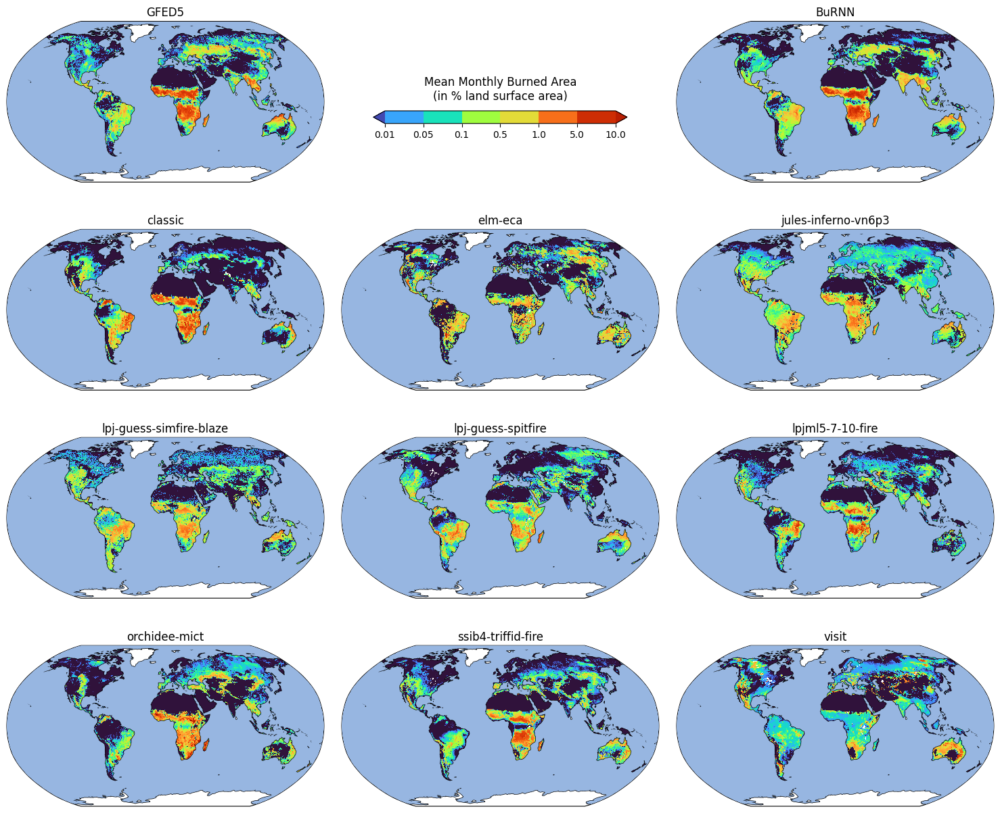

In [6]:
warnings.simplefilter(action="ignore")
start_year, end_year = 2003, 2019
modelnames = list(model_ds.keys())
number_of_plots = 1 + 1 + len(modelnames) + 1
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = [0.01, 0.05, 0.1, 0.5, 1, 5, 10]  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000

boundaries = np.array(boundaries)*cmap_corr_f

for idx in range(number_of_plots):
    ax = axs[idx]
    if idx == 0:
        cube = constrain_time(obs_cube, start_year, end_year)
        title = 'GFED5'
    elif idx == 1:
        ax.set_frame_on(False)
            # Use fig.colorbar() with the first 10 subplots for proper alignment
        cbar = fig.colorbar(mesh, ax=ax, orientation='horizontal', label='Mean Monthly Burned Area\n(in % land surface area)', boundaries=boundaries, ticks=boundaries, extend='both')
        cbar.ax.set_xticklabels(boundaries/cmap_corr_f)
        continue
    elif idx == 2:
        cube = constrain_time(predicted_cube, start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = 'BuRNN'
    else:
        modelname = model_cubelist[idx-3].name()
        print(modelname)
        cube = constrain_time(model_cubelist[idx-3], start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = modelname

    data = (pixel_mean(cube)+0.0001)*cmap_corr_f#/cube.collapsed(('time', 'latitude', 'longitude'), iris.analysis.MEAN)
    norm = mcolors.LogNorm(vmin=0.005*cmap_corr_f, vmax=20*cmap_corr_f)
    mesh = iplt.pcolormesh(data, axes=ax, norm=norm, cmap=cmap) #afmhot_r

    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(title)
plt.tight_layout()

cbar.ax.set_position([0.375, 0.85, 0.25, 0.02])
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.labelpad = 12 # Space between cbar and label
cbar.ax.xaxis.label.set_size(12) # Label fontsize

plt.savefig(os.path.join(logs_path, 'global_mean.png'), dpi=300)
warnings.simplefilter(action="default")
plt.show()

#### Error maps

classic
elm-eca
jules-inferno-vn6p3
lpj-guess-simfire-blaze
lpj-guess-spitfire
lpjml5-7-10-fire
orchidee-mict
ssib4-triffid-fire
visit


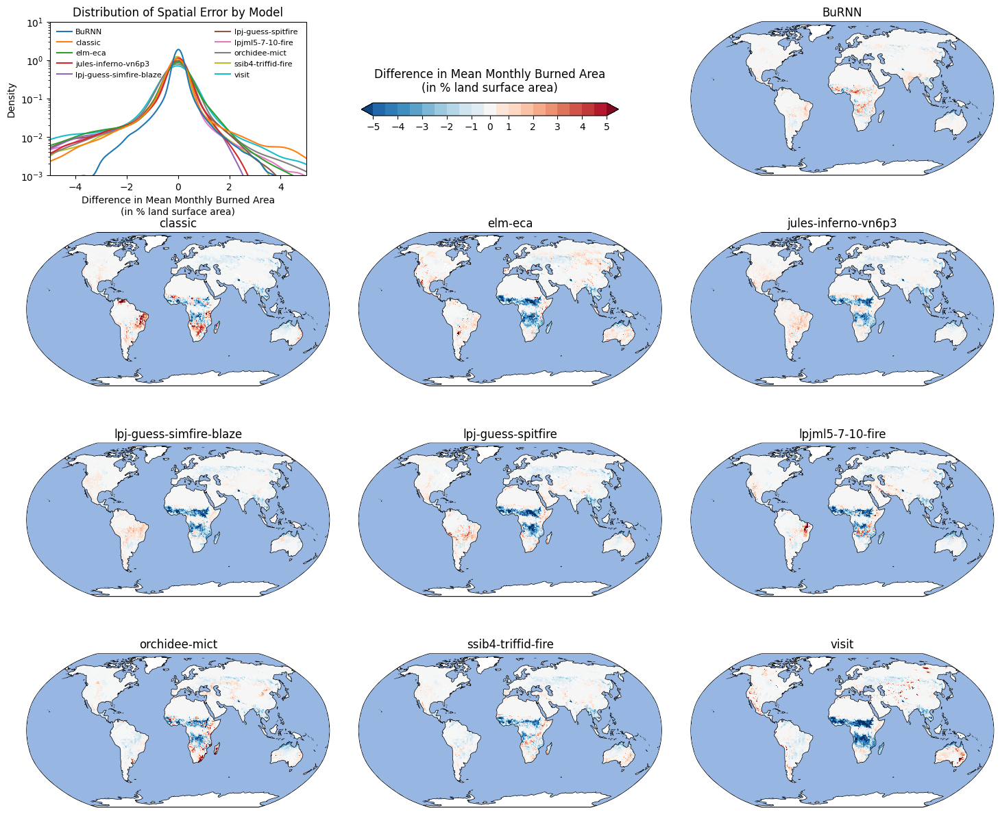

In [10]:
warnings.simplefilter(action="ignore")
start_year, end_year = 1997, 2019
v_value = 5
step = 0.5
boundaries = list(np.arange(-v_value, v_value+step, step))
boundaries = boundaries[:int(v_value/step)] + boundaries[int(v_value/step)+1:]
obs_plot = constrain_time(obs_cube, start_year, end_year)
modelnames = list(model_ds.keys())
LSTM_name = 'BuRNN'
number_of_plots = 1 + 1 + len(modelnames) + 1
results = []
label='Difference in Mean Monthly Burned Area\n(in % land surface area)'

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx in range(2, number_of_plots):
    ax = axs[idx]
    if idx == 2:
        cube = constrain_time(predicted_cube, start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = LSTM_name
    else:
        modelname = model_cubelist[idx-3].name()
        print(modelname)
        cube = constrain_time(model_cubelist[idx-3], start_year, end_year)
        cube = iris.util.mask_cube(cube, pixel_mean(obs_cube).data.mask)
        title = modelname

    data = pixel_mean(cube)-pixel_mean(obs_plot)#/cube.collapsed(('time', 'latitude', 'longitude'), iris.analysis.MEAN)
    mesh = iplt.pcolormesh(data, axes=ax, cmap='RdBu_r', vmin=-v_value-1, vmax=v_value+1) #afmhot_r
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(title)
    results.append(pd.DataFrame({'model': title, 'value': data.data.data[~data.data.mask]}))

#axs[0].set_frame_on(False)

df = pd.concat(results, ignore_index=True)
ax = axs[0]
ax = sns.kdeplot(data=df, x='value', hue='model', ax=ax, common_norm=False, fill=False, bw_adjust=3, clip=(-5, 5), log_scale=[False, True])
ax.set_xlim([-5, 5])
ax.set_ylim([1e-3, 3])
ax.set_title("Distribution of Spatial Error by Model")
ax.set_xlabel(label)
ax.set_ylabel("Density")
ax.set_xticks([-4., -2.,  0.,  2.,  4.])
ax.set_yticks([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01])
ax.set_aspect(1.5)
sns.move_legend(ax, loc='upper left', fontsize=8, frameon=False, title=None, ncols=2, columnspacing=7, handletextpad=0.5)

plt.tight_layout()
axs[1].set_frame_on(False)
cbar = fig.colorbar(mesh, ax=axs[1], orientation='horizontal', label=label, boundaries=boundaries, ticks=boundaries, extend='both')
cbar.ax.set_position([0.375, 0.85, 0.25, 0.02])
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.labelpad = 12 # Space between cbar and label
cbar.ax.xaxis.label.set_size(12) # Label fontsize
cbar.locator = matplotlib.ticker.MaxNLocator(integer=True)
cbar.update_ticks()


plt.savefig(os.path.join(logs_path, 'global_diff.png'), dpi=300)
warnings.simplefilter(action="default")
plt.show()

#### GFED Regional Timeseries

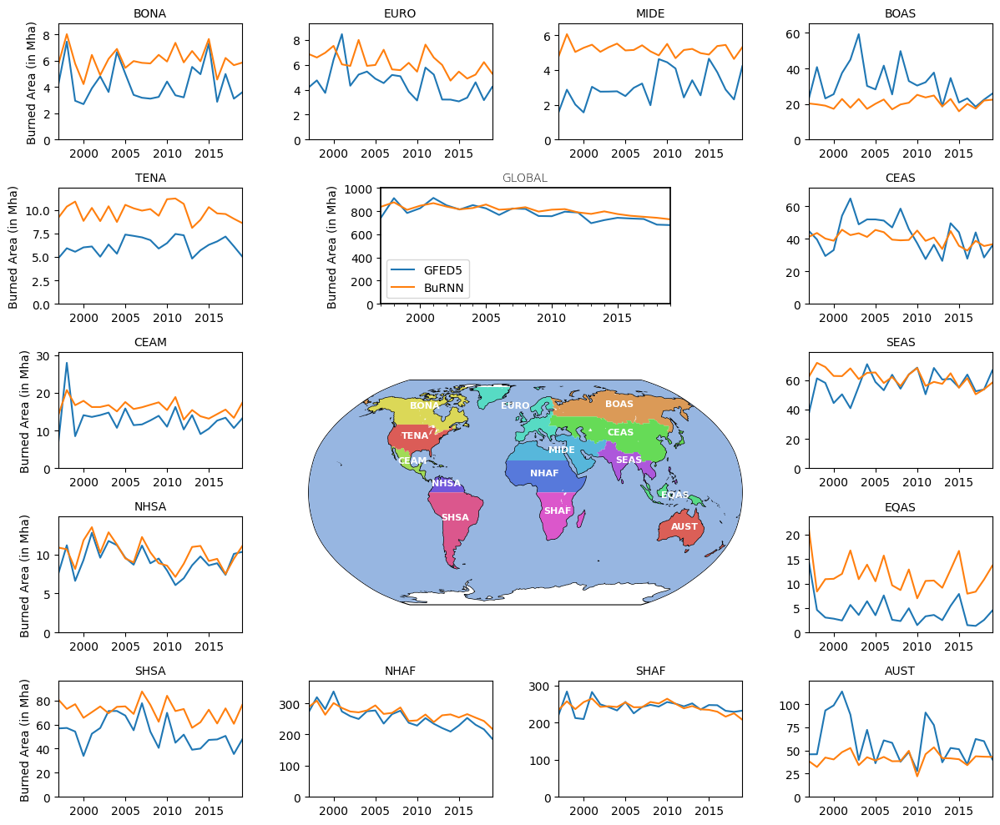

In [11]:
import matplotlib.gridspec as gridspec

start_year, end_year = 1997, 2019

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

obs_df_plot = obs_df_yearly_gfed.loc[f'{start_year}-01-01':]
pred_df_plot = predicted_df_yearly_gfed.loc[f'{start_year}-01-01':]

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            obs_region, model_region = obs_df_plot.loc[slice(None), regionname], pred_df_plot.loc[slice(None), regionname]
            pd.concat([obs_region, model_region], axis=1, keys=['GFED5', modelname]).plot(ax=ax, legend=False)
            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel('Burned Area (in Mha)')
            model_max, obs_max = model_region.max(), obs_region.max()
            if type(model_max) == pd.Series:
                model_max = model_max.max()
            max_val = max(model_max, obs_max)
            ax.set_ylim([0, max_val*1.1])
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.array([2000, 2005, 2010, 2015])-1970, [2000, 2005, 2010, 2015])

ax_global = fig.add_subplot(gs[1, 1:3])
corr_f = 1 / (pred_df_plot.columns.size / obs_df_plot.columns.size)
pd.concat([obs_df_plot.sum(axis=1), corr_f*pred_df_plot.sum(axis=1)], axis=1, keys=['GFED5', modelname]).plot(ax=ax_global, legend=True)
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(0, max([1000, corr_f*pred_df_plot.sum(axis=1).max()]))
ax_global.set_xlabel('')
ax_global.set_ylabel('Burned Area (in Mha)')


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, f'gfed_regions_{start_year}_{end_year}.png'), dpi=400)
plt.show()

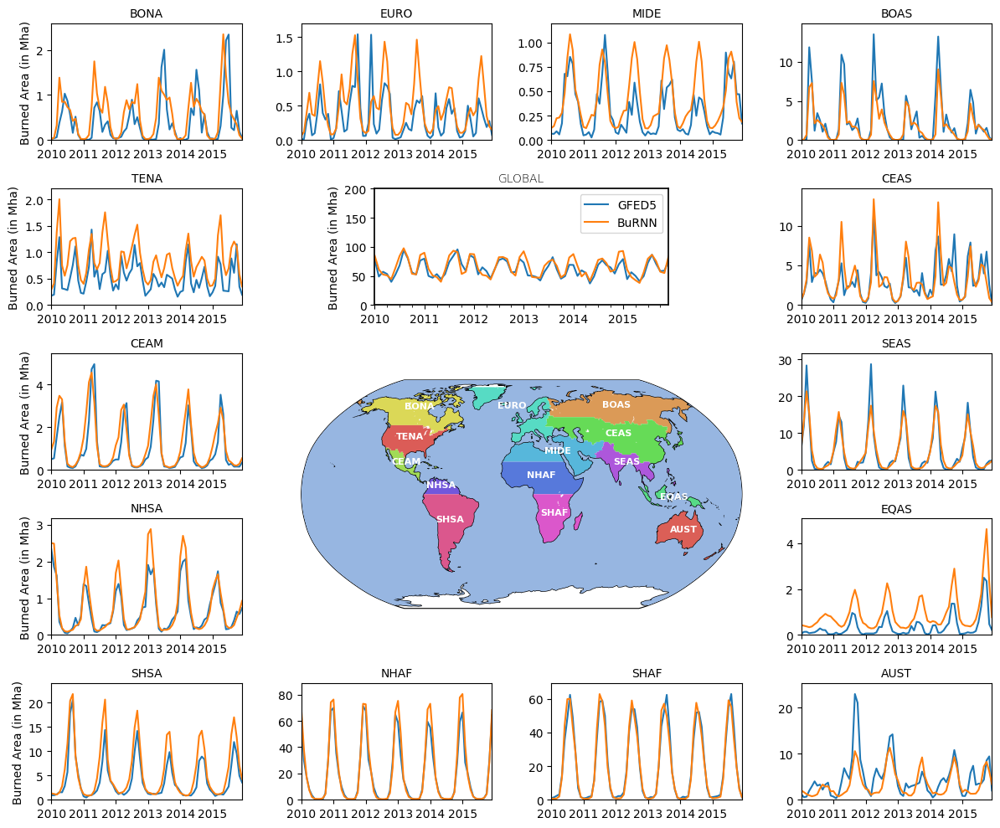

In [12]:
import matplotlib.gridspec as gridspec

start_year, end_year = 2010, 2015

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

obs_df_plot = obs_df_gfed.loc[f'{start_year}-01-01':f'{end_year}-12-31']
pred_df_plot = predicted_df_gfed.loc[f'{start_year}-01-01':f'{end_year}-12-31']

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            obs_region, model_region = obs_df_plot.loc[slice(None), regionname], pred_df_plot.loc[slice(None), regionname]
            pd.concat([obs_region, model_region], axis=1, keys=['GFED5', modelname]).plot(ax=ax, legend=False)
            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel('Burned Area (in Mha)')
            model_max, obs_max = model_region.max(), obs_region.max()
            if type(model_max) == pd.Series:
                model_max = model_max.max()
            max_val = max(model_max, obs_max)
            ax.set_ylim([0, max_val*1.1])
            outer_axes.append(ax)
            idx += 1

ax_global = fig.add_subplot(gs[1, 1:3])
corr_f = 1 / (pred_df_plot.columns.size / obs_df_plot.columns.size)
pd.concat([obs_df_plot.sum(axis=1), corr_f*pred_df_plot.sum(axis=1)], axis=1, keys=['GFED5', modelname]).plot(ax=ax_global, legend=True)
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(0, max([200, corr_f*pred_df_plot.sum(axis=1).max()]))
ax_global.set_xlabel('')
ax_global.set_ylabel('Burned Area (in Mha)')


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, f'gfed_regions_{start_year}_{end_year}_monthly.png'), dpi=400)
plt.show()

#### Reconstruction (optionally including Mouillot)

In [6]:
import rioxarray
tiff_files = glob.glob("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/Mouillot_Field_2005/*.tif")
ds = xr.concat([rioxarray.open_rasterio(f, chunks=True) for f in tiff_files], dim="time")
ds = ds.drop(['spatial_ref', 'band'])[:, 0]
# Set time coordinates if applicable (replace with actual timestamps)
ds["time"] = np.arange(np.datetime64('1899-01-01'), np.datetime64('2000-01-01'), dtype='datetime64[Y]')
ds = ds.interp(y=gfed_regions.lat, x=gfed_regions.lon)

gfed_regions = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/base_regions_upscaled.nc").__xarray_dataarray_variable__
gfed_regions = xr.DataArray(np.vectorize(gfed_idx_name.get)(gfed_regions), coords=gfed_regions.coords, dims=gfed_regions.dims)
gfed_regions = xr.where(gfed_regions == 'OCEAN', np.nan, gfed_regions)

mouillot_da = constrain_time(ds, 1901, 2019) * 100 #1997
mouillot_da['Region'] = gfed_regions
mouillot_da = mouillot_da.rename({'lat': 'latitude', 'lon': 'longitude'}).drop(['x', 'y'])
mouillot_cube = mouillot_da.to_iris()
mouillot_cube.coords('time')[0].standard_name = 'time'
for coord in ('latitude', 'longitude'):
    mouillot_cube.coords(coord)[0].guess_bounds()
    mouillot_cube.coords(coord)[0].units = 'degrees'
    mouillot_cube.coords(coord)[0].coord_system = cs
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')
time_coord = mouillot_cube.coords('time')[0]
time_coord.long_name = None
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
mouillot_cube.replace_coord(new_time_coord)
mouillot_cube.coords('time')[0].units = time_unit
mouillot_cube.var_name = mouillot_cube.long_name
mouillot_cube.long_name = 'Mouillot'
mouillot_cube.units = '%'

mouillot_cube.coords('Region')[0].points = gfed_regions.values
mouillot_da_mha_gfed = xr.DataArray.from_iris(to_mha(mouillot_cube))
mouillot_df_gfed = mouillot_da_mha_gfed.groupby(mouillot_da_mha_gfed.Region).sum().to_pandas().rename(columns=gfed_idx_name)
mouillot_df_yearly_gfed = mouillot_df_gfed.resample('YS').sum()

/tmp/ipykernel_2596078/170029296.py:4: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ds = ds.drop(['spatial_ref', 'band'])[:, 0]
/tmp/ipykernel_2596078/170029296.py:6: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  ds["time"] = np.arange(np.datetime64('1899-01-01'), np.datetime64('2000-01-01'), dtype='datetime64[Y]')
/tmp/ipykernel_2596078/170029296.py:15: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  mouillot_da = mouillot_da.rename({'lat': 'latitude', 'lon': 'longitude'}).drop(['x', 'y'])
/apps/brussel/RL9/z

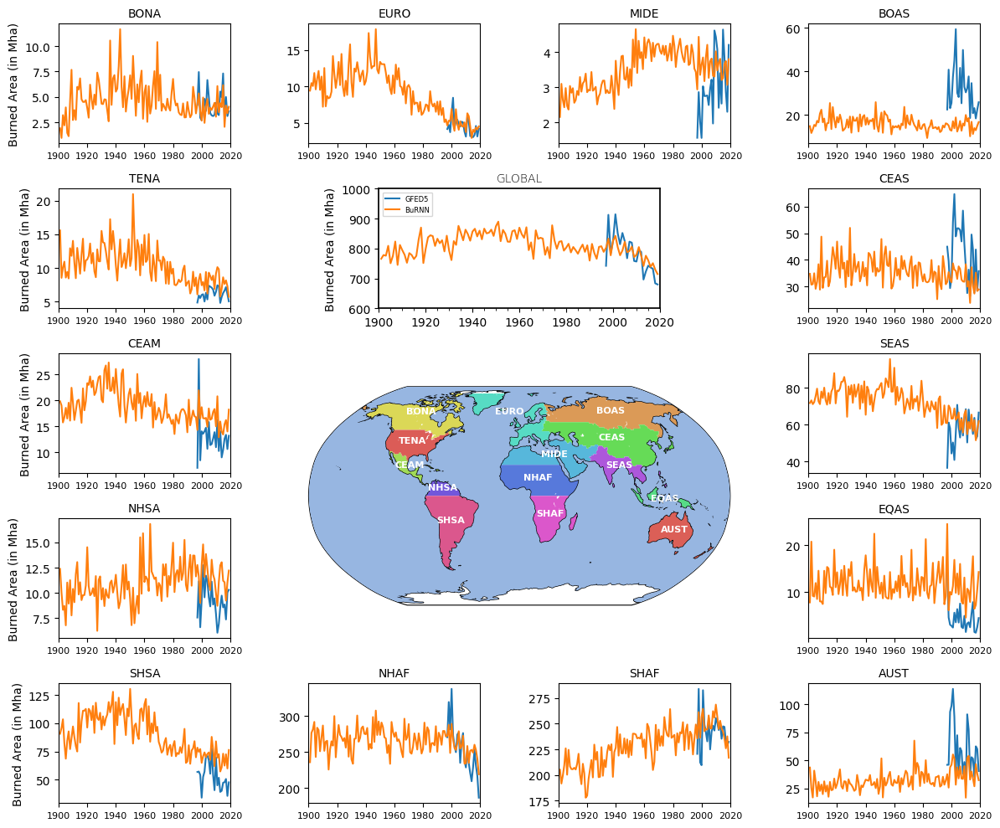

In [5]:
import matplotlib.gridspec as gridspec

mouillot = False
RA = False

start_year = 1997

if RA:
    label = 'Burned Area\n(Relative Anomaly)'
else:
    label = 'Burned Area (in Mha)'

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            obs_region, pred_region = obs_df_yearly_gfed.loc[slice(None), regionname], predicted_df_yearly_gfed.loc[slice(None), regionname]
            if mouillot:
                mouillot_region = mouillot_df_yearly_gfed.loc[slice(None), regionname]
                data = pd.concat([obs_region, pred_region, mouillot_region], axis=1, keys=['GFED5', modelname, 'Mouillot & Field (2005)'])
            else:
                data = pd.concat([obs_region, pred_region], axis=1, keys=['GFED5', modelname])

            if RA:
                mean = data.loc[f'{start_year}-01-01':].mean()
                data = (data-mean)/mean

            data.plot(ax=ax, legend=False)

            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel(label)
            #ax.set_xticks(np.arange(1910, 2020, 10)-1970)
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.arange(1900, 2021, 20)-1970, np.arange(1900, 2021, 20), fontsize=8)

ax_global = fig.add_subplot(gs[1, 1:3])
if mouillot:
    global_data = pd.concat([obs_df_yearly_gfed.sum(axis=1), predicted_df_yearly_gfed.sum(axis=1), mouillot_df_yearly_gfed.sum(axis=1)], axis=1, keys=['GFED5', modelname, 'Mouillot & Field (2005)'])
else:
    global_data = pd.concat([obs_df_yearly_gfed.sum(axis=1), predicted_df_yearly_gfed.sum(axis=1)], axis=1, keys=['GFED5', modelname])

if RA:
    global_mean = global_data.loc[f'{start_year}-01-01':].mean()
    global_data = (global_data-global_mean)/global_mean
    ymin, ymax = -1, 1.1*global_data.max().max()
else:
    ymin, ymax = 600, 1000#max([1000, 1.1*global_data.max().max()])
global_data.plot(ax=ax_global, legend=True) 
plt.legend(fontsize=6)

ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(ymin, ymax)
ax_global.set_xlabel('')
ax_global.set_ylabel(label)
ax_global.set_xticks(np.arange(1900, 2021, 20)-1970, np.arange(1900, 2021, 20))


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)

if mouillot:
    if RA:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019_mouillot_RA.png'), dpi=400)
    else:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019_mouillot.png'), dpi=400)
else:
    if RA:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019_RA.png'), dpi=400)
    else:
        plt.savefig(os.path.join(logs_path, f'Reconstruction_1901_2019.png'), dpi=400)
plt.show()

#### Reconstruction (FireCCiLT11)

In [4]:
firecci_11_da = xr.open_dataset(os.path.join(supplementary_data_path, 'FireCCILT11_Burned_Percentage.nc')).drop_dims('bnds').percentage_of_area_burned
firecci_11_da = preprocess_time(firecci_11_da)
firecci_11_da = firecci_11_da.where(firecci_11_da<101, np.nan)
firecci_11_da = firecci_11_da.assign_coords({'Region': predicted_da.Region})
firecci_11_cube = firecci_11_da.to_iris()
firecci_11_cube.rename('burntarea-total')
firecci_11_cube.coords('latitude')[0].guess_bounds()
firecci_11_cube.coords('latitude')[0].units = 'degrees'
firecci_11_cube.coords('latitude')[0].coord_system = cs
firecci_11_cube.coords('longitude')[0].guess_bounds()
firecci_11_cube.coords('longitude')[0].units = 'degrees'
firecci_11_cube.coords('longitude')[0].coord_system = cs
firecci_11_cube.var_name = firecci_11_cube.long_name
firecci_11_cube.long_name = 'FireCCI11'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

firecci_11_cube = iris.util.mask_cube(firecci_11_cube, regions_masked, in_place=False, dim=0)

firecci_11_da_mha = xr.DataArray.from_iris(to_mha(firecci_11_cube))
firecci_11_df = firecci_11_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
firecci_11_df = firecci_11_df.rename(columns=AR6_idx_name)
firecci_11_df_yearly = firecci_11_df.resample('YS').sum()

firecci_11_cube_gfed = deepcopy(firecci_11_cube)
firecci_11_cube_gfed.coords('Region')[0].points = gfed_regions.values
firecci_11_da_mha_gfed = xr.DataArray.from_iris(to_mha(firecci_11_cube_gfed))
firecci_11_df_gfed = firecci_11_da_mha_gfed.groupby(firecci_11_da_mha_gfed.Region).sum().to_pandas()
firecci_11_df_gfed = firecci_11_df_gfed.rename(columns=gfed_idx_name)
firecci_11_df_yearly_gfed = firecci_11_df_gfed.resample('YS').sum()

In [68]:
start_year, end_year = 1997, 2017
obs_df_yearly_global = obs_df_yearly_gfed.sum(axis=1).loc[f'01-01-{start_year}':f'31-12-{end_year}']
firecci_11_df_yearly_global = firecci_11_df_yearly_gfed.sum(axis=1).loc[f'01-01-{start_year}':f'31-12-{end_year}']
pd.concat([obs_df_yearly_global, firecci_11_df_yearly_global], axis=1).corr()

,0,1
0,1.000000,0.288523
1,0.288523,1.000000


<Figure size 1200x1000 with 0 Axes>

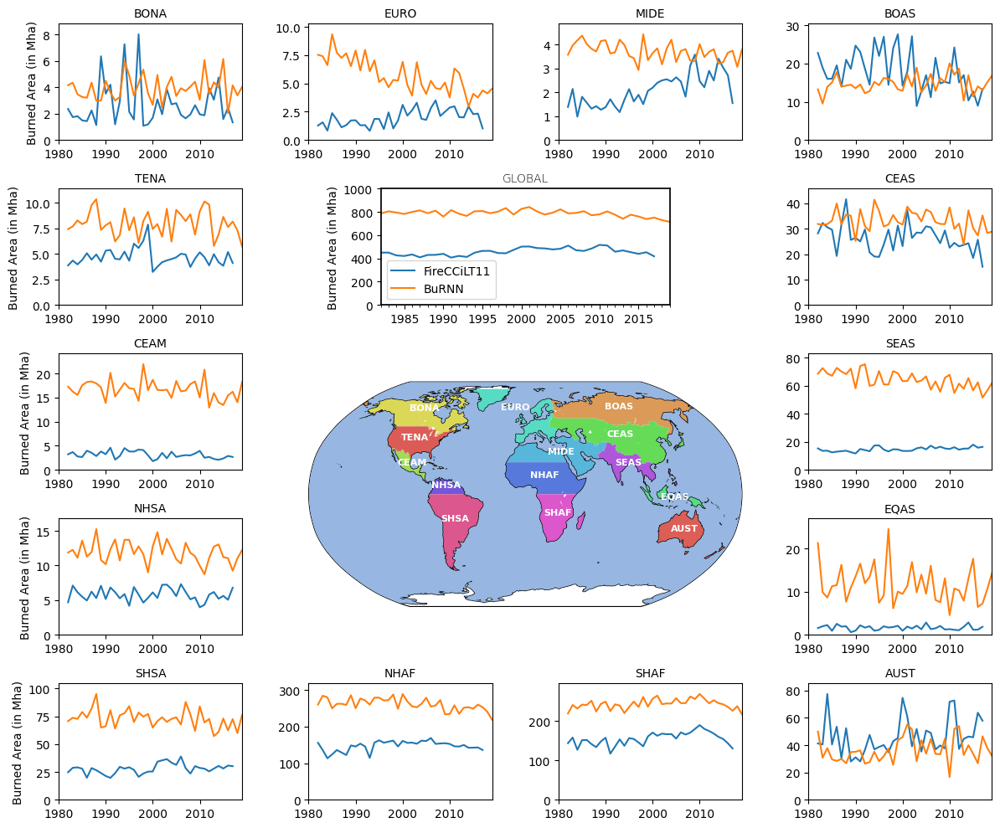

In [7]:
import matplotlib.gridspec as gridspec

start_year, end_year = 1982, 2019

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

firecci_11_df_plot = firecci_11_df_yearly_gfed.loc[f'{start_year}-01-01':]
pred_df_plot = predicted_df_yearly_gfed.loc[f'{start_year}-01-01':]
gfed_df_plot = obs_df_yearly_gfed.loc[f'{start_year}-01-01':]

correlations = pd.DataFrame(index=['past', 'present'])
gfed_firecci_correlations = pd.DataFrame(index=['present'])

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            gfed_region = gfed_df_plot.loc[slice(None), regionname]
            firecci_11_region, model_region = firecci_11_df_plot.loc[slice(None), regionname], pred_df_plot.loc[slice(None), regionname]
            pd.concat([firecci_11_region, model_region], axis=1, keys=['FireCCiLT11', modelname]).plot(ax=ax, legend=False)
            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel('Burned Area (in Mha)')
            model_max, firecci_11_max = model_region.max(), firecci_11_region.max()
            if type(model_max) == pd.Series:
                model_max = model_max.max()
            max_val = max(model_max, firecci_11_max)
            ax.set_ylim([0, max_val*1.1])
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.array([1980, 1990, 2000, 2010])-1970, [1980, 1990, 2000, 2010])

            corr_df = pd.DataFrame()
            corr_df['firecci'] = firecci_11_region['1982-01-01':'1994-01-01']
            corr_df['BuRNN'] = model_region['1982-01-01':'1994-01-01']
            correlations.loc['past', (regionname)] = corr_df.corr().iloc[0, 1]

            corr_df = pd.DataFrame()
            corr_df['firecci'] = firecci_11_region['1997-01-01':'2019-01-01']
            corr_df['BuRNN'] = model_region['1997-01-01':'2019-01-01']
            correlations.loc['present', (regionname)] = corr_df.corr().iloc[0, 1]

            corr_df = pd.DataFrame()
            corr_df['firecci'] = firecci_11_region['1997-01-01':'2019-01-01']
            corr_df['GFED5'] = gfed_region['1997-01-01':'2019-01-01']
            gfed_firecci_correlations.loc['present', (regionname)] = corr_df.corr().iloc[0, 1]

            
ax_global = fig.add_subplot(gs[1, 1:3])
corr_f = 1 / (pred_df_plot.columns.size / firecci_11_df_plot.columns.size)
pd.concat([firecci_11_df_plot.sum(axis=1), corr_f*pred_df_plot.sum(axis=1)], axis=1, keys=['FireCCiLT11', modelname]).plot(ax=ax_global, legend=True)
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(0, max([1000, corr_f*pred_df_plot.sum(axis=1).max()]))
ax_global.set_xlabel('')
ax_global.set_ylabel('Burned Area (in Mha)')


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, f'gfed_regions_{start_year}_{end_year}_firecci.png'), dpi=400)
plt.show()

In [8]:
correlations = correlations.T
correlations['GFED5-FireCCiLT11: 1997-2018'] = gfed_firecci_correlations.T.values
correlations = correlations.rename(columns={'past': 'BuRNN-FireCCiLT11: 1982-1993', 'present': 'BuRNN-FireCCiLT11: 1997-2018'})

In [9]:
latex_code = correlations.style.format(precision=2).to_latex(hrules=False, 
                                                    caption='Regional correlation of annual burned area of \gls{model} and FireCCiLT11 (1982-1993 and 1997-2018) and between FireCCiLT11 and GFED5 (1997-2018).', 
                                                    convert_css=True,
                                                    position_float='centering',
                                                    label='tab:firecci_corr'
                                                    )
print(latex_code)

\begin{table}
\centering
\caption{Regional correlation of annual burned area of \gls{model} and FireCCiLT11 (1982-1993 and 1997-2018) and between FireCCiLT11 and GFED5 (1997-2018).}
\label{tab:firecci_corr}
\begin{tabular}{lrrr}
 & BuRNN-FireCCiLT11: 1982-1993 & BuRNN-FireCCiLT11: 1997-2018 & GFED5-FireCCiLT11: 1997-2018 \\
BONA & 0.52 & -0.01 & -0.07 \\
EURO & 0.67 & 0.18 & 0.05 \\
MIDE & -0.08 & -0.41 & 0.29 \\
BOAS & 0.15 & -0.19 & -0.04 \\
TENA & 0.32 & 0.05 & -0.23 \\
CEAS & -0.28 & 0.26 & 0.29 \\
CEAM & 0.61 & 0.07 & 0.12 \\
SEAS & -0.01 & -0.59 & 0.32 \\
NHSA & -0.01 & 0.25 & 0.24 \\
EQAS & -0.17 & -0.10 & -0.06 \\
SHSA & 0.27 & -0.25 & 0.23 \\
NHAF & 0.26 & 0.47 & 0.52 \\
SHAF & 0.55 & 0.53 & -0.06 \\
AUST & -0.01 & -0.06 & 0.19 \\
\end{tabular}
\end{table}



<>:2: SyntaxWarning: invalid escape sequence '\g'
<>:2: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_3682949/3670421662.py:2: SyntaxWarning: invalid escape sequence '\g'
  caption='Regional correlation of annual burned area of \gls{model} and FireCCiLT11 (1982-1993 and 1997-2018) and between FireCCiLT11 and GFED5 (1997-2018).',


In [10]:
correlations.mean()

BuRNN-FireCCiLT11: 1982-1993    0.198310
BuRNN-FireCCiLT11: 1997-2018    0.015262
GFED5-FireCCiLT11: 1997-2018    0.127433
dtype: float64

### Supplementary

#### Heatmap

In [11]:
x = constrain_time(obs_da, 1997, 2019).values.flatten()
x_mask = ~np.isnan(x)

y = constrain_time(predicted_da, 1997, 2019).values.flatten()
y_mask = ~np.isnan(y)

x = x[x_mask*y_mask]
y = y[x_mask*y_mask]

x = np.floor(x).astype(np.int8)
y = np.floor(y).astype(np.int8)

x_bincount = np.bincount(x, minlength=100)
y_bincount = np.bincount(y, minlength=101)

/tmp/ipykernel_3682949/2201288100.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


<Figure size 1200x800 with 0 Axes>

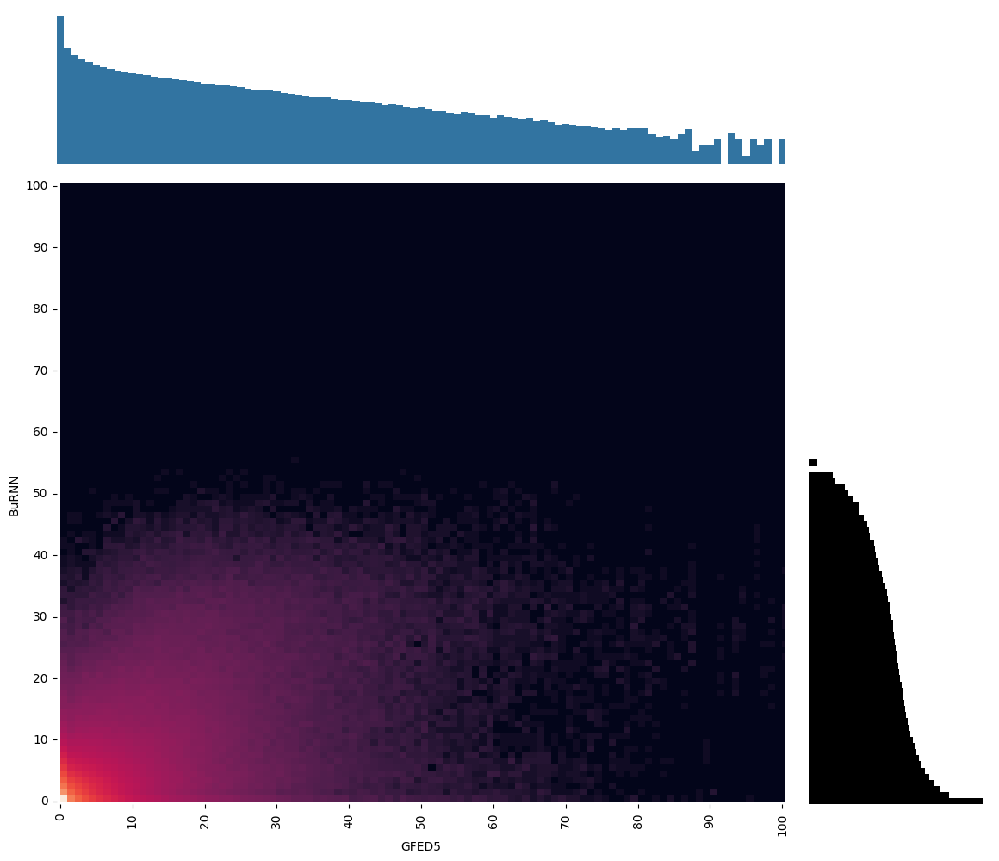

In [14]:
plt.figure(figsize=(12, 8))
full_range = range(101)
heatmap_data = pd.crosstab(y, x)
heatmap_data = heatmap_data.reindex(index=full_range, columns=full_range, fill_value=0)
log_data = np.log1p(heatmap_data)

# Marginal histograms
x_counts = np.bincount(x, minlength=101)
y_counts = np.bincount(y, minlength=101)

# Set up figure and axes using gridspec
fig = plt.figure(figsize=(14, 12))
gs = matplotlib.gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

ax_heatmap = fig.add_subplot(gs[1, 0])
sns.heatmap(
    log_data,
    ax=ax_heatmap,
    cmap='rocket',
    cbar=False
)

plt.xlabel('GFED5')
plt.ylabel('BuRNN')
plt.xlim([0, 100])
plt.ylim([0, 100])
plt.xticks(np.arange(0, 101, 10), np.arange(0, 101, 10))
plt.yticks(np.arange(0, 101, 10), np.arange(0, 101, 10))

# Top histogram (BuRNN distribution)
ax_top_hist = fig.add_subplot(gs[0, 0], sharex=ax_heatmap)
sns.barplot(x=full_range, y=x_counts, ax=ax_top_hist, color=sns.color_palette()[0], errorbar=None, width=1)
ax_top_hist.set_yscale('log')
ax_top_hist.axis('off')  # Hide axes if you want a cleaner look
ax_top_hist.set_xlim(-0.5, 100.5)


# Side histogram (GFED5 distribution)
ax_side_hist = fig.add_subplot(gs[1, 1], sharey=ax_heatmap)
sns.barplot(y=full_range, x=y_counts, ax=ax_side_hist, color='k', errorbar=None, orient='h', width=1)
ax_side_hist.axis('off')
ax_side_hist.set_xscale('log')
ax_side_hist.set_ylim(-0.5, 100.5)
#ax_side_hist.invert_xaxis()
plt.tight_layout()
plt.show()

#### Folds

/apps/brussel/RL8/zen4/software/SciTools-Iris/3.9.0-foss-2023a/lib/python3.11/site-packages/iris/coords.py:2153: IrisVagueMetadataWarning: Cannot check if coordinate is contiguous: Invalid operation for 'time', with 0 bound(s). Contiguous bounds are only defined for 1D coordinates with 2 bounds. Metadata may not be fully descriptive for 'time'. Ignoring bounds.
  warnings.warn(


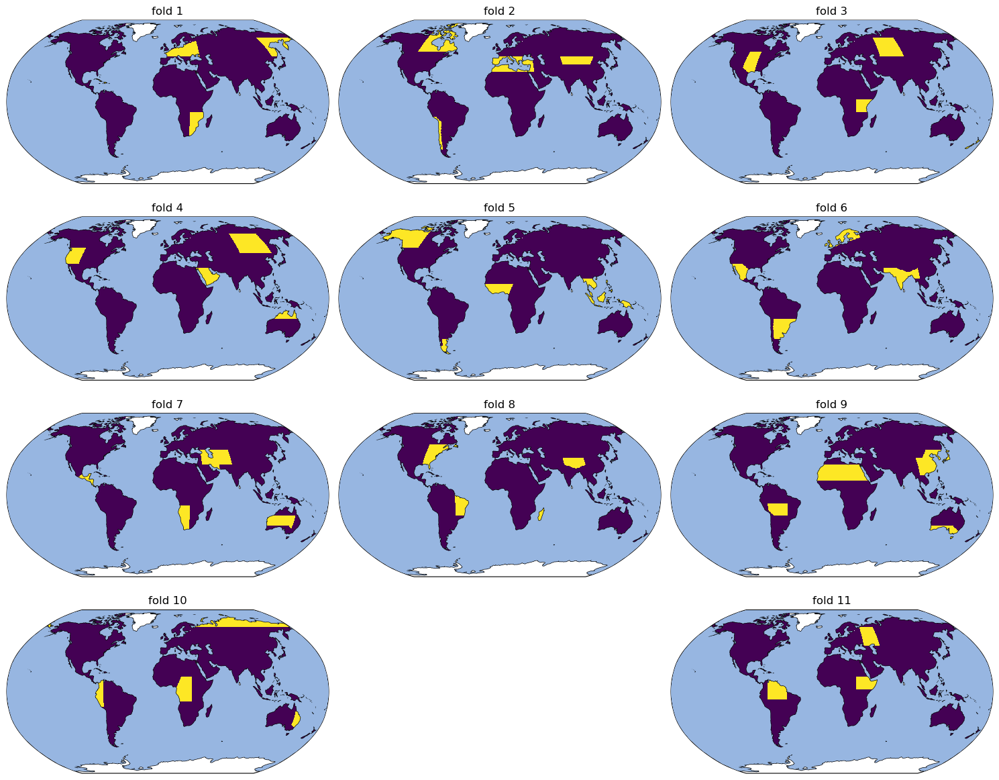

In [10]:
all_regions = [reg for fold in folds for reg in fold]
obs_mask = pixel_mean(obs_cube).data.mask

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx, fold in enumerate(folds):
    ax = axs[idx]
    title = f'fold {idx+1}'
    if idx == len(folds)-1:
        ax.set_frame_on(False)
        idx+=1
        ax = axs[idx]

    cube = (~AR6_mask.loc[[abbrev in fold for abbrev in AR6_mask.abbrevs]]).sum(dim='region').rename({'lat': 'latitude', 'lon': 'longitude'})[::-1].to_iris()
    cube = iris.util.mask_cube(cube, obs_mask)
    for coord in ('latitude', 'longitude'):
        cube.coords(coord)[0].units = 'degrees'
        cube.coords(coord)[0].coord_system = cs
        cube.coords(coord)[0].guess_bounds()
        cube.coords(coord)[0].standard_name = coord
        cube.coords(coord)[0].var_name = coord[:3]
        cube.coords(coord)[0].long_name = coord.capitalize()

    mesh = iplt.pcolormesh(cube, axes=ax) #afmhot_r
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(title)
plt.tight_layout()
plt.savefig(os.path.join(figures_path, 'folds.png'), dpi=400)

#### Regional Evaluation (independent data)

In [99]:
from pyproj import CRS
shape_file = os.path.join(supplementary_data_path, 'EU_countries.gpkg')
shape_file = gpd.read_file(shape_file)
eu_shapes = shape_file.loc[shape_file.EU_STAT=='T'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_index('CNTR_ID').set_crs('epsg:3035')
spherical_crs = CRS.from_proj4("+proj=longlat +a=6371229 +b=6371229 +no_defs")

/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brusse

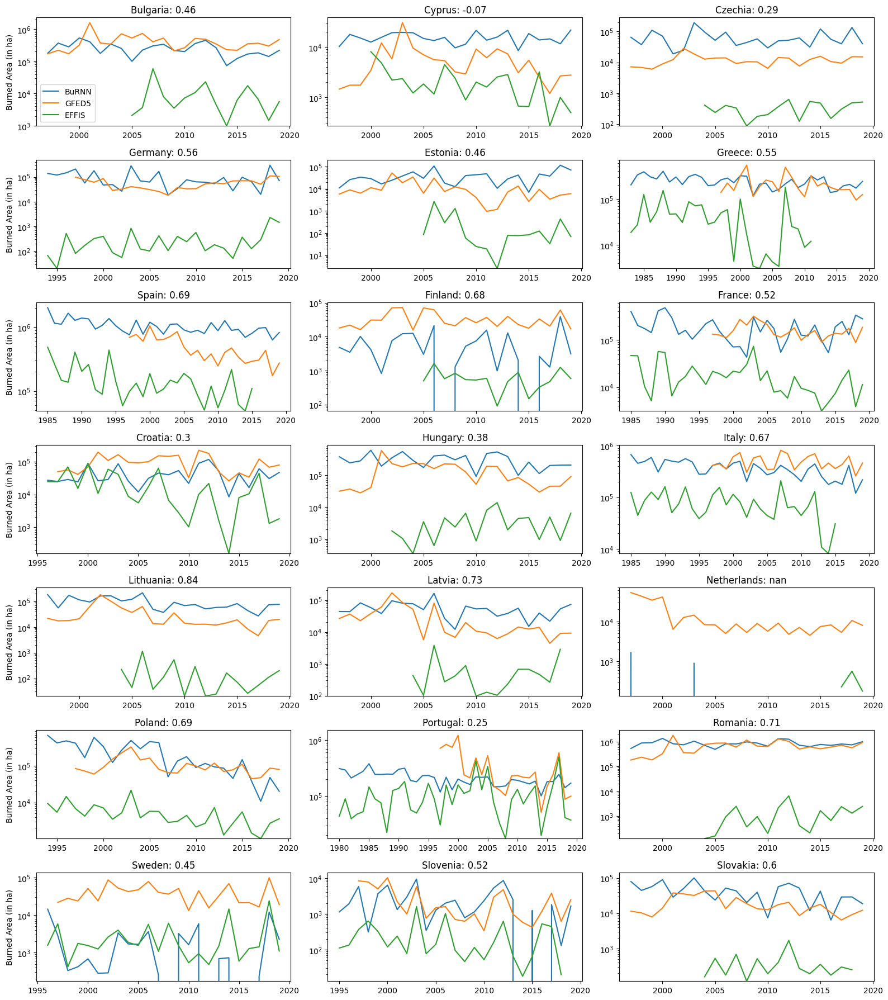

In [23]:
filename = os.path.join(supplementary_data_path, 'Monthly_BA_NOF_EU27.xlsx')
eu_ba = pd.read_excel(filename, sheet_name='Data')
eu_ba = eu_ba.set_index(['COUNTRY', 'YEAR', 'MONTH']).drop(columns=['NUTS3_2016', 'CountOfFIREID_EU']).groupby(['COUNTRY', 'YEAR']).sum().unstack('COUNTRY').T.droplevel(None).T

fig, axs = plt.subplots(7, 3, figsize=(16, 18))
axs = axs.ravel()
for idx, regionname in enumerate(eu_ba.columns):
    eu_region_df = eu_ba.loc[slice(None), regionname].dropna()
    
    gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([eu_shapes.loc[regionname].geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
    gfed_region_df = gfed_region_ba.to_pandas()
    
    predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([eu_shapes.loc[regionname].geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    predicted_region_da['time'] = predicted_region_da['time'].dt.year
    predicted_region_df = predicted_region_da.to_pandas()

    start_year = min(eu_region_df.index[0], gfed_region_df.index[0])       
    end_year = 2020
    predicted_region_df = predicted_region_df.loc[start_year:end_year]
    predicted_region_df.name = 'BuRNN'
    gfed_region_df.name = 'GFED5'
    eu_region_df.name = 'EFFIS'
    df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(eu_region_df)
    df.index.name = ''
    
    ax = axs[idx]
    plot = sns.lineplot(df, ax=ax, legend=not idx, dashes=False)
    plot.set(yscale='log')
    plot.set_ylim(bottom=df.min().min())
    if not idx%3:
        plot.set(ylabel = 'Burned Area (in ha)')

    corr = pd.concat([predicted_region_df, eu_region_df], axis=1).corr().iloc[0, 1].round(2)

    ax.set_title(f'{eu_shapes.loc[regionname].NAME_ENGL}: {corr}')
plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'eu_independent_eval.png'), dpi=400)
plt.show()

/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


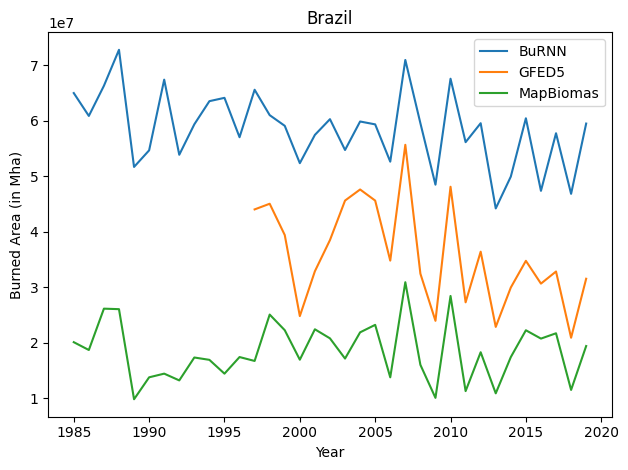

In [100]:
brasil_shape = shape_file.loc[shape_file.CNTR_NAME == 'Brasil'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0]
spherical_crs = CRS.from_proj4("+proj=longlat +a=6371229 +b=6371229 +no_defs")
brasil_data = os.path.join(supplementary_data_path, 'ba_observations', 'MapBiomas - Tabela de Dados.csv')
brasil_data_ha = pd.read_csv(brasil_data).drop(columns=['Classe']).squeeze(axis=0)
brasil_data_ha.index = brasil_data_ha.index.astype('int64')

gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([brasil_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
gfed_region_df = gfed_region_ba.to_pandas()

predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([brasil_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
predicted_region_da['time'] = predicted_region_da['time'].dt.year
predicted_region_df = predicted_region_da.to_pandas()

start_year = 1985       
end_year = 2020
predicted_region_df = predicted_region_df.loc[start_year:end_year]
predicted_region_df.name = 'BuRNN'
gfed_region_df.name = 'GFED5'
brasil_data_ha.name = 'MapBiomas'
df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(brasil_data_ha)
df.index.name = 'Year'

plot = sns.lineplot(df, legend=True, dashes=False)
#plot.set(yscale='log')
plot.set(ylabel = 'Burned Area (in Mha)', title='Brazil')

plt.tight_layout()
plt.show()

In [110]:
df.loc[1985:1996].corr()

,BuRNN,GFED5,MapBiomas
BuRNN,1.00000,NaN,0.74387
GFED5,NaN,NaN,NaN
MapBiomas,0.74387,NaN,1.00000


/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


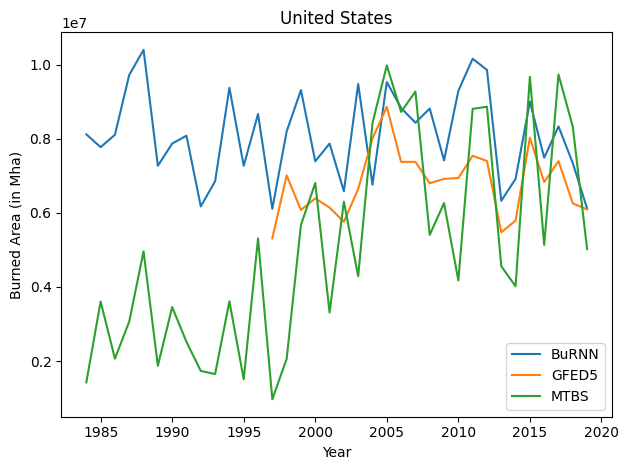

In [21]:
us_shape = shape_file.loc[shape_file.CNTR_ID == 'US'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0]
spherical_crs = CRS.from_proj4("+proj=longlat +a=6371229 +b=6371229 +no_defs")
us_data = os.path.join(supplementary_data_path, 'ba_observations', 'S_USA.MTBS_BURN_AREA_BOUNDARY.shp')
us_data = gpd.read_file(us_data).loc[slice(None), ['ACRES', 'YEAR']].groupby('YEAR').sum().squeeze(axis=1)
us_data.index.name = 'Year'

gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([us_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
gfed_region_df = gfed_region_ba.to_pandas()

predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([us_shape.geometry], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
predicted_region_da['time'] = predicted_region_da['time'].dt.year
predicted_region_df = predicted_region_da.to_pandas()

start_year = 1984       
end_year = 2020
predicted_region_df = predicted_region_df.loc[start_year:end_year]
predicted_region_df.name = 'BuRNN'
gfed_region_df.name = 'GFED5'
us_data.name = 'MTBS'
df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(us_data)
df.index.name = 'Year'

plot = sns.lineplot(df, legend=True, dashes=False)
#plot.set(yscale='log')
plot.set(ylabel = 'Burned Area (in Mha)', title='United States')

plt.tight_layout()
plt.show()

/tmp/ipykernel_3682949/2526216656.py:8: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  eu_shape = eu_shapes.drop(['AT', 'BE', 'DK', 'IE', 'LU', 'MT']).geometry.unary_union
/tmp/ipykernel_3682949/2526216656.py:28: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  country_data_series = country_data_series.resample('Y').sum()/10**4
/tmp/ipykernel_3682949/2526216656.py:28: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  country_data_series = country_data_series.resample('Y').sum()/10**4
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.

GFED5    0.499015
NBAC     0.018029
NFDB    -0.175636
Name: BuRNN, dtype: float64


/tmp/ipykernel_3682949/2526216656.py:28: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  country_data_series = country_data_series.resample('Y').sum()/10**4
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


GFED5    0.617983
MTBS    -0.202942
FOD     -0.085655
Name: BuRNN, dtype: float64


/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


GFED5        0.816408
MapBiomas    0.652175
Name: BuRNN, dtype: float64


/tmp/ipykernel_3682949/2526216656.py:39: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  country_data = country_data.resample('Y').sum()/10**4
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/tmp/ipykernel_3682949/2526216656.py:39: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  country_data = country_data.resample('Y').sum()/10**4


GFED5   -0.305813
CONAF    0.307613
Name: BuRNN, dtype: float64


/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


GFED5    0.452937
EFFIS   -0.115916
Name: BuRNN, dtype: float64


/tmp/ipykernel_3682949/2526216656.py:39: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  country_data = country_data.resample('Y').sum()/10**4
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(
/apps/brussel/RL9/zen4/software/xarray/2024.11.0-gfbf-2024a/lib/python3.12/site-packages/xarray/groupers.py:487: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  self.index_grouper = pd.Grouper(


GFED5                0.843434
Regional agencies   -0.079287
Name: BuRNN, dtype: float64


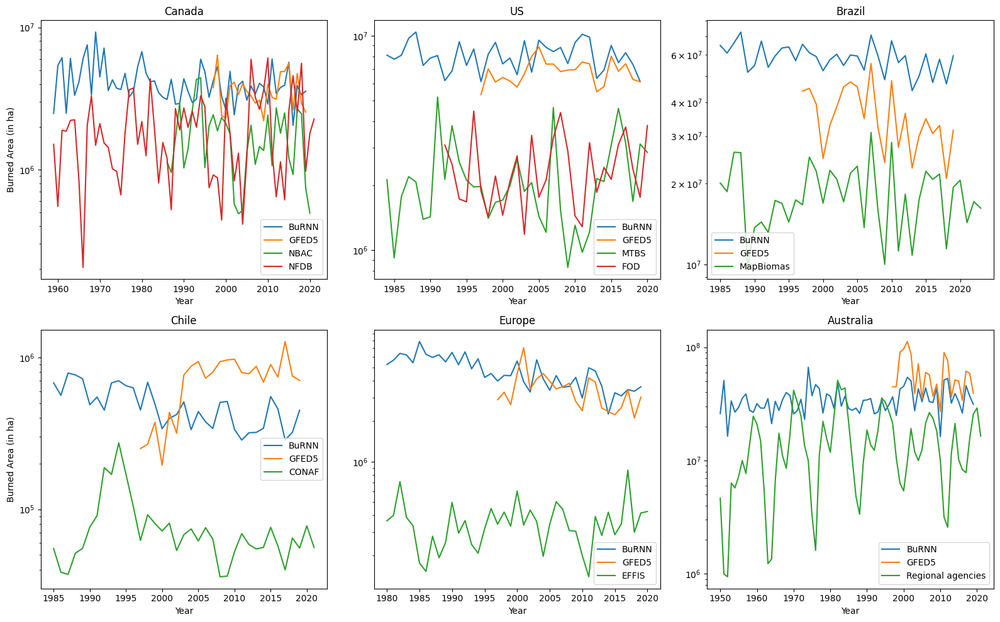

In [22]:
dirname = os.path.join(supplementary_data_path, 'ba_observations')
file_list = [os.path.join(dirname, filename) for filename in os.listdir(dirname) if filename.startswith('Monthly_Burned_area_')]
countries = [name.split('/')[-1].split('_')[5] for name in file_list]

australia_shape = shape_file.loc[shape_file.CNTR_NAME == 'Australia'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
us_shape = shape_file.loc[shape_file.CNTR_ID == 'US'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
from shapely.ops import unary_union
eu_shape = eu_shapes.drop(['AT', 'BE', 'DK', 'IE', 'LU', 'MT']).geometry.unary_union
canada_shape = shape_file.loc[shape_file.NAME_ENGL == 'Canada'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
chile_shape = shape_file.loc[shape_file.NAME_ENGL == 'Chile'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
brasil_shape = shape_file.loc[shape_file.CNTR_NAME == 'Brasil'].drop(columns=['CNTR_NAME', 'NAME_FREN', 'ISO3_CODE', 'SVRG_UN', 'CAPT', 'EU_STAT', 'EFTA_STAT', 'CC_STAT', 'NAME_GERM']).set_crs('epsg:3035').iloc[0].geometry
shape_dict = {'Australia': australia_shape, 'US': us_shape, 'Europe': eu_shape, 'Canada': canada_shape, 'Chile': chile_shape, 'Brazil': brasil_shape}

file_dict = {'CANADA': [file_list[2], file_list[4]], 'US': [file_list[0], file_list[5]], 'Brazil': os.path.join(supplementary_data_path, 'ba_observations', 'MapBiomas - Tabela de Dados.csv'), 'CHILE': file_list[3], 'EUROPE': file_list[-1], 'Australia': file_list[1]}
data_source = {'Brazil': 'MapBiomas', 'Chile': 'CONAF', 'Europe': 'EFFIS', 'Australia': 'Regional agencies'}

fig, axs = plt.subplots(2, 3, figsize=(16, 10))
axs = axs.ravel()
for idx, (countryname, filename) in enumerate(file_dict.items()):
    if countryname != 'US':
        countryname = countryname.capitalize()
    if isinstance(filename, list):
        country_data = pd.DataFrame()
        for file in filename:
            country_data_series = pd.read_csv(file).drop(columns=['lat', 'lon']).sum()
            country_data_series.index = pd.to_datetime([el[:7] for el in country_data_series.index], format="%Y-%m")
            country_data_series.name = file.split('/')[-1].split('_')[-2]
            country_data_series = country_data_series.resample('Y').sum()/10**4
            country_data = country_data.join(country_data_series, how='outer')
    else:
        if countryname == 'Brazil':
            country_data = pd.read_csv(filename).drop(columns=['Classe']).squeeze(axis=0)
            country_data.index = pd.to_datetime(country_data.index, format="%Y")
        else:
            country_data = pd.read_csv(filename).drop(columns=['lat', 'lon'])
            country_data[country_data > 1e20] = 0
            country_data = country_data.sum()
            country_data.index = pd.to_datetime([el[:7] for el in country_data.index], format="%Y-%m")
            country_data = country_data.resample('Y').sum()/10**4
        country_data.name = data_source[countryname]
    country_data.index = country_data.index.year

    gfed_region_ba = obs_da_mha.rio.write_crs(spherical_crs).rio.clip([shape_dict[countryname]], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    gfed_region_ba['time'] = gfed_region_ba['time'].dt.year
    gfed_region_df = gfed_region_ba.to_pandas()
    
    predicted_region_da = predicted_da_mha.rio.write_crs(spherical_crs).rio.clip([shape_dict[countryname]], crs='epsg:3035', drop=True).sum(dim=['lat', 'lon']).resample(time='Y').sum()
    predicted_region_da['time'] = predicted_region_da['time'].dt.year
    predicted_region_df = predicted_region_da.to_pandas()
    
    start_year = country_data.index[0]
    end_year = 2020
    predicted_region_df = predicted_region_df.loc[start_year:end_year]
    predicted_region_df.name = 'BuRNN'
    gfed_region_df.name = 'GFED5'
    df = (predicted_region_df.to_frame().join(gfed_region_df)*10**6).join(country_data, how='outer')
    df.index.name = 'Year'
    corr = df.corr()
    print(df.corr().iloc[0, 1:])

    ax = axs[idx]
    plot = sns.lineplot(df, legend=True, ax=ax, dashes=False)
    plot.set(yscale='log', title=countryname)
    if not idx%3:
        plot.set(ylabel = 'Burned Area (in ha)')
plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'all_independent_eval.png'), dpi=400)
plt.show()

#### PoF

In [125]:
pof_loc = Path(os.path.join(supplementary_data_path, 'POF_BA'))
nc_files = sorted(pof_loc.glob("*.nc"))

pof = []
for f in nc_files:
    # Extract time info from filename
    match = re.search(r"(\d{4})_(\d{2})", f.name)
    if not match:
        continue  # skip files without date info
    year, month = map(int, match.groups())
    time = pd.Timestamp(f"{year}-{month:02d}-01")

    # Open the file
    ds = xr.open_dataset(f, engine='netcdf4')
    # Expand with time dimension
    ds = ds.expand_dims(time=[time])
    pof.append(ds)

# Concatenate along time
pof = xr.concat(pof, dim="time").Model_Prediction
pof = pof.coarsen(latitude=2, longitude=2).sum()
pof.attrs['units'] = '%'

pof = constrain_time(pof, 1997, 2019)
pof_cube = pof.to_iris()
for coord in ('latitude', 'longitude'):
    pof_cube.coords(coord)[0].guess_bounds()
    pof_cube.coords(coord)[0].units = 'degrees'
    pof_cube.coords(coord)[0].coord_system = cs
pof_cube.data = (pof_cube.data*10**6 / iris.analysis.cartography.area_weights(pof_cube))*100
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')

time_coord = pof_cube.coords('time')[0]
time_coord.long_name = None
time_coord.standard_name = 'time'
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
pof_cube.replace_coord(new_time_coord)
pof_cube.coords('time')[0].units = time_unit
pof_cube.var_name = pof_cube.long_name
pof_cube.long_name = 'PoF'

In [217]:
start_year, end_year = 2003, 2019


obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
pof_cube_constrained = constrain_time(pof_cube, start_year, end_year)
print(f'{run_name}: {start_year} - {end_year}')
print('RMSE (in %)')
result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
pof_result = round(RMSE(pof_cube_constrained, obs_cube_constrained), 2)
print('BuRNN', result)
print('PoF', pof_result)


warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
print('Spatio-Temporal Correlation')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)


warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial Correlation')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
print('Temporal Correlation (monthly)')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
print('Temporal Correlation (yearly)')
result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
pof_result = round(xr.corr(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)).item(), 2)
print('BuRNN', result)
print('PoF', pof_result)

from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in Mha per year)')
print('GFED5', calculate_trend(obs_cube_constrained))
print('BuRNN', calculate_trend(predicted_cube_constrained))
print('PoF', calculate_trend(pof_cube_constrained))


warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
print('Spatial RMSE (in %)')
result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
pof_result = round(RMSE(pipeline(pof_cube_constrained).rename({'latitude': 'lat', 'longitude': 'lon'}), pipeline(obs_cube_constrained)), 2)
print('BuRNN', result)
print('PoF', pof_result)

mse_1_64_log_None_ReLU_1lambda: 2003 - 2019
RMSE (in %)
BuRNN 1.8
PoF 2.56
Spatio-Temporal Correlation
BuRNN 0.67
PoF 0.59
Spatial Correlation
BuRNN 0.86
PoF 0.69
Temporal Correlation (monthly)
BuRNN 0.76
PoF 0.65
Temporal Correlation (yearly)
BuRNN 0.81
PoF 0.75
Trend (in Mha per year)
GFED5 -8.98 ± 2.90
BuRNN -1.72 ± 0.86
PoF -9.18 ± 4.62
Spatial RMSE (in %)
BuRNN 0.71
PoF 1.4


#### Global Table

In [130]:
# Define the mean and stddev for each row
means = results_df.mean(axis=1)
stddevs = results_df.std(axis=1)
inverse = [True, True, False, False, False, False]

# Function to map a value to a color
def color_map(val, mean, stddev, inverse):
    normalized_val = (val - mean) / (2*stddev)
    if normalized_val > 1:
        normalized_val = 1
    elif normalized_val < -1:
        normalized_val = -1
    # Map normalized value to a color in the BrBG colormap
    if inverse:
        color = plt.cm.RdYlBu_r((normalized_val + 1) / 2)
    else:
        color = plt.cm.RdYlBu((normalized_val + 1) / 2) #BrBG
    return f'background-color: rgb({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)})'

results_df.columns = [results_df.columns[0]] + [el.upper() for el in results_df.columns[1:]]

results_df.to_csv(os.path.join(logs_path, 'global_table.csv'))
# Apply the style
n_cols = len(results_df.columns)

styles = [
        # First column header + cells
        {"selector": "th.col_heading.level0.col0", "props": "min-width:150px;"},
        {"selector": "td.col0", "props": "min-width:150px;"},

        # All other columns
        *[
            {"selector": f"th.col_heading.level0.col{i}", "props": "min-width:120px;"}
            for i in range(1, n_cols)
        ],
        *[
            {"selector": f"td.col{i}", "props": "min-width:90px;"}
            for i in range(1, n_cols)
        ],
    ]

styled_df = results_df.style.set_properties(**{'height': '50px'}).apply(lambda x: [color_map(val, mean, stddev, inverse) for val, mean, stddev, inverse in zip(x, means, stddevs, inverse)], axis=0).set_table_styles(styles)


latex_code = styled_df.format(precision=2).to_latex(hrules=False, 
                                                    caption='Global evaluation scores of \gls{model} and the FireMIP models.', 
                                                    convert_css=True,
                                                    position_float='centering'
                                                    )

<>:46: SyntaxWarning: invalid escape sequence '\g'
<>:46: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_241937/485061224.py:46: SyntaxWarning: invalid escape sequence '\g'
  caption='Global evaluation scores of \gls{model} and the FireMIP models.',


In [102]:
styled_df.to

,\gls{model},CLASSIC,ELM-ECA,JULES-INFERNO-VN6P3,LPJ-GUESS-SIMFIRE-BLAZE,LPJ-GUESS-SPITFIRE,LPJML5-7-10-FIRE,ORCHIDEE-MICT,SSIB4-TRIFFID-FIRE,VISIT
\gls{rmse},1.59,2.08,3.00,2.05,2.21,2.21,2.27,2.76,1.92,2.46
Spatial \gls{rmse},0.49,0.88,1.03,0.81,0.85,0.95,0.88,1.25,0.76,1.32
Correlation,0.70,0.41,0.11,0.38,0.29,0.26,0.31,0.18,0.51,0.01
Spatial Correlation,0.88,0.60,0.30,0.61,0.56,0.42,0.53,0.40,0.67,-0.01
Monthly Correlation,0.86,0.61,0.19,0.46,0.53,0.22,0.45,-0.12,0.73,0.10
Yearly Correlation,0.87,0.75,0.07,0.51,0.57,0.23,0.08,-0.39,0.76,-0.37


In [39]:
print(' \hhline{~----------}  \n'.join(latex_code.split('\n')[5:-3]))

\gls{rmse} & {\cellcolor[rgb]{0.259, 0.424, 0.686}} 1.59 & {\cellcolor[rgb]{0.859, 0.941, 0.965}} 2.08 & {\cellcolor[rgb]{0.722, 0.071, 0.149}} 3.00 & {\cellcolor[rgb]{0.820, 0.922, 0.953}} 2.05 & {\cellcolor[rgb]{0.969, 0.984, 0.804}} 2.21 & {\cellcolor[rgb]{0.969, 0.984, 0.804}} 2.21 & {\cellcolor[rgb]{0.996, 0.984, 0.729}} 2.27 & {\cellcolor[rgb]{0.941, 0.396, 0.247}} 2.76 & {\cellcolor[rgb]{0.655, 0.839, 0.906}} 1.92 & {\cellcolor[rgb]{0.992, 0.824, 0.514}} 2.46 \\ \hhline{~----------}  
Spatial \gls{rmse} & {\cellcolor[rgb]{0.224, 0.318, 0.635}} 0.49 & {\cellcolor[rgb]{0.945, 0.976, 0.847}} 0.88 & {\cellcolor[rgb]{0.992, 0.855, 0.541}} 1.03 & {\cellcolor[rgb]{0.843, 0.933, 0.961}} 0.81 & {\cellcolor[rgb]{0.906, 0.961, 0.918}} 0.85 & {\cellcolor[rgb]{0.996, 0.961, 0.694}} 0.95 & {\cellcolor[rgb]{0.945, 0.976, 0.847}} 0.88 & {\cellcolor[rgb]{0.906, 0.322, 0.212}} 1.25 & {\cellcolor[rgb]{0.737, 0.882, 0.933}} 0.76 & {\cellcolor[rgb]{0.800, 0.145, 0.149}} 1.32 \\ \hhline{~----------} 

<>:1: SyntaxWarning: invalid escape sequence '\h'
<>:1: SyntaxWarning: invalid escape sequence '\h'
/tmp/ipykernel_716024/456070316.py:1: SyntaxWarning: invalid escape sequence '\h'
  print(' \hhline{~----------}  \n'.join(latex_code.split('\n')[5:-3]))


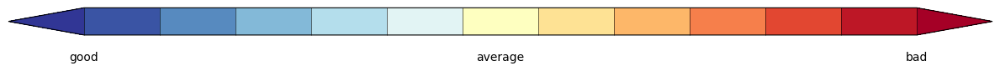

In [37]:
# Settings
n_bins = 11
figsize = (12, 1)

# Get the original colormap
orig_cmap = plt.get_cmap('RdYlBu_r')

# Create a new colormap shifted inward
new_colors = orig_cmap(np.linspace(0.05, 0.95, n_bins))
new_cmap = mcolors.ListedColormap(new_colors)

# Create a ScalarMappable with the shifted colormap
boundaries = np.linspace(0, 1, n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=n_bins)

# Build the figure
fig, ax = plt.subplots(figsize=figsize)
fig.subplots_adjust(bottom=0.5)

sm = plt.cm.ScalarMappable(norm=norm, cmap=new_cmap)

# Create the colorbar with original extension colors
cbar = fig.colorbar(
    sm,
    cax=ax,
    orientation='horizontal',
    extend='both',
    extendfrac='auto',
    ticks=[],
    drawedges=True,
)

# Set the extension colors manually to original colormap extremes
cbar.cmap.set_under(orig_cmap(0.0))  # Deep color for low extension
cbar.cmap.set_over(orig_cmap(1.0))   # Deep color for high extension
sm.set_cmap(cbar.cmap)  # Update mappable with new cmap including extensions

ax.minorticks_off()

# Add manual labels
fontsize=10
ax.text(0, -0.8, 'good', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(0.5, -0.8, 'average', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(1, -0.8, 'bad', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
plt.tight_layout()
plt.savefig(os.path.join(supplementary_output_path, 'table_cbar.png'), dpi=400)
plt.show()

#### Regional Ranked Table

In [14]:
start_year, end_year = 2003, 2019
static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, f'static_results_regional_{start_year}_{end_year}.csv'), header=[0, 1], index_col=0)
results_gfed = pd.read_csv(os.path.join(logs_path, f'results_regional_{start_year}_{end_year}.csv'), index_col=0)

results_gfed_combined = deepcopy(static_results_gfed)
for region in results_gfed.columns:
    results_gfed_combined.loc[slice(None), (region, 'BuRNN')] = results_gfed.loc[slice(None), region]
results_gfed_combined = results_gfed_combined.sort_index(axis=1,level=[0,1])

results_gfed_combined = results_gfed_combined.rename({'rmse': 'RMSE', 'spatial_rmse': 'Spatial RMSE', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'})

ranking_df = pd.DataFrame(index=results_gfed_combined.index,
                          columns=results_gfed_combined.columns.unique(level='Region'))

for region in ranking_df.columns:
    for metric in results_gfed_combined.index:
        # Get the scores.
        metric_scores = results_gfed_combined.loc[metric, region]
        
        # For rmse metrics (assumed to start with 'rmse') lower is better;
        # for correlations, higher is better.
        if 'RMSE' in metric:
            rank = metric_scores.rank(method='min', ascending=True)['BuRNN']
        else:
            rank = metric_scores.rank(method='min', ascending=False)['BuRNN']
        
        # Save the rank as an integer (1 being best)
        ranking_df.loc[metric, region] = int(rank)
ranking_df

Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
RMSE,1,1,5,1,1,6,1,2,1,1,1,1,1,1
Spatial RMSE,2,1,7,1,1,8,1,1,1,1,1,1,1,1
Correlation,1,1,1,1,1,3,1,1,1,1,1,1,1,1
Spatial Correlation,2,1,2,1,1,3,1,1,1,1,1,1,1,1
Monthly Correlation,1,1,9,4,1,2,1,1,1,1,1,2,1,1
Yearly Correlation,1,1,1,3,1,1,1,2,2,1,5,2,1,1


In [15]:
n_bins = 10

# Get the original colormap
orig_cmap = plt.get_cmap('RdYlBu_r')

# Create a new colormap shifted inward
new_colors = orig_cmap(np.linspace(0, 1, n_bins))
new_cmap = mcolors.ListedColormap(new_colors)

# Create a ScalarMappable with the shifted colormap
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=n_bins)


def color_from_rank(rank):
    return f'background-color: {mcolors.rgb2hex(new_cmap(rank-1))}'

rank_copy = deepcopy(ranking_df)
#rank_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in rank_copy.index])

style_df = rank_copy.applymap(color_from_rank)

results_copy = deepcopy(results_gfed_combined).loc[slice(None), (slice(None), 'BuRNN')].droplevel('Model', axis=1)
#results_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in results_copy.index])

styled_predicted = results_copy.style.format(precision=2).apply(lambda _: style_df, axis=None)

styled_predicted

/tmp/ipykernel_3234238/1485595529.py:20: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  style_df = rank_copy.applymap(color_from_rank)


Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
RMSE,2.50,1.18,0.46,0.98,1.18,0.66,0.39,0.33,3.17,0.75,2.48,3.31,1.00,0.43
Spatial RMSE,0.64,0.27,0.10,0.39,0.27,0.33,0.11,0.13,0.99,0.31,0.90,1.07,0.43,0.13
Correlation,0.32,0.46,0.12,0.53,0.33,0.39,0.34,0.20,0.78,0.65,0.60,0.76,0.45,0.14
Spatial Correlation,0.71,0.70,0.30,0.55,0.63,0.41,0.64,0.35,0.90,0.77,0.60,0.88,0.55,0.30
Monthly Correlation,0.78,0.88,0.36,0.89,0.76,0.89,0.73,0.74,0.99,0.96,0.93,0.97,0.94,0.72
Yearly Correlation,0.87,0.66,0.49,0.85,0.67,0.95,0.69,0.13,0.80,0.81,0.73,0.67,0.76,0.87


In [35]:
latex_code = styled_predicted.to_latex(hrules=False, 
                                        caption='Regional ranking scores of \gls{model} and the FireMIP models.', 
                                        convert_css=True,
                                        position_float='centering'
                                        )

<>:2: SyntaxWarning: invalid escape sequence '\g'
<>:2: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_716024/452964244.py:2: SyntaxWarning: invalid escape sequence '\g'
  caption='Regional ranking scores of \gls{model} and the FireMIP models.',


In [36]:
print(' \hhline{~--------------}  \n'.join(latex_code.split('\n')[5:-3]))

{\scriptsize \gls{rmse}} & {\cellcolor[HTML]{313695}} 2.50 & {\cellcolor[HTML]{313695}} 1.18 & {\cellcolor[HTML]{EDF8DF}} 0.46 & {\cellcolor[HTML]{313695}} 0.98 & {\cellcolor[HTML]{313695}} 1.18 & {\cellcolor[HTML]{FEEDA4}} 0.66 & {\cellcolor[HTML]{313695}} 0.39 & {\cellcolor[HTML]{4A7AB7}} 0.33 & {\cellcolor[HTML]{313695}} 3.17 & {\cellcolor[HTML]{313695}} 0.75 & {\cellcolor[HTML]{313695}} 2.48 & {\cellcolor[HTML]{313695}} 3.31 & {\cellcolor[HTML]{313695}} 1.00 & {\cellcolor[HTML]{313695}} 0.43 \\ \hhline{~--------------}  
{\scriptsize Spatial \gls{rmse}} & {\cellcolor[HTML]{4A7AB7}} 0.64 & {\cellcolor[HTML]{313695}} 0.27 & {\cellcolor[HTML]{FDBF71}} 0.10 & {\cellcolor[HTML]{313695}} 0.39 & {\cellcolor[HTML]{313695}} 0.27 & {\cellcolor[HTML]{F67A49}} 0.33 & {\cellcolor[HTML]{313695}} 0.11 & {\cellcolor[HTML]{313695}} 0.13 & {\cellcolor[HTML]{313695}} 0.99 & {\cellcolor[HTML]{313695}} 0.31 & {\cellcolor[HTML]{313695}} 0.90 & {\cellcolor[HTML]{313695}} 1.07 & {\cellcolor[HTML]{313695}}

<>:1: SyntaxWarning: invalid escape sequence '\h'
<>:1: SyntaxWarning: invalid escape sequence '\h'
/tmp/ipykernel_716024/528025519.py:1: SyntaxWarning: invalid escape sequence '\h'
  print(' \hhline{~--------------}  \n'.join(latex_code.split('\n')[5:-3]))


#### Global Table (firecci51)

In [66]:
firecci_5_1_da = xr.open_dataset(os.path.join(supplementary_data_path, 'FireCCI5.1_Burned_Percentage.nc')).percentage_of_area_burned
firecci_5_1_da = preprocess_time(firecci_5_1_da)
firecci_5_1_da = firecci_5_1_da.where(firecci_5_1_da<101, np.nan)
firecci_5_1_da = constrain_time(firecci_5_1_da, start_year=1997, end_year=2019)
firecci_5_1_da = firecci_5_1_da.assign_coords({'Region': predicted_da.Region})
firecci_5_1_cube = firecci_5_1_da.to_iris()
firecci_5_1_cube.rename('burntarea-total')
firecci_5_1_cube.coords('latitude')[0].guess_bounds()
firecci_5_1_cube.coords('latitude')[0].units = 'degrees'
firecci_5_1_cube.coords('latitude')[0].coord_system = cs
firecci_5_1_cube.coords('longitude')[0].guess_bounds()
firecci_5_1_cube.coords('longitude')[0].units = 'degrees'
firecci_5_1_cube.coords('longitude')[0].coord_system = cs
firecci_5_1_cube.var_name = firecci_5_1_cube.long_name
firecci_5_1_cube.long_name = 'FireCCi5.1'

regions_masked = AR6_masks[1].copy()
regions_masked.data = np.ones_like(regions_masked.data)
for mask in AR6_masks.values():
    regions_masked *= mask

firecci_5_1_cube = iris.util.mask_cube(firecci_5_1_cube, regions_masked, in_place=False, dim=0)

firecci_5_1_da_mha = xr.DataArray.from_iris(to_mha(firecci_5_1_cube))
firecci_5_1_df = firecci_5_1_da_mha.groupby(predicted_da_mha.Region).sum().to_pandas()
firecci_5_1_df = firecci_5_1_df.rename(columns=AR6_idx_name)
firecci_5_1_df_yearly = firecci_5_1_df.resample('YS').sum()

firecci_5_1_cube_gfed = deepcopy(firecci_5_1_cube)
firecci_5_1_cube_gfed.coords('Region')[0].points = gfed_regions.values
firecci_5_1_da_mha_gfed = xr.DataArray.from_iris(to_mha(firecci_5_1_cube_gfed))
firecci_5_1_df_gfed = firecci_5_1_da_mha_gfed.groupby(firecci_5_1_da_mha_gfed.Region).sum().to_pandas()
firecci_5_1_df_gfed = firecci_5_1_df_gfed.rename(columns=gfed_idx_name)
firecci_5_1_df_yearly_gfed = firecci_5_1_df_gfed.resample('YS').sum()

In [71]:
start_year, end_year = 2003, 2019
with open(os.path.join(supplementary_output_path, f'static_results_{start_year}_{end_year}_firecci51.json'), 'r') as f:
    static_results = json.load(f)
results_df = pd.DataFrame()
for metric, metric_dict in static_results.items():
    for model, value in metric_dict.items():
        results_df.loc[metric.replace('_', ''), model] = value
with open(os.path.join(logs_path, f'results_{start_year}_{end_year}.tex'), 'w') as f:
    obs_cube_constrained = constrain_time(firecci_5_1_cube, start_year, end_year)
    predicted_cube_constrained = constrain_time(predicted_cube, start_year, end_year)
    print(f'{run_name}: {start_year} - {end_year}')
    print('RMSE (in %)')
    result = round(RMSE(predicted_cube_constrained, obs_cube_constrained), 2)
    metric_name = 'rmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    

    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(cube)
    print('Spatio-Temporal Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'corr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)

    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial Correlation')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'spatialcorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
    print('Temporal Correlation (monthly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'monthlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
    print('Temporal Correlation (yearly)')
    result = round(xr.corr(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)).item(), 2)
    metric_name = 'yearlycorr'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
    
    from numpy.linalg import lstsq
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    def calculate_trend(cube):
        y = to_annual(to_global(to_mha(cube))).data
        x = np.arange(len(y))
        res = stats.linregress(x, y)
        # Two-sided inverse Students t-distribution
        # p - probability, df - degrees of freedom
        tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
        ts = tinv(0.05, len(x)-2)
        return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
        #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
    print('Trend (in Mha per year)')
    print('GFED5', calculate_trend(obs_cube_constrained))
    print('BuRNN', calculate_trend(predicted_cube_constrained))


    warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
    pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
    print('Spatial RMSE (in %)')
    result = round(RMSE(pipeline(predicted_cube_constrained), pipeline(obs_cube_constrained)), 2)
    metric_name = 'spatialrmse'
    results_df.loc[metric_name, 'LSTM'] = result
    mean, stddev = results_df.loc[metric_name].mean(), results_df.loc[metric_name].std()    
    f.write("\\newcommand{\\" + metric_name +"}{" + str(result) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"mean}{" + str(mean) + "}\n")
    f.write("\\newcommand{\\" + metric_name +"std}{" + str(stddev) + "}\n")
    print('BuRNN', result)
results_df = results_df.reindex(columns=['LSTM'] + list(results_df.columns[:-1])).rename({'LSTM': 'BuRNN'}, axis=1)
results_df = results_df.rename({
    'rmse': 'RMSE',
    'spatialrmse': 'Spatial RMSE',
    'corr': 'Correlation',
    'spatialcorr': 'Spatial Correlation',
    'monthlycorr': 'Monthly Correlation', 
    'yearlycorr': 'Yearly Correlation'
})

/apps/brussel/RL9/zen4/software/SciTools-Iris/3.13.0-foss-2024a/lib/python3.12/site-packages/iris/common/mixin.py:203: FutureWarning: You are using legacy date precision for Iris units - max precision is seconds. In future, Iris will use microsecond precision - available since cf-units version 3.3 - which may affect core behaviour. To opt-in to the new behaviour, set `iris.FUTURE.date_microseconds = True`.
  warnings.warn(message, category=FutureWarning)


mse_1_64_log_NLL1_nospei_nograsses_seperateheads_normalizetargetsfold_lambda1000: 2003 - 2019
RMSE (in %)
BuRNN 1.65
Spatio-Temporal Correlation
BuRNN 0.62
Spatial Correlation
BuRNN 0.84
Temporal Correlation (monthly)
BuRNN 0.89
Temporal Correlation (yearly)
BuRNN 0.89
Trend (in Mha per year)
GFED5 -6.69 ± 2.85
BuRNN -4.68 ± 1.89
Spatial RMSE (in %)
BuRNN 0.59


In [74]:
results_df.to_csv(os.path.join(logs_path, 'global_table_firecci.csv'))

In [ ]:
# Define the mean and stddev for each row
means = results_df.mean(axis=1)
stddevs = results_df.std(axis=1)
inverse = [True, True, False, False, False, False]

# Function to map a value to a color
def color_map(val, mean, stddev, inverse):
    normalized_val = (val - mean) / (2*stddev)
    if normalized_val > 1:
        normalized_val = 1
    elif normalized_val < -1:
        normalized_val = -1
    # Map normalized value to a color in the BrBG colormap
    if inverse:
        color = plt.cm.RdYlBu_r((normalized_val + 1) / 2)
    else:
        color = plt.cm.RdYlBu((normalized_val + 1) / 2) #BrBG
    return f'background-color: rgb({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)})'

results_df.columns = [results_df.columns[0]] + [el.upper() for el in results_df.columns[1:]]
# Apply the style
styled_df = results_df.style.set_properties(**{'height': '50px'}).apply(lambda x: [color_map(val, mean, stddev, inverse) for val, mean, stddev, inverse in zip(x, means, stddevs, inverse)], axis=0)


latex_code = styled_df.format(precision=2).to_latex(hrules=False, 
                                                    caption='Global evaluation scores of \gls{model} and the FireMIP models.', 
                                                    convert_css=True,
                                                    position_float='centering'
                                                    )

In [47]:
styled_df

,\gls{model},CLASSIC,ELM-ECA,JULES-INFERNO-VN6P3,LPJ-GUESS-SIMFIRE-BLAZE,LPJ-GUESS-SPITFIRE,LPJML5-7-10-FIRE,ORCHIDEE-MICT,SSIB4-TRIFFID-FIRE,VISIT
\gls{rmse},1.65,1.95,2.85,1.81,2.00,1.95,2.11,2.63,1.73,2.18
Spatial \gls{rmse},0.59,0.79,0.83,0.59,0.60,0.70,0.69,1.19,0.56,1.10
Correlation,0.62,0.35,0.08,0.32,0.27,0.25,0.27,0.15,0.48,0.01
Spatial Correlation,0.84,0.59,0.28,0.61,0.58,0.44,0.54,0.37,0.70,0.00
Monthly Correlation,0.89,0.63,0.01,0.49,0.63,0.49,0.49,0.08,0.85,0.16
Yearly Correlation,0.89,0.75,0.11,0.59,0.40,0.26,0.10,-0.22,0.75,-0.49


In [46]:
print(' \hhline{~----------}  \n'.join(latex_code.split('\n')[5:-3]))

\gls{rmse} & {\cellcolor[rgb]{0.486, 0.702, 0.831}} 1.65 & {\cellcolor[rgb]{0.890, 0.957, 0.945}} 1.95 & {\cellcolor[rgb]{0.647, 0.000, 0.149}} 2.85 & {\cellcolor[rgb]{0.706, 0.867, 0.922}} 1.81 & {\cellcolor[rgb]{0.929, 0.973, 0.875}} 2.00 & {\cellcolor[rgb]{0.890, 0.957, 0.945}} 1.95 & {\cellcolor[rgb]{0.996, 0.980, 0.722}} 2.11 & {\cellcolor[rgb]{0.886, 0.286, 0.196}} 2.63 & {\cellcolor[rgb]{0.596, 0.792, 0.882}} 1.73 & {\cellcolor[rgb]{0.996, 0.925, 0.635}} 2.18 \\ \hhline{~----------}  
Spatial \gls{rmse} & {\cellcolor[rgb]{0.675, 0.851, 0.914}} 0.59 & {\cellcolor[rgb]{0.996, 0.961, 0.694}} 0.79 & {\cellcolor[rgb]{0.996, 0.910, 0.612}} 0.83 & {\cellcolor[rgb]{0.663, 0.847, 0.910}} 0.59 & {\cellcolor[rgb]{0.690, 0.859, 0.918}} 0.60 & {\cellcolor[rgb]{0.914, 0.965, 0.902}} 0.70 & {\cellcolor[rgb]{0.894, 0.957, 0.937}} 0.69 & {\cellcolor[rgb]{0.675, 0.027, 0.149}} 1.19 & {\cellcolor[rgb]{0.604, 0.800, 0.882}} 0.56 & {\cellcolor[rgb]{0.863, 0.227, 0.169}} 1.10 \\ \hhline{~----------} 

<>:1: SyntaxWarning: invalid escape sequence '\h'
<>:1: SyntaxWarning: invalid escape sequence '\h'
/tmp/ipykernel_716024/456070316.py:1: SyntaxWarning: invalid escape sequence '\h'
  print(' \hhline{~----------}  \n'.join(latex_code.split('\n')[5:-3]))


#### Regional Ranked Table (FireCCi5.1)

In [76]:
start_year, end_year = 2003, 2019
static_results_gfed = pd.read_csv(os.path.join(supplementary_output_path, f'static_results_regional_{start_year}_{end_year}_firecci51.csv'), header=[0, 1], index_col=0)
results_gfed = pd.read_csv(os.path.join(logs_path, f'results_regional_{start_year}_{end_year}_firecci51.csv'), index_col=0).drop('Global', axis=1)

results_gfed_combined = deepcopy(static_results_gfed)
for region in results_gfed.columns:
    results_gfed_combined.loc[slice(None), (region, 'BuRNN')] = results_gfed.loc[slice(None), region]
results_gfed_combined = results_gfed_combined.sort_index(axis=1,level=[0,1])

results_gfed_combined = results_gfed_combined.rename({'rmse': 'RMSE', 'spatial_rmse': 'Spatial RMSE', 'corr': 'Correlation', 'spatial_corr': 'Spatial Correlation', 'monthly_corr': 'Monthly Correlation', 'yearly_corr': 'Yearly Correlation'})

ranking_df = pd.DataFrame(index=results_gfed_combined.index,
                          columns=results_gfed_combined.columns.unique(level='Region'))

for region in ranking_df.columns:
    for metric in results_gfed_combined.index:
        # Get the scores.
        metric_scores = results_gfed_combined.loc[metric, region]
        
        # For rmse metrics (assumed to start with 'rmse') lower is better;
        # for correlations, higher is better.
        if 'rmse' in metric:
            rank = metric_scores.rank(method='min', ascending=True)['BuRNN']
        else:
            rank = metric_scores.rank(method='min', ascending=False)['BuRNN']
        
        # Save the rank as an integer (1 being best)
        ranking_df.loc[metric, region] = int(rank)
ranking_df

Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
RMSE,10,10,6,6,8,4,9,9,10,10,3,9,9,10
Spatial RMSE,9,10,4,8,7,3,8,9,5,9,2,7,9,10
Correlation,1,1,2,1,1,3,1,1,1,1,1,1,1,1
Spatial Correlation,2,1,8,1,1,3,1,1,1,1,2,1,1,4
Monthly Correlation,1,1,10,3,5,1,1,1,1,1,3,1,3,1
Yearly Correlation,1,1,2,3,1,1,1,2,2,1,7,1,1,5


In [10]:
n_bins = 10

# Get the original colormap
orig_cmap = plt.get_cmap('RdYlBu_r')

# Create a new colormap shifted inward
new_colors = orig_cmap(np.linspace(0, 1, n_bins))
new_cmap = mcolors.ListedColormap(new_colors)

# Create a ScalarMappable with the shifted colormap
boundaries = np.linspace(0, 1, n_bins + 1)
norm = mcolors.BoundaryNorm(boundaries=boundaries, ncolors=n_bins)


def color_from_rank(rank):
    return f'background-color: {mcolors.rgb2hex(new_cmap(rank-1))}'

rank_copy = deepcopy(ranking_df)
rank_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in rank_copy.index])

style_df = rank_copy.applymap(color_from_rank)

results_copy = deepcopy(results_gfed_combined).loc[slice(None), (slice(None), 'BuRNN')].droplevel('Model', axis=1)
results_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in results_copy.index])

styled_predicted = results_copy.style.format(precision=2).apply(lambda _: style_df, axis=None)

styled_predicted

<>:19: SyntaxWarning: invalid escape sequence '\s'
<>:24: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
<>:24: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_716024/1715950389.py:19: SyntaxWarning: invalid escape sequence '\s'
  rank_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in rank_copy.index])
/tmp/ipykernel_716024/1715950389.py:24: SyntaxWarning: invalid escape sequence '\s'
  results_copy.index = pd.Index(['{'+ f'\scriptsize {index}' + '}' for index in results_copy.index])
/tmp/ipykernel_716024/1715950389.py:21: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  style_df = rank_copy.applymap(color_from_rank)


Region,AUST,BOAS,BONA,CEAM,CEAS,EQAS,EURO,MIDE,NHAF,NHSA,SEAS,SHAF,SHSA,TENA
{\scriptsize \gls{rmse}},2.68,0.94,0.46,0.93,1.15,0.70,0.32,0.26,3.44,0.85,1.78,3.88,1.12,0.49
{\scriptsize Spatial \gls{rmse}},0.58,0.18,0.10,0.52,0.27,0.38,0.11,0.10,1.37,0.39,0.81,1.46,0.48,0.13
{\scriptsize Correlation},0.31,0.36,0.05,0.29,0.22,0.28,0.31,0.16,0.70,0.59,0.34,0.65,0.37,0.09
{\scriptsize Spatial Correlation},0.73,0.64,0.06,0.35,0.45,0.36,0.59,0.30,0.86,0.70,0.47,0.81,0.54,0.13
{\scriptsize Monthly Correlation},0.83,0.81,0.10,0.81,0.53,0.90,0.81,0.78,0.94,0.92,0.74,0.96,0.88,0.63
{\scriptsize Yearly Correlation},0.91,0.66,0.24,0.64,0.74,0.95,0.62,0.19,0.64,0.68,-0.13,0.15,0.89,0.67


In [11]:
latex_code = styled_predicted.to_latex(hrules=False, 
                                        caption='Regional ranking scores of \gls{model} and the FireMIP models.', 
                                        convert_css=True,
                                        position_float='centering'
                                        )

<>:2: SyntaxWarning: invalid escape sequence '\g'
<>:2: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_716024/452964244.py:2: SyntaxWarning: invalid escape sequence '\g'
  caption='Regional ranking scores of \gls{model} and the FireMIP models.',


In [12]:
print(' \hhline{~--------------}  \n'.join(latex_code.split('\n')[5:-3]))

{\scriptsize \gls{rmse}} & {\cellcolor[HTML]{313695}} 2.68 & {\cellcolor[HTML]{313695}} 0.94 & {\cellcolor[HTML]{EDF8DF}} 0.46 & {\cellcolor[HTML]{EDF8DF}} 0.93 & {\cellcolor[HTML]{7FB6D6}} 1.15 & {\cellcolor[HTML]{FDBF71}} 0.70 & {\cellcolor[HTML]{4A7AB7}} 0.32 & {\cellcolor[HTML]{4A7AB7}} 0.26 & {\cellcolor[HTML]{313695}} 3.44 & {\cellcolor[HTML]{313695}} 0.85 & {\cellcolor[HTML]{F67A49}} 1.78 & {\cellcolor[HTML]{4A7AB7}} 3.88 & {\cellcolor[HTML]{4A7AB7}} 1.12 & {\cellcolor[HTML]{313695}} 0.49 \\ \hhline{~--------------}  
{\scriptsize Spatial \gls{rmse}} & {\cellcolor[HTML]{4A7AB7}} 0.58 & {\cellcolor[HTML]{313695}} 0.18 & {\cellcolor[HTML]{FDBF71}} 0.10 & {\cellcolor[HTML]{BDE2EE}} 0.52 & {\cellcolor[HTML]{BDE2EE}} 0.27 & {\cellcolor[HTML]{F67A49}} 0.38 & {\cellcolor[HTML]{7FB6D6}} 0.11 & {\cellcolor[HTML]{4A7AB7}} 0.10 & {\cellcolor[HTML]{FEEDA4}} 1.37 & {\cellcolor[HTML]{4A7AB7}} 0.39 & {\cellcolor[HTML]{DA362A}} 0.81 & {\cellcolor[HTML]{BDE2EE}} 1.46 & {\cellcolor[HTML]{4A7AB7}}

<>:1: SyntaxWarning: invalid escape sequence '\h'
<>:1: SyntaxWarning: invalid escape sequence '\h'
/tmp/ipykernel_716024/528025519.py:1: SyntaxWarning: invalid escape sequence '\h'
  print(' \hhline{~--------------}  \n'.join(latex_code.split('\n')[5:-3]))


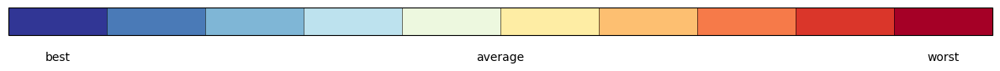

In [129]:
# Settings
figsize = (12, 1)

# Build the figure
fig, ax = plt.subplots(figsize=figsize)
fig.subplots_adjust(bottom=0.5)

sm = plt.cm.ScalarMappable(norm=norm, cmap=new_cmap)

# Create the colorbar with original extension colors
cbar = fig.colorbar(
    sm,
    cax=ax,
    orientation='horizontal',
    ticks=[],
    drawedges=True,
)

# Set the extension colors manually to original colormap extremes
cbar.cmap.set_under(orig_cmap(0.0))  # Deep color for low extension
cbar.cmap.set_over(orig_cmap(1.0))   # Deep color for high extension
sm.set_cmap(cbar.cmap)  # Update mappable with new cmap including extensions

ax.minorticks_off()

# Add manual labels
fontsize=10
ax.text(0.05, -0.8, 'best', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(0.5, -0.8, 'average', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
ax.text(0.95, -0.8, 'worst', ha='center', va='center', transform=ax.transAxes, fontsize=fontsize)
plt.tight_layout()
plt.savefig(os.path.join(supplementary_output_path, 'table_regions_cbar.png'), dpi=400)
plt.show()

#### Regional evaluation tables

In [88]:
region_tables = {}
for region in results_gfed_combined.columns.unique(level='Region'):
    region_data = deepcopy(results_gfed_combined.loc[slice(None), (region)])
    # Define the mean and stddev for each row
    means = region_data.mean(axis=1)
    stddevs = region_data.std(axis=1)
    inverse = [True, True, False, False, False, False]
    
    # Function to map a value to a color
    def color_map(val, mean, stddev, inverse):
        normalized_val = (val - mean) / (2*stddev)
        if normalized_val > 1:
            normalized_val = 1
        elif normalized_val < -1:
            normalized_val = -1
        # Map normalized value to a color in the BrBG colormap
        if inverse:
            color = plt.cm.RdYlBu_r((normalized_val + 1) / 2)
        else:
            color = plt.cm.RdYlBu((normalized_val + 1) / 2) #BrBG
        return f'background-color: rgb({int(color[0]*255)}, {int(color[1]*255)}, {int(color[2]*255)})'
    
    region_data.columns = ['{\\scriptsize ' + '\\gls{model}' + '}'] + ['{\\scriptsize ' + el.upper() + '}' for el in region_data.columns[1:]]
    region_data.index = pd.Index(['{\scriptsize ' + index + '}' for index in region_data.index])
    # Apply the style
    styled_df = region_data.style.set_properties(**{'height': '50px'}).apply(lambda x: [color_map(val, mean, stddev, inverse) for val, mean, stddev, inverse in zip(x, means, stddevs, inverse)], axis=0)
    
    region_tables[region] = styled_df
    latex_code = styled_df.format(precision=2).to_latex(hrules=False, 
                                                        caption='Evaluation scores of \gls{model} and the FireMIP models in \gls' +'{' + region.lower() + '}. Colour scaling is based on the normalized values with the minimum and maximum values set to -2 and 2 (sigma). Better scores are marked in blue, while worse performance is in red.', 
                                                        convert_css=True,
                                                        position_float='centering',
                                                        label=f'tab:evaluation_{region}'
                                                        )
    region_tables[region] = latex_code

<>:24: SyntaxWarning: invalid escape sequence '\s'
<>:30: SyntaxWarning: invalid escape sequence '\g'
<>:24: SyntaxWarning: invalid escape sequence '\s'
<>:30: SyntaxWarning: invalid escape sequence '\g'
/tmp/ipykernel_716024/1329867414.py:24: SyntaxWarning: invalid escape sequence '\s'
  region_data.index = pd.Index(['{\scriptsize ' + index + '}' for index in region_data.index])
/tmp/ipykernel_716024/1329867414.py:30: SyntaxWarning: invalid escape sequence '\g'
  caption='Evaluation scores of \gls{model} and the FireMIP models in \gls' +'{' + region.lower() + '}. Colour scaling is based on the normalized values with the minimum and maximum values set to -2 and 2 (sigma). Better scores are marked in blue, while worse performance is in red.',


#### Slope Table

In [ ]:
from scipy.stats import theilslopes
index = gfed_keys
index[0] = 'Global' #replace Ocean by global
slope_df = pd.DataFrame(index=index, columns=['GFED5', 'BuRNN'])

obs = constrain_time(obs_da_mha_gfed, 2003, 2019)
predicted = to_mha_xarray(constrain_time(predicted_da, 2003, 2019))
predicted['Region'] = obs_da_mha_gfed.Region

for region in index:
    if region != 'Global':
        obs_region = obs.where(obs_da_mha_gfed.Region == region)
        predicted_region = predicted.where(obs_da_mha_gfed.Region == region)
    else:
        obs_region = obs
        predicted_region = predicted
        
    obs_data = obs_region.sum(dim=['lat', 'lon']).groupby('time.year').sum().values
    predicted_data = predicted_region.sum(dim=['lat', 'lon']).groupby('time.year').sum().values
    
    slope, intercept, lo_slope, hi_slope = theilslopes(y=obs_data, x=np.arange(len(obs_data)), alpha=0.95)
    # Convert CI to ± form
    slope_uncertainty = (hi_slope - lo_slope) / 2
    slope_df.loc[region, 'GFED5'] = f"{slope:.2f} ± {slope_uncertainty:.2f}"

    slope, intercept, lo_slope, hi_slope = theilslopes(y=predicted_data, x=np.arange(len(predicted_data)), alpha=0.95)
    # Convert CI to ± form
    slope_uncertainty = (hi_slope - lo_slope) / 2
    slope_df.loc[region, 'BuRNN'] = f"{slope:.2f} ± {slope_uncertainty:.2f}"
print(slope_df.to_latex(label='tab:slopes', caption=r'Theil-Sen slopes of observed and modelled annual burned area for 2003-2019. The cells depict mean \(\pm\) 2SD of annual burned area trend in Mha per year.'))

#### Correlation (maps)

In [10]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
mask = ~np.isnan(xr.DataArray.from_iris(pixel_mean(obs_cube)).stack(pixel=['lat', 'lon']).values)
def get_pixel_corr(cube1, cube2, mask):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim='time')
    corr = corr.stack(pixel=['lat', 'lon'])[mask].dropna(dim='pixel')
    return corr
print('Temporal Correlation (pixel level)')
print('BuRNN', round(get_pixel_corr(predicted_cube, obs_cube, mask).values.mean(), 2))
for model in model_cubelist:
    print(model.long_name, round(get_pixel_corr(model, obs_cube, mask).values.mean(), 2))

Temporal Correlation (pixel level)
BuRNN 0.32
classic 0.22
elm-eca 0.1
jules-inferno-vn6p3 0.2
lpj-guess-simfire-blaze 0.11
lpj-guess-spitfire 0.17
lpjml5-7-10-fire 0.14
orchidee-mict 0.13
ssib4-triffid-fire 0.21
visit 0.15


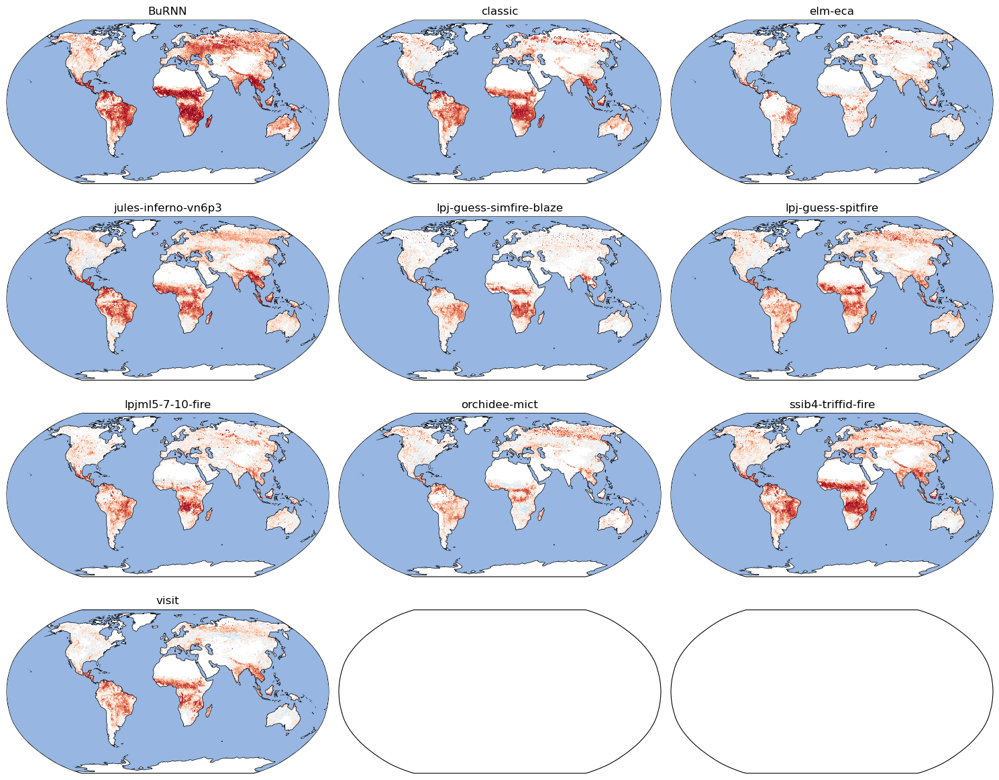

In [11]:
corr_maps = xr.Dataset()
def get_pixel_corr_map(cube1, cube2):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim='time')
    return corr
corr_maps['BuRNN'] = get_pixel_corr_map(predicted_cube, obs_cube)
for model in model_cubelist:
    corr_maps[model.long_name] = get_pixel_corr_map(model, obs_cube)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
number_of_plots = len(corr_maps)
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx, name in enumerate(corr_maps):
    ax = axs[idx]
    da = corr_maps[name]
    da.attrs['standard_name'] = None
    cube = da.to_iris()
    for coord in ('longitude', 'latitude'):
        cube.coords(coord)[0].guess_bounds()
    iplt.pcolormesh(cube, vmin=-1, vmax=1, axes=ax, cmap="RdBu_r")
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(name)
plt.tight_layout()
plt.savefig(os.path.join(figures_path, 'global_corr.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

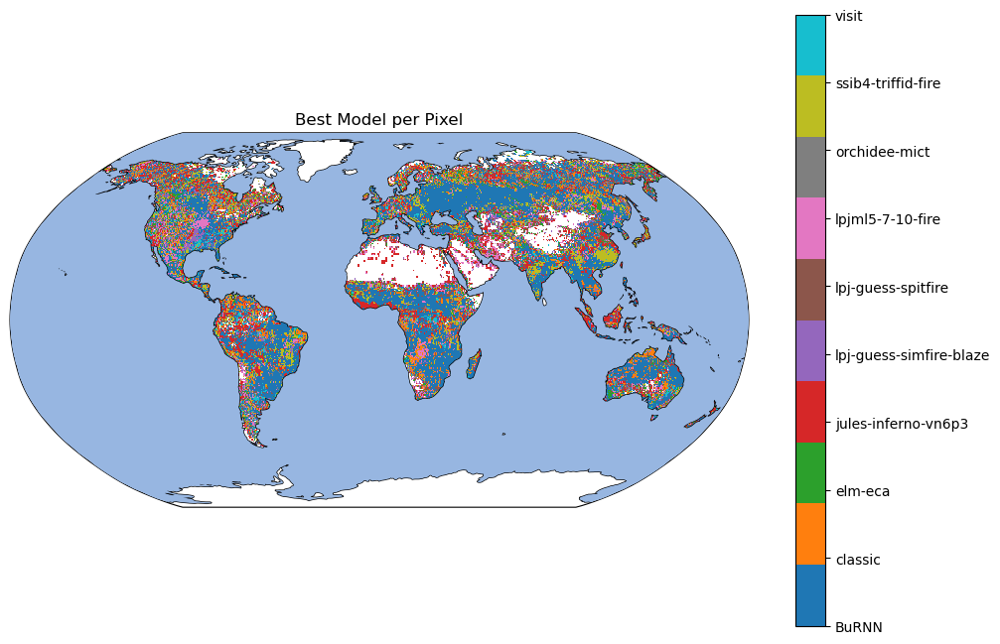

In [12]:
# Assume ds is your Dataset with 8 model performance variables and spatial dimensions "lat" and "lon"
models = list(corr_maps.data_vars.keys())

# Step 1: Concatenate along a new 'model' dimension
perf = xr.concat([corr_maps[m] for m in models], dim='model')
perf = perf.assign_coords(model=models)

# Create a mask for pixels where all values are NaN
mask_all_nan = perf.isnull().all(dim='model')

# Step 2: Fill NaN values with -infinity so they don’t interfere with argmax
perf_filled = perf.fillna(-np.inf)

# Find the index of the best model (highest performance) for each pixel
best_model_idx = perf_filled.argmax(dim='model')

# Optionally, set pixels that originally had all NaNs back to NaN in the result
best_model_idx = best_model_idx.where(~mask_all_nan)

# Create a figure and an axes with the Robinson projection.
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())

# Plot the best model DataArray.
# Since the data is in lat/lon coordinates, we use transform=ccrs.PlateCarree().
cmap = plt.get_cmap("tab10", len(models))
im = best_model_idx.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap=cmap,
    add_colorbar=False
)

# Add Cartopy features: ocean and coastlines.
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)

# Create a colorbar with ticks corresponding to the model indices.
cbar = plt.colorbar(im, ax=ax, orientation="vertical", pad=0.05, ticks=range(len(models)))
cbar.ax.set_yticklabels(models)

plt.title("Best Model per Pixel")
plt.show()

/apps/brussel/RL8/zen4/software/dask/2023.9.2-foss-2023a/lib/python3.11/site-packages/dask/array/core.py:1712: FutureWarning: The `numpy.argsort` function is not implemented by Dask array. You may want to use the da.map_blocks function or something similar to silence this warning. Your code may stop working in a future release.
  warnings.warn(


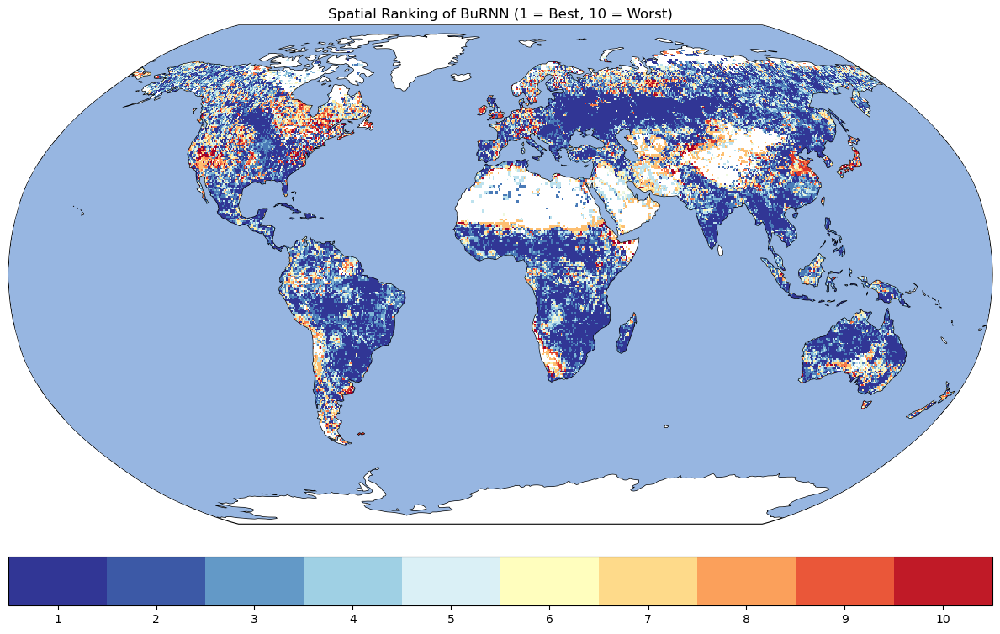

In [13]:
# Assume ds is your Dataset with 8 model performance variables
# and that the spatial dimensions are named "lat" and "lon"
models = list(corr_maps.data_vars.keys())

# Concatenate the model outputs into a single DataArray along a new "model" dimension
perf = xr.concat([corr_maps[m] for m in models], dim="model")
perf = perf.assign_coords(model=models)

# Fill NaNs with -infinity so that valid numbers always outrank NaNs
perf = perf.fillna(-np.inf)

# Ensure the "model" dimension is the first dimension.
# (Adjust "lat" and "lon" if your spatial dims have different names.)
perf = perf.transpose("model", "lat", "lon")

# Use NumPy's argsort to get the order that would sort the values in descending order.
# By sorting -perf.data along axis 0 (the "model" dimension), higher performance values come first.
desc_order = np.argsort(-perf.data, axis=0)  # shape: (num_models, lat, lon)

# Find the integer index corresponding to the "LSTM" model in our models list.
lstm_idx = models.index("BuRNN")

# For each (lat, lon), find the position (0-based) of lstm_idx in the sorted order.
# Adding 1 converts the rank to 1-based (1 = best, 8 = worst).
lstm_rank = (desc_order == lstm_idx).argmax(axis=0) + 1

# Convert the result back to an xarray DataArray for convenient plotting.
lstm_rank_da = xr.DataArray(
    lstm_rank,
    dims=["lat", "lon"],
    coords={"lat": perf.lat, "lon": perf.lon},
    name="BuRNN_Rank"
)

lstm_rank_da = lstm_rank_da.where(~mask_all_nan)

# Create a figure and an axes with the Robinson projection
fig = plt.figure(figsize=(12, 8))
ax = plt.axes(projection=ccrs.Robinson())

# Plot the DataArray.
# We use transform=ccrs.PlateCarree() because the data is in lat/lon coordinates.
im = lstm_rank_da.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap="RdYlBu_r",
    add_colorbar=False  # We'll add a customized colorbar below.
)

# Add cartopy features: coastlines and ocean.
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)

# Create a colorbar.
cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, ticks=np.arange(0.5, len(models)+.5), boundaries = np.arange(0, len(models)+1))
cbar.ax.set_xticklabels(np.arange(1, len(models)+1))

plt.title(f"Spatial Ranking of BuRNN (1 = Best, {len(models)} = Worst)")
plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'ranking.png'), dpi=400)
plt.show()

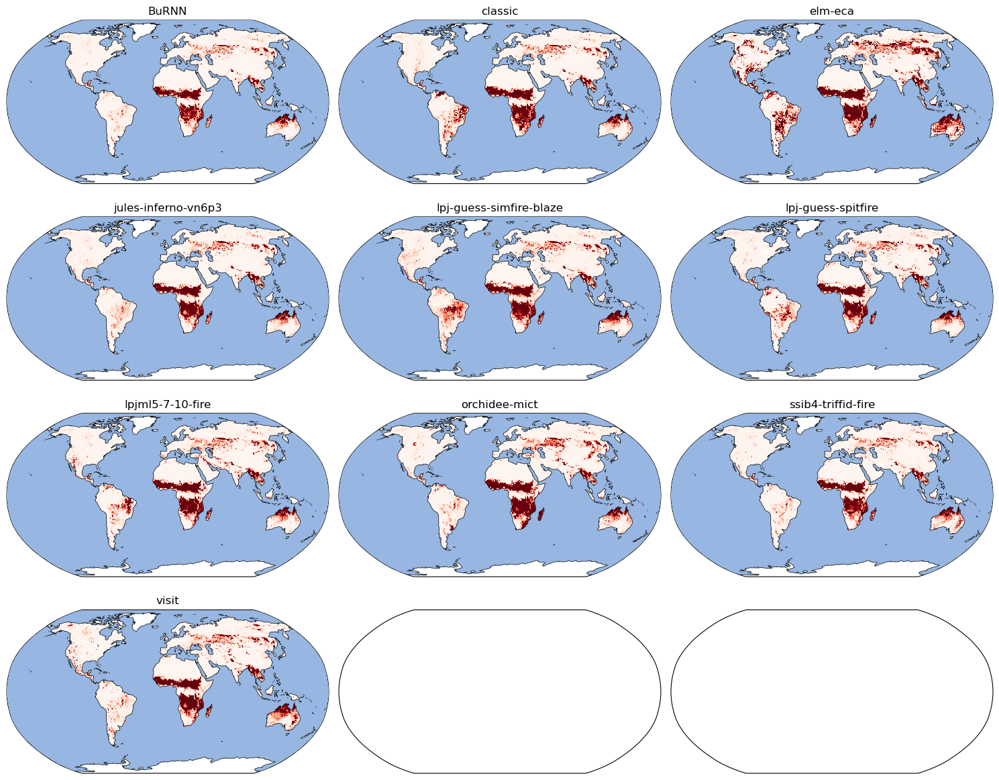

In [14]:
rmse_maps = xr.Dataset()
def get_pixel_rmse_map(cube1, cube2):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    rmse = (((da1 - da2)**2).mean(dim='time'))**1/2
    return rmse
rmse_maps['BuRNN'] = get_pixel_rmse_map(predicted_cube, obs_cube)

for model in model_cubelist:
    rmse_maps[model.long_name] = get_pixel_rmse_map(model, obs_cube)

warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
number_of_plots = len(rmse_maps)
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 12), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()
for idx, name in enumerate(rmse_maps):
    ax = axs[idx]
    da = rmse_maps[name]
    da.attrs['standard_name'] = None
    cube = da.to_iris()
    for coord in ('longitude', 'latitude'):
        cube.coords(coord)[0].guess_bounds()
    iplt.pcolormesh(cube, vmin=0, vmax=10, axes=ax, cmap="Reds")
    ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
    ax.add_feature(cartopy.feature.OCEAN, zorder=10)
    ax.set_title(name)
plt.tight_layout()
plt.savefig(os.path.join(figures_path, 'rmse_maps.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

/tmp/ipykernel_831141/2254002088.py:16: DeprecationWarning: Deleting a single level of a MultiIndex is deprecated. Previously, this deleted all levels of a MultiIndex. Please also drop the following variables: {'pixel'} to avoid an error in the future.
  corrs = corrs.drop_vars(['lat', 'lon', 'Region']).to_pandas()


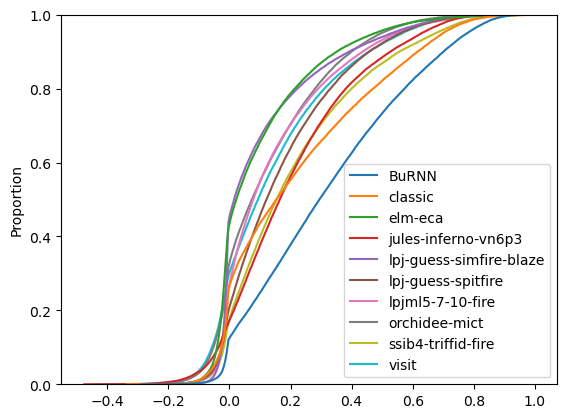

In [15]:
corrs = xr.Dataset()
fill = 'drop' #0
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
mask = ~np.isnan(xr.DataArray.from_iris(pixel_mean(obs_cube)).stack(pixel=['lat', 'lon']).values)
def get_pixel_corr(cube1, cube2, mask, fill=0):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim='time')
    corr = corr.stack(pixel=['lat', 'lon'])[mask]
    if isinstance(fill, float) or isinstance(fill, int):
        return corr.fillna(fill)
    return corr
corrs['BuRNN'] = get_pixel_corr(predicted_cube, obs_cube, mask, fill=fill)
for model in model_cubelist:
    corrs[model.long_name] = get_pixel_corr(model, obs_cube, mask, fill=fill)
corrs = corrs.drop_vars(['lat', 'lon', 'Region']).to_pandas()
sns.ecdfplot(corrs)
plt.savefig(os.path.join(figures_path, 'global_corr_lineplot.png'), dpi=300)

In [24]:
corrs_time = xr.Dataset()
fill = 'drop' #0
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
mask = ~np.isnan(xr.DataArray.from_iris(pixel_mean(obs_cube)).stack(pixel=['lat', 'lon']).values)
def get_time_corr(cube1, cube2):
    da1 = xr.DataArray.from_iris(cube1)
    da2 = xr.DataArray.from_iris(cube2)
    corr = xr.corr(da1, da2, dim=['lat', 'lon'])
    return corr
corrs_time['BuRNN'] = get_time_corr(predicted_cube, obs_cube)
for model in model_cubelist:
    corrs_time[model.long_name] = get_time_corr(model, obs_cube)
corrs_time = corrs_time.to_pandas().drop(columns='year')

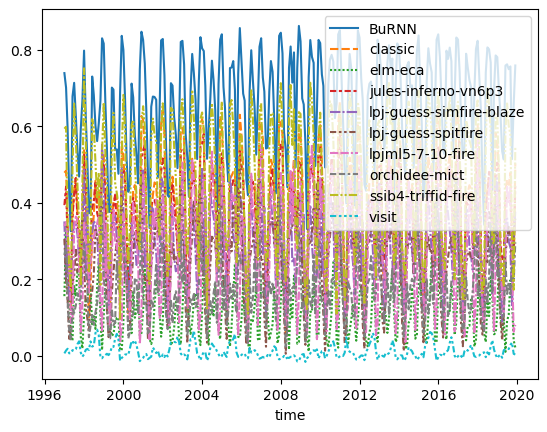

In [25]:
sns.lineplot(corrs_time)
plt.savefig(os.path.join(figures_path, 'monthly_corr_lineplot.png'), dpi=300)

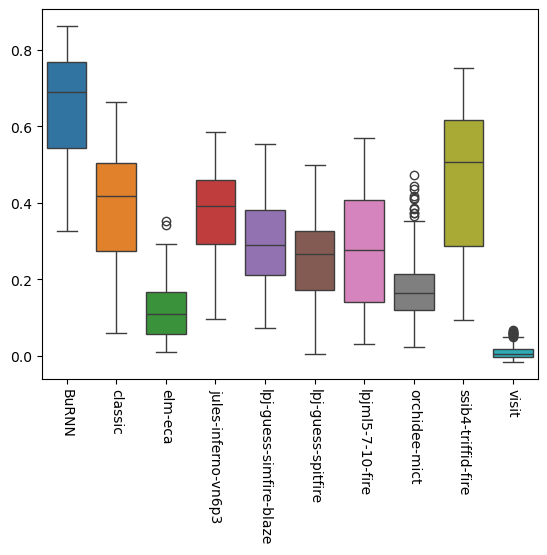

In [26]:
sns.boxplot(corrs_time)
plt.xticks(rotation=-90)
plt.savefig(os.path.join(figures_path, 'monthly_corr_boxplot.png'), dpi=300)
plt.show()

In [30]:
def calc_anomaly(da):
    return (da-da.mean(dim='time'))/da.std(dim='time')
obs_clim_anomaly = xr.DataArray.from_iris(obs_cube).groupby("time.month").apply(lambda da: calc_anomaly(da))
corrs_time_anomaly = xr.Dataset()
fill = 'drop' #0
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pred_clim_anomaly = xr.DataArray.from_iris(predicted_cube).groupby("time.month").apply(lambda da: calc_anomaly(da))
corrs_time_anomaly['BuRNN'] = xr.corr(obs_clim_anomaly, pred_clim_anomaly, dim=['lat', 'lon'])
for model in model_cubelist:
    model_clim_anomaly =  xr.DataArray.from_iris(model).groupby("time.month").apply(lambda da: calc_anomaly(da))
    corrs_time_anomaly[model.long_name] =  xr.corr(obs_clim_anomaly, model_clim_anomaly, dim=['lat', 'lon'])
corrs_time_anomaly = corrs_time_anomaly.to_pandas().drop(columns='year')

<Axes: xlabel='time'>

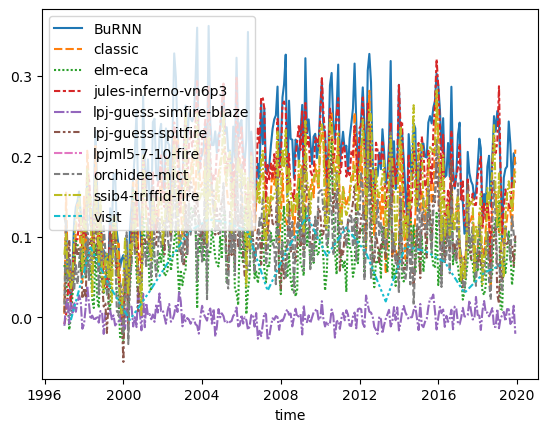

In [31]:
sns.lineplot(corrs_time_anomaly)

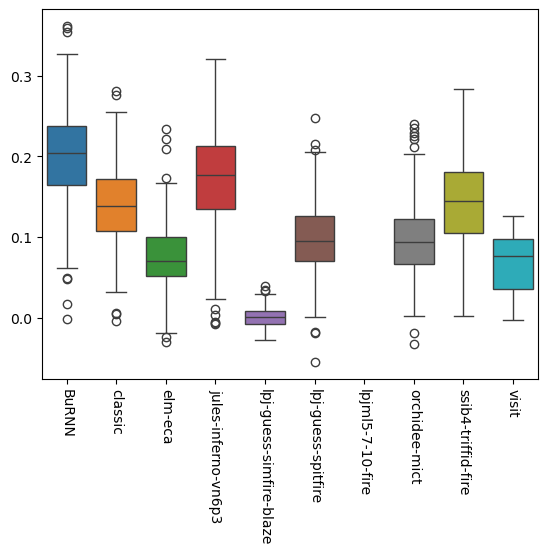

In [32]:
sns.boxplot(corrs_time_anomaly)
plt.xticks(rotation=-90)
plt.show()

#### IntegratedGradients

In [73]:
ig = torch.load(f"/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Models/Logs/{run_name}/IntegratedGradients_raw_zeros.pt", weights_only=False)

In [74]:
rename_map = {
 'managed_pastures': 'pastures',
 'rangeland': 'rangeland',
 'lightning-density': 'lightning',
 'rural-population': 'rural-pop',
 'urban-population': 'urban-pop',
 'gdp': 'gdp',
 'tasmax_monmean': 'temp',
 'pr_monmean': 'precip',
 'sfcwind_monmean': 'wind',
 'fwi': 'FWI',
 'gpp-total': 'GPP',
 'cveg-total': 'Cveg',
 'lai-total': 'LAI',
 'PCT_URBAN': 'urban',
 'PCT_LAKE': 'lake',
 'PCT_CROP': 'crop',
 'Bare Ground': 'bareground',
 'Needleleaf tree': 'Needletree',
 'Broadleaf evergreen tree': 'Br. E Tree',
 'Broadleaf deciduous tree': 'Br. D. Tree',
 'Broadleaf shrub - temperate': 'Br. shrub',
 'Broadleaf deciduous shrub - boreal': 'Br. shrub B',
 'C3 grass': 'C3 grass',
 'C4 grass': 'C4 grass'}

In [75]:
group_map = {
 'managed_pastures': 'socio+vegetation',
 'rangeland': 'socio+vegetation',
 'lightning-density': 'climate',
 'rural-population': 'socio',
 'urban-population': 'socio',
 'gdp': 'socio',
 'tasmax_monmean': 'climate',
 'pr_monmean': 'climate',
 'sfcwind_monmean': 'climate',
 'fwi': 'climate',
 'gpp-total': 'vegetation',
 'cveg-total': 'vegetation',
 'lai-total': 'vegetation',
 'PCT_URBAN': 'socio',
 'PCT_LAKE': 'static',
 'PCT_CROP': 'socio+vegetation',
 'Bare Ground': 'vegetation',
 'Needleleaf tree': 'vegetation',
 'Broadleaf evergreen tree': 'vegetation',
 'Broadleaf deciduous tree': 'vegetation',
 'Broadleaf shrub - temperate': 'vegetation',
 'Broadleaf deciduous shrub - boreal': 'vegetation',
 'C3 grass': 'vegetation',
 'C4 grass': 'vegetation'}
base_colors = sns.color_palette("deep", 8)
base_colors = base_colors[:3] + [base_colors[7]]
climate_col, socio_col, vegetation_col, static_col = base_colors
color_map = {
    "climate": climate_col,
    "socio": socio_col,
    "vegetation": vegetation_col,
    "static": static_col
}

/tmp/ipykernel_76744/1346078307.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([rename_map[idx] for idx in data.index])
/tmp/ipykernel_76744/1346078307.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([rename_map[idx] for idx in data.index])
/tmp/ipykernel_76744/1346078307.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([rename_map[idx] for idx in data.index])
/tmp/ipykernel_76744/1346078307.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([rename_map[idx] for idx in data.index])
/tmp/ipykernel_76744/1346078307.py:29: UserWarning: set_ticklabels() should only be 

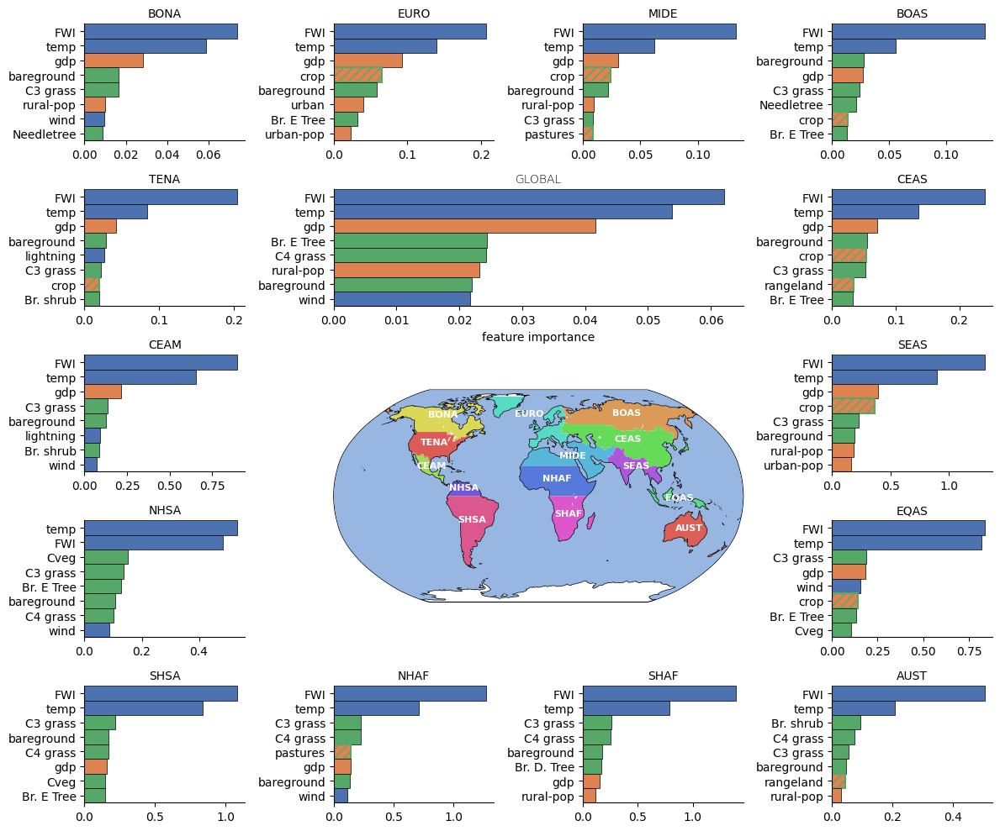

In [190]:
fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']
num_features = 8
outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            feature_importance = np.nanmean(np.abs(np.array(ig[regionname])[:, -1, :]), axis=(0))
            data = pd.DataFrame(index=group_map.keys(), data=feature_importance, columns=['feature importance']).sort_values("feature importance", ascending=False).head(num_features)
            data["group"] = data.index.map(group_map)
            ax = sns.barplot(
                data=data,
                y=data.index,
                x="feature importance",
                color="white",        # placeholder
                edgecolor="black",
                linewidth=0.5,
                orient='y',
                width=1
            )
            ax.set_ylabel("")
            ax.set_yticklabels([rename_map[idx] for idx in data.index])
            ax.set_xlabel("")
            
            bars = ax.patches  # list of bar rectangles
            
            for bar, (_, row) in zip(bars, data.iterrows()):
                group = row["group"]
                feature_name = row.name        # index used as the feature name
                width = bar.get_width()
                y = bar.get_y() + bar.get_height() / 2
            
                if "+" not in group:
                    # -------- single group --------
                    bar.set_facecolor(color_map[group])
                    bar.set_hatch("")  # solid
                else:
                    # -------- hybrid group --------
                    g1, g2 = group.split("+")
            
                    # base color
                    bar.set_facecolor(color_map[g1])
            
                    # hatch overlay using second color
                    bar.set_hatch("///")    # diagonal stripes
                    bar.set_edgecolor(color_map[g2])  # second group color outline
                    bar.set_linewidth(1.5)
            
            ax.set_title(regionname, fontsize=10) 
            plt.sca(ax)       
            idx += 1
            plt.margins(y=0) 
            sns.despine(left=False, bottom=False, right=True, top=True)

ax_global = fig.add_subplot(gs[1, 1:3])
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 

plt.sca(ax_global)

feature_importance = np.nanmean(np.abs(np.array(ig['Global'])[:, :, :]), axis=(0, 1))
data = pd.DataFrame(index=group_map.keys(), data=feature_importance, columns=['feature importance']).sort_values("feature importance", ascending=False).head(num_features)
data["group"] = data.index.map(group_map)
ax = sns.barplot(
    data=data,
    y=data.index,
    x="feature importance",
    color="white",        # placeholder
    edgecolor="black",
    linewidth=0.5,
    orient='y',
    width=1
)
plt.margins(y=0) 
ax.set_ylabel("")
ax.set_yticklabels([rename_map[idx] for idx in data.index])
sns.despine(left=False, bottom=False, right=True, top=True)

bars = ax.patches  # list of bar rectangles

for bar, (_, row) in zip(bars, data.iterrows()):
    group = row["group"]
    feature_name = row.name        # index used as the feature name
    width = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2

    if "+" not in group:
        # -------- single group --------
        bar.set_facecolor(color_map[group])
        bar.set_hatch("")  # solid
    else:
        # -------- hybrid group --------
        g1, g2 = group.split("+")

        # base color
        bar.set_facecolor(color_map[g1])

        # hatch overlay using second color
        bar.set_hatch("///")    # diagonal stripes
        bar.set_edgecolor(color_map[g2])  # second group color outline
        bar.set_linewidth(1.5)

#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)


plt.tight_layout()
plt.savefig(os.path.join(logs_path, 'IG.png'), dpi=400)
plt.show()

# Other Stuff

#### Create means

In [32]:
exclusion_list = ['FireCCILT11.nc', 'ssib4-triffid-fire_pfts.nc', 'spei_results.nc', 'fwi_month.nc', 'states_1901_2019_monthly_remapped_corrected.nc', 'spei04.nc', 'classic_pfts_monthly.nc']
features = [
    #'primf', 'primn', 'secdf', 'secdn', 'urban', 'c3ann', 'c4ann', 'c3per', 'c4per', 'c3nfx', 'pastr', 'range', 'secmb', 'secma', #14
    'managed_pastures', 'rangeland', #2
    'lightning-density', #1
    'rural-population', 'urban-population', #2
    'gdp', #1
    'tasmax_monmean', 'pr_monmean', 'sfcwind_monmean', #3
    'fwi', #1
    #'fwi_normalised',
    #'spei01', 'spei03', 'spei06', #3
    'gpp-total', 'cveg-total', 'lai-total', #3
    #'Broadleaf evergreen tree', 'Needleleaf evergreen tree', 'grass', 'savanna', 'shrub', 'tundra shrub', 'Broadleaf deciduous tree'
    'PCT_URBAN', 'PCT_LAKE', 'PCT_CROP', 'Bare Ground', 'Needleleaf tree', 'Broadleaf evergreen tree', 'Broadleaf deciduous tree', 'Broadleaf shrub - temperate', 'Broadleaf deciduous shrub - boreal', 'C3 grass', 'C4 grass' #11
    #, 'C4 grass Americas', 'C4 grass Africa', 'C4 grass Euraustralasia'
]
feature_transform = [(log_transform, ['lightning-density', 'rural-population', 'urban-population', 'gdp'])]
file_list = [os.path.join(data_path, filename) for filename in os.listdir(data_path) if (os.path.isfile(os.path.join(data_path, filename)) and filename not in exclusion_list)]
ds = xr.open_mfdataset(file_list, preprocess=partial(preprocess, variables=features+targets, start_year=1997, start_month=1, end_year=2019), engine='netcdf4', combine='nested', chunks={})
regionnames = np.full((360, 720), np.nan)
for regionname, region in gfed_masks.items():
    regionnames[~region.data] = regionname
ds = ds.assign_coords(coords={'Region': (('lat', 'lon'), regionnames)}).chunk(chunks={'time': -1, 'lat': 'auto', 'lon': 'auto'})
ds.attrs['region_encoding'] = str(gfed_idx_name)
for (func, variables) in feature_transform:
    ds[variables] = func(ds[variables])
nonnan_targets = ~np.isnan(ds[targets].isel(time=(ds[targets].time>=np.datetime64(datetime.datetime(1997, 1, 1, 0, 0, 0)))).to_array()).sum(dim=['variable', 'time']).values.astype(bool) 

In [36]:
def get_masked_coords(region_idcs):
    mask = ds.Region.isin(region_idcs)
    mask = mask & nonnan_targets
    masked_indices = mask.data.nonzero()
    masked_lats = mask.lat.isel(lat=masked_indices[0])
    masked_lons = mask.lon.isel(lon=masked_indices[1])
    masked_coords = list(zip(masked_lats.values, masked_lons.values))
    return masked_coords

In [39]:
folds_idcs = [[AR6_name_idx[regionname] for regionname in fold] for fold in folds]
folds_coords = [get_masked_coords(fold_idx) for fold_idx in folds_idcs]
all_coords = [coord for coords in folds_coords for coord in coords]
val_coords = []
test_coords = []
train_x_mean = 0
train_x_std = 1
train_y_mean = 0
train_y_std = 1
val_folds_idx = []
test_folds_idx = []
val_folds = []
test_folds = []

In [40]:
if val_folds:
    val_folds_idx = []
    val_coords = []
    if val_folds:
        for val_fold in val_folds:
            val_fold_idx = folds.index(val_fold)
    for val_fold in val_folds:
        val_fold_idx = folds.index(val_fold)
        val_folds_idx.append(val_fold_idx)
        val_coords += folds_coords[val_fold_idx]
    val_coords = [fold_coord for idx, fold_coord in enumerate(folds_coords) if idx in val_folds_idx]
    val_coords = [coord for coords in val_coords for coord in coords]

In [44]:
ds_stacked = ds.stack(sample=['lat', 'lon'])
x = ds_stacked[features].chunk({'time': -1, 'sample': 'auto'}).sel(sample=all_coords).transpose('sample', 'time').to_array()
y = ds_stacked[targets].chunk({'time': -1, 'sample': 'auto'}).sel(sample=all_coords).transpose('sample', 'time').to_array()

if feature_transform:
    for (func, variables) in feature_transform:
        if variables == 'all' or variables == ['all']:
            boolean_var_list = [True for var in x['variable']]
        else:
            if isinstance(variables, str):
                variables = [variables]
            boolean_var_list = [var in variables for var in x['variable']]
        x.loc[boolean_var_list] = func(x.loc[boolean_var_list])
    #self.x = self.hparams.feature_transform(self.x)
if target_transform:
    y = target_transform(y)
    
ds_transformed = xr.concat([x, y], dim='variable')

In [45]:
fold_datasets = [ds_transformed.sel(sample=fold_coords) for fold_coords in folds_coords]
fold_datasets = [ReconstructionDataset(dataset, features=features, targets=targets, spinup_length=spinup_length, prediction_length=prediction_length) for dataset in fold_datasets]

In [57]:
fold_datasets[0].hparams.data_arr.sel(variable = features).transpose('sample', 'time', 'variable')['variable']

<xarray.DataArray 'variable' (variable: 24)> Size: 192B
array(['managed_pastures', 'rangeland', 'lightning-density',
       'rural-population', 'urban-population', 'gdp', 'tasmax_monmean',
       'pr_monmean', 'sfcwind_monmean', 'fwi', 'gpp-total', 'cveg-total',
       'lai-total', 'PCT_URBAN', 'PCT_LAKE', 'PCT_CROP', 'Bare Ground',
       'Needleleaf tree', 'Broadleaf evergreen tree',
       'Broadleaf deciduous tree', 'Broadleaf shrub - temperate',
       'Broadleaf deciduous shrub - boreal', 'C3 grass', 'C4 grass'],
      dtype=object)
Coordinates:
  * variable  (variable) object 192B 'managed_pastures' ... 'C4 grass'

In [25]:
ds.groupby('Region').mean(dim=['time', 'stacked_lat_lon']).to_array().T.to_netcdf(os.path.join(supplementary_output_path, 'gfed_X_means.nc'))

In [66]:
x.groupby('Region').mean(dim=['sample', 'time']).T.to_netcdf(os.path.join(supplementary_output_path, 'gfed_x_means.nc'))

#### CDFs

In [9]:
start_year, end_year = 1997, 2019

obs_da_gfed = deepcopy(obs_da)
obs_da_gfed['Region'] = obs_da_mha_gfed.Region
obs_da_gfed = constrain_time(obs_da_gfed, start_year, end_year)

predicted_da_gfed = deepcopy(constrain_time(predicted_da, start_year, end_year))
predicted_da_gfed['Region'] = obs_da_gfed.Region

In [10]:
obs_region = obs_da_gfed.where(obs_da_gfed.Region == 'EURO', drop=True).values.flatten()
obs_region = obs_region[~np.isnan(obs_region)]

In [ ]:
pd.concat([pd.Series(obs_region), pd.Series(obs_region)], keys=['GFED5', 'BuRNN'], axis=1).stack().reset_index(level=(1)).rename(columns={'level_1': 'Model', 0: 'Burned Fraction'})

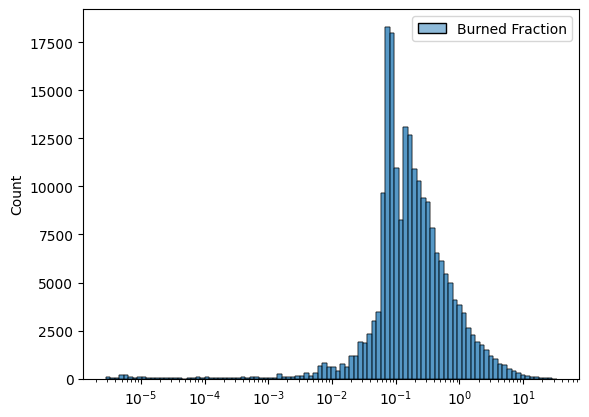

In [39]:
data = pd.concat([pd.Series(obs_region), pd.Series(obs_region)], keys=['GFED5', 'BuRNN'], axis=0)

In [43]:
data

GFED5  0          0.0000
       1          0.0000
       2          0.0000
       3          0.0000
       4          0.0000
                   ...  
BuRNN  1479355    0.0473
       1479356    0.0000
       1479357    0.0000
       1479358    0.0000
       1479359    0.0000
Length: 2958720, dtype: float64

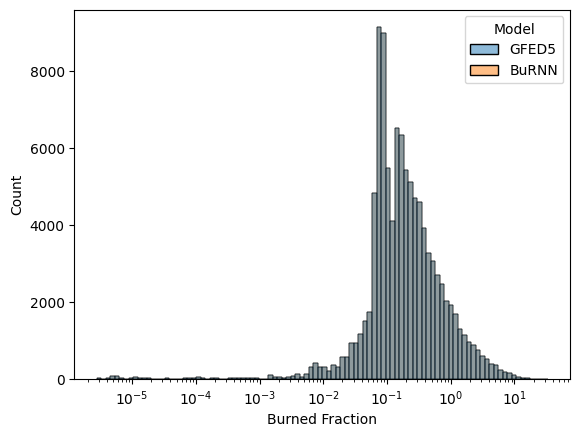

In [48]:
sns.histplot(data=df, x="Burned Fraction", bins=100, log_scale=True, hue='Model', alpha=0.5)
plt.show()

,level_1,0
0,GFED5,0.0
0,BuRNN,0.0
1,GFED5,0.0
1,BuRNN,0.0
2,GFED5,0.0
...,...,...
1479357,BuRNN,0.0
1479358,GFED5,0.0
1479358,BuRNN,0.0
1479359,GFED5,0.0


BONA
EURO
MIDE
BOAS
TENA
CEAS
CEAM
SEAS
NHSA
EQAS
SHSA
NHAF
SHAF
AUST


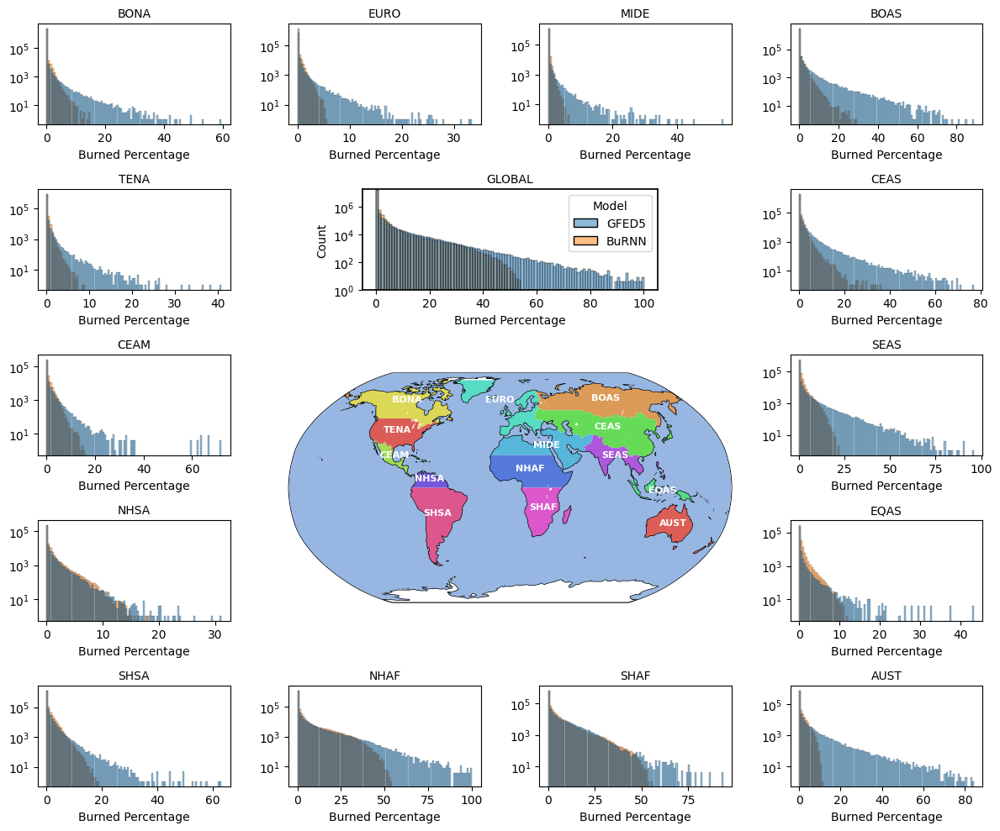

In [94]:
import matplotlib.gridspec as gridspec

start_year, end_year = 1997, 2019

obs_da_gfed = deepcopy(obs_da)
obs_da_gfed['Region'] = obs_da_mha_gfed.Region
obs_da_gfed = constrain_time(obs_da_gfed, start_year, end_year)

predicted_da_gfed = deepcopy(constrain_time(predicted_da, start_year, end_year))
predicted_da_gfed['Region'] = obs_da_gfed.Region

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']


outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            print(regionname)
            obs_region = obs_da_gfed.where(obs_da_gfed.Region == regionname, drop=True).values.flatten()
            obs_region = obs_region[~np.isnan(obs_region)]

            predicted_region = predicted_da_gfed.where(predicted_da_gfed.Region == regionname, drop=True).values.flatten()
            predicted_region = predicted_region[~np.isnan(predicted_region)]


            # Build a tidy DataFrame
            df = pd.DataFrame({
                "Burned Percentage": np.concatenate([obs_region, predicted_region]),
                "Model": ["GFED5"] * len(obs_region) + ["BuRNN"] * len(predicted_region)
            })
            ax.set_title(regionname, fontsize=10) 
            _ = sns.histplot(data=df, x="Burned Percentage", bins=100, log_scale=(False, False), hue='Model', alpha=0.5, fill=True, element="bars", legend=False)
            idx += 1
            ax.set_ylabel('')
            plt.yscale('log')

ax_global = fig.add_subplot(gs[1, 1:3])
obs_region = obs_da_gfed.values.flatten()
obs_region = obs_region[~np.isnan(obs_region)]

predicted_region = predicted_da_gfed.values.flatten()
predicted_region = predicted_region[~np.isnan(predicted_region)]

df = pd.DataFrame({
    "Burned Percentage": np.concatenate([obs_region, predicted_region]),
    "Model": ["GFED5"] * len(obs_region) + ["BuRNN"] * len(predicted_region)
})

ax_global.set_title('GLOBAL', fontsize=10) 
_ = sns.histplot(data=df, x="Burned Percentage", bins=100, log_scale=(False, False), hue='Model', alpha=0.5)
ax_global.set_ylabel('Count')
ax_global.set_xlabel('Burned Percentage')
ax_global.set_ylim(bottom=1)
plt.yscale('log')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)

plt.savefig(os.path.join(logs_path, f'Histogram_gfed_regions_{start_year}_{end_year}.png'), dpi=400)
plt.show()

#### SHAP

In [3]:
import shap

features = [
        #'primf', 'primn', 'secdf', 'secdn', 'urban', 'c3ann', 'c4ann', 'c3per', 'c4per', 'c3nfx', 'pastr', 'range', 'secmb', 'secma', #14
        'pastures', 'rangeland', #2
        'lightning', #1
        'rural-pop', 'urban-pop', #2
        'gdp', #1
        'tasmax', 'pr', 'sfcwind', #3
        'fwi', #1
        'spei01', 'spei03', 'spei06', #3
        'gpp', 'cveg', 'lai', #3
        #'Broadleaf evergreen tree', 'Needleleaf evergreen tree', 'grass', 'savanna', 'shrub', 'tundra shrub', 'Broadleaf deciduous tree'
        'urban', 'lake', 'crops', 'bare ground', 'needleleaf tree', 'evergreen tree', 'deciduous tree', 'shrub', 'boreal Shrub', 'C3 grass', 'C4 grass' #11
        , 'C4 grass Americas', 'C4 grass Africa', 'C4 grass Euraustralasia'
    ]

with open(os.path.join(logs_path, 'explanations.pickle'), 'rb') as handle:
    shap_dict = pickle.load(handle)

expl_dict = {}
values_dict = {region: [] for region in gfed_name_idx.keys() if region != 'OCEAN'}
data_dict = {region: [] for region in gfed_name_idx.keys() if region != 'OCEAN'}

for study_idx, shap_idx in shap_dict.items():
    for region_idx, (region, shap_idx_region) in enumerate(shap_idx.items()):
        for expl in shap_idx_region:
            values = np.stack(expl.values).mean(axis=0)
            data = expl.data
            values_dict[region].append(values)
            data_dict[region].append(data)

for region in values_dict.keys():
    region_data = np.concatenate(data_dict[region], axis=0)
    region_values = np.concatenate(values_dict[region], axis=0)   
    merged_explanation = shap.Explanation(
        values=region_values.mean(axis=1),
        data=region_data.mean(axis=1),
        feature_names=features
        )

    expl_dict[region] = merged_explanation

In [4]:
global_values = np.concatenate([expl.values for expl in list(expl_dict.values())])
global_data = np.concatenate([expl.data for expl in list(expl_dict.values())])
global_expl = shap.Explanation(values=global_values,
            data=global_data,
            feature_names=features)

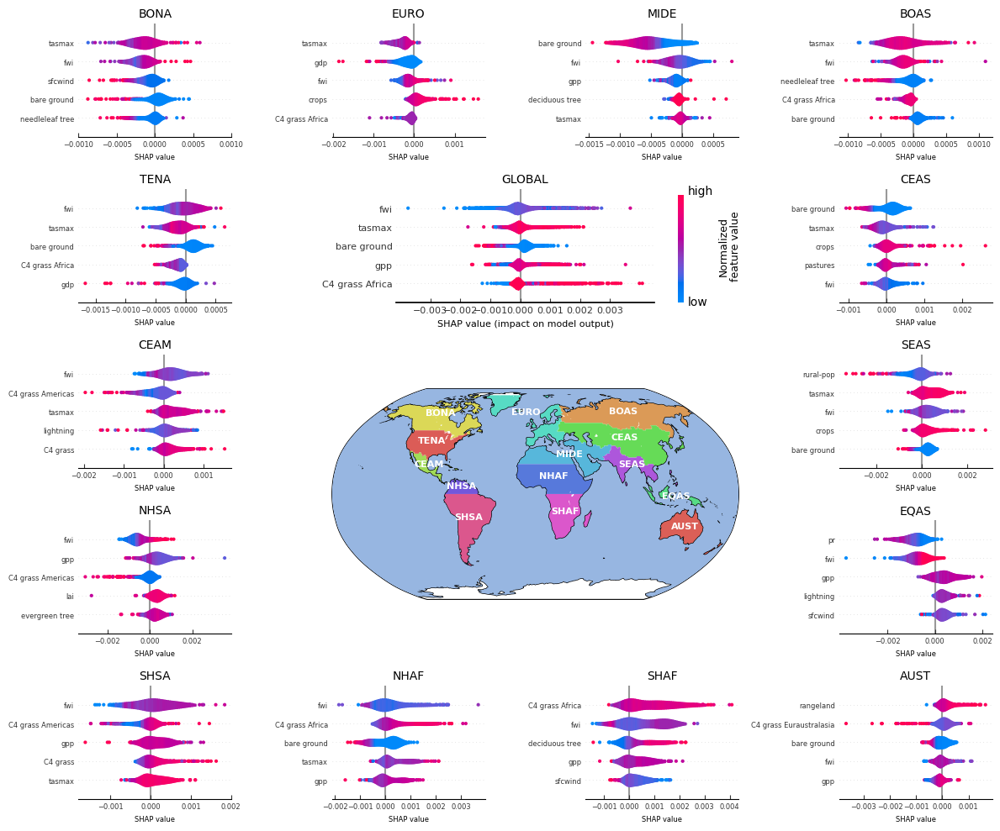

In [12]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            ax.set_title(regionname, fontsize=10) 
            plt.sca(ax)
            #print(regionname)
            shap.plots.violin(expl_dict[regionname], show=False, max_display=5, plot_size=None, color_bar=False)
            if regionname == 'BONA':
                ax.set_xticks([-0.001, -0.0005, 0, 0.0005, 0.001])
            if regionname == 'EQAS':
                ax.set_xticks([-0.002, 0, 0.002])
            if regionname == 'SEAS':
                ax.set_xticks([-0.002, 0, 0.002])
            idx += 1
            ax.xaxis.label.set_size(6)
            ax.yaxis.label.set_size(6)
            ax.tick_params(labelsize=6, direction='in')
            ax.set_ymargin(5)
            ax.set_xlabel('SHAP value')

ax_global = fig.add_subplot(gs[1, 1:3])
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_xticks([-0.003, -0.002, -0.001, 0, 0.001, 0.002, 0.003])

plt.sca(ax_global)
shap.plots.violin(global_expl, show=False, max_display=5, plot_size=None, color_bar=False)
ax_global.xaxis.label.set_size(8)
ax_global.yaxis.label.set_size(8)
ax_global.tick_params(labelsize=8, direction='in')

cbar = plt.colorbar(pad=-0.1)
cbar.set_ticks([-0.6, 2.4])
cbar.ax.tick_params(size=0)
cbar.ax.set_yticklabels(['low', 'high'])
cbar.outline.set_visible(False)
cbar.set_label('Normalized\nfeature value', fontsize=9)
cbar.ax.tick_params(labelsize=10)

#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.savefig(os.path.join(logs_path, 'SHAP.png'), dpi=400)
plt.show()

In [136]:
T = 24
F = 27
N = shap_values_concat.shape[0] // T
shap_values_reshaped = shap_values_concat.reshape(N, T, T, F)
shap_values_diag = np.diagonal(shap_values_reshaped, axis1=1, axis2=2).transpose(0, 2, 1)

In [17]:
import shap
run_name = 'mse_1_64_reduced_set' #'default' #'imbalanced' #'2024-10-02_154002' #False
logs_path = os.path.join(model_path, 'Logs', run_name)
folds = [dirname[5:].split('_') for dirname in os.listdir(logs_path) if (os.path.isdir(os.path.join(logs_path, dirname)) and dirname != 'lightning_logs')]

n_batches = 2
shap_dict = {}

test_fold_paths = [os.path.join(logs_path, directory_name) for directory_name in os.listdir(logs_path) if directory_name.startswith('test_')]    
for test_fold_idx, test_fold_path in enumerate(test_fold_paths):
    test_name = os.path.basename(os.path.normpath(test_fold_path))
    test_regions = test_name.split('_')[1:]
    test_fold_path_studies = [os.path.join(test_fold_path, study_name) for study_name in os.listdir(test_fold_path)]
    test_fold_path_studies.sort(key=lambda x: os.path.getmtime(x))            
    print(f'Starting test {test_regions}')      
    shap_dict[test_name] = {}

    for study_idx, study_path in enumerate(test_fold_path_studies):
        study_name = study_path.split('/')[-1]
        val_regions = study_name.split('.')[0].split('_')[1:]
        for idx, item in enumerate(val_regions):
            if '-' in item:
                idx_item = val_regions[idx].split('-')
                val_regions = [val_regions[:idx] + [idx_item[0]], [idx_item[1]] + val_regions[idx+1:]]
        dm.change_val_test_folds(val_folds=val_regions, test_folds=[test_regions])
        for ds in dm.fold_datasets:
            ds.hparams.prediction_length = 0
        optuna_study = optuna.load_study(study_name=study_name, storage=f"sqlite:///{study_path}/optuna_study.db") # storage=f"sqlite:///{study_path}"
        version_number = optuna_study.best_trial.number #+ 5*study_idx + num_runs*5*test_fold_idx # Change here (remove + 5*study_idx + num_runs*5*test_fold_idx)
        selected_model = f'version_{version_number}'
        model_version = os.path.join(study_path, 'lightning_logs', selected_model) # Change logs_path to study_path
        version_list = [pathname for pathname in glob.glob(os.path.join(model_version, 'checkpoints', '*')) if pathname.split('/')[-1].startswith('epoch')]
        last_version = max(version_list, key=os.path.getctime)
        best_version = torch.load(last_version, map_location="cpu")['callbacks']["ModelCheckpoint{'monitor': 'val_loss', 'mode': 'min', 'every_n_train_steps': 0, 'every_n_epochs': 1, 'train_time_interval': None}"]['best_model_path'].split('/')[-1]
        best_version = [filename for filename in version_list if best_version in filename][0]
        model = LightningLSTM.load_from_checkpoint(best_version)#.to(device)
        model.eval()
        print(f'Starting val {val_regions}')

        some_training_samples = []
        train_loader = iter(dm.get_dataloader('train'))
        for n in range(n_batches):
            some_training_samples.append(next(train_loader)[0])
        some_training_samples = torch.concat(some_training_samples)[:, 120:180, :]#.to(device)
        explainer = shap.GradientExplainer(model, some_training_samples)

        some_test_samples = []
        test_loader = iter(dm.get_dataloader('test'))
        for n in range(n_batches):
            some_test_samples.append(next(test_loader)[0])
        some_test_samples = torch.concat(some_test_samples)[:, 120:180, :]#.to(device)

        '''
        shap_values = []
        for i in tqdm(range(some_test_samples.shape[0]), desc="Computing SHAP values"):
            # Compute SHAP values for one sample at a time
            sample_shap = explainer.shap_values(some_test_samples[i:i+1])
            shap_values.append(sample_shap)
            
        # Optionally, combine the results
        shap_values = np.concatenate(shap_values, axis=0)
        shap_dict[test_name][study_name] = (explainer, shap_values, some_test_samples)
        '''
        explanation = explainer(some_test_samples)
        shap_dict[test_name][study_name] = explanation
    break

Starting test ['EEU', 'NWN', 'MED', 'SAU']


[rank: 0] Seed set to 2465321163


Starting val [['WNA', 'ESAF', 'ENA', 'WCA'], ['SCA', 'CNA', 'CAU', 'SWS']]


dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1


KeyboardInterrupt: 

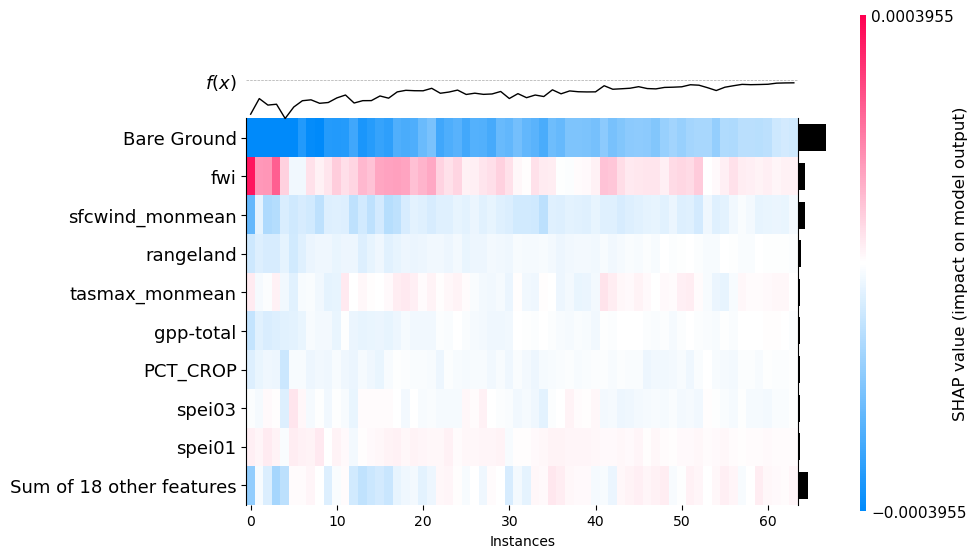

In [231]:
calibration_steps = 36  # First 36 timesteps are calibration
num_pred_timesteps = 60  # Last 24 timesteps are predicted
explanation = shap_dict[test_name]['val_WNA_ESAF_ENA_WCA-SCA_CNA_CAU_SWS']
feature_names = features
# Extract the number of timesteps (24), samples (64), and features (27)
num_timesteps = len(explanation)  # Should be 24
num_samples = explanation[0].values.shape[0]  # Should be 64
num_features = explanation[0].values.shape[2]  # Should be 27

# Arrays to store SHAP values and feature data
shap_values_array = np.zeros((num_samples, num_timesteps, num_features))
features_array = np.zeros((num_samples, num_timesteps, num_features))

for t, exp in enumerate(explanation):  
    # Extract SHAP values and feature values for the current timestep
    shap_values_array[:, t, :] = exp.values[:, t, :]
    
    if exp.data.shape == (num_samples, 60, num_features):  
        features_array[:, t, :] = exp.data[:, t, :]
    elif exp.data.shape == (60, num_features):  
        features_array[:, t, :] = np.tile(exp.data[t, :], (num_samples, 1))

# Stack over timesteps to get (64*24, 27)
#shap_values_combined = np.stack(shap_values_list)  
#features_combined = np.stack(features_list)  

# Compute the mean over timesteps -> shape (num_samples, num_features)
shap_values_mean = np.mean(shap_values_array, axis=1)
features_mean = np.mean(features_array, axis=1)

# Create a single Explanation object
merged_explanation = shap.Explanation(
    values=shap_values_mean,
    data=features_mean,
    feature_names=feature_names
)

# Plot the SHAP violin plot
shap.plots.heatmap(
    merged_explanation
)


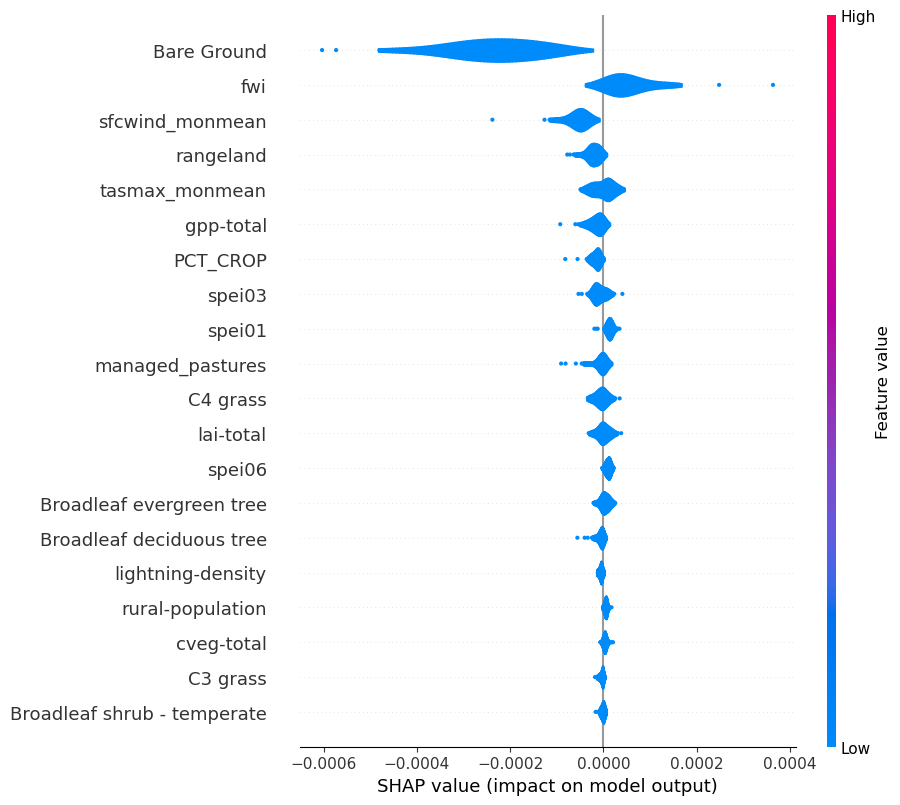

In [234]:
shap.plots.violin(merged_explanation)

In [ ]:
# Assume X_test is your test set with shape (n_samples, n_timesteps, n_features)
shap_values = []
for i in tqdm(range(100), desc="Computing SHAP values"):
    # Compute SHAP values for one sample at a time
    sample_shap = explainer.shap_values(some_test_samples[i:i+1])
    shap_values.append(sample_shap)
    
# Optionally, combine the results
shap_values = np.concatenate(shap_values, axis=0)

In [35]:
shap_values = np.concatenate(shap_values, axis=0)

In [36]:
shap_values_aggregated = np.mean(shap_values.squeeze(), axis=1)

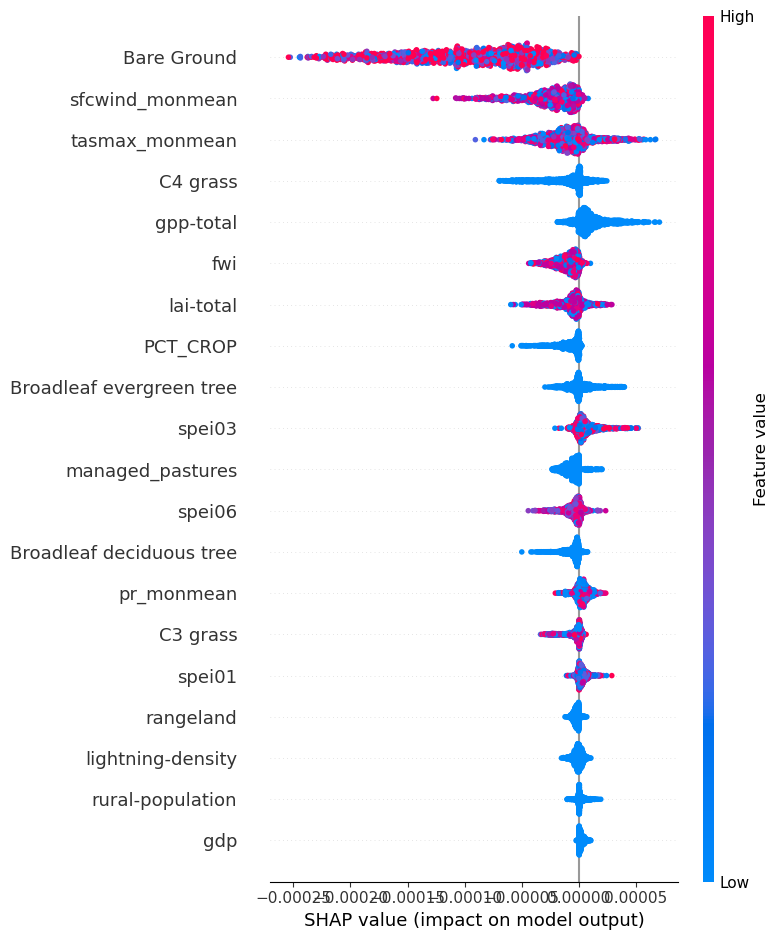

In [109]:
shap.summary_plot(shap_values_aggregated, 
                  some_test_samples[:shap_values.shape[0], 0, :],
                  feature_names=features)

#### Clustering

In [5]:
def moving_mean(arr, mask, window_size):
    """Applies a moving average filter that ignores NaNs and only fills values where mask is True."""
    nan_mask = np.isnan(arr)  # Identify NaNs
    fill_mask = nan_mask & mask  # Only fill where NaN and mask is True

    # Replace NaNs with 0 for filtering purposes
    filled = np.where(nan_mask, 0, arr)
    
    # Count valid (non-NaN) elements within the window
    count = scipy.ndimage.uniform_filter((~nan_mask).astype(float), size=window_size, mode='mirror')
    
    # Compute the mean using a uniform filter
    smoothed = scipy.ndimage.uniform_filter(filled, size=window_size, mode='mirror')
    
    # Compute new values, avoiding division by zero
    with np.errstate(invalid='ignore'):
        new_values = smoothed / count
    
    # Only replace NaNs where mask is True, keep other values unchanged
    return np.where(fill_mask, new_values, arr)

def interpolate_missing(ds, mask, window_size=3):
    """Interpolates missing values only where mask is True."""
    ds_filled = ds.copy()
    for var_name, da in ds.data_vars.items():
        if np.issubdtype(da.dtype, np.number):  # Process only numeric variables
            ds_filled[var_name] = xr.apply_ufunc(
                moving_mean,
                da, mask,
                input_core_dims=[['lat', 'lon'], ['lat', 'lon']],
                output_core_dims=[['lat', 'lon']],
                vectorize=True,
                dask="parallelized",
                kwargs={'window_size': window_size},
                output_dtypes=[da.dtype],
                dask_gufunc_kwargs={"allow_rechunk": True}
            )
    return ds_filled

In [6]:
def create_dataset(features, targets, static_features=[], exclusion_list=[], data_dir=data_path, start_year=1901, end_year=2019):
    file_list = [os.path.join(data_dir, filename) for filename in os.listdir(data_dir) if (os.path.isfile(os.path.join(data_dir, filename)) and filename not in exclusion_list)]
    ds = xr.open_mfdataset(file_list, preprocess=partial(preprocess, variables=features+targets+static_features, start_year=start_year, start_month=1, end_year=end_year), engine='netcdf4', combine='nested', chunks={})
    ds = ds.chunk(chunks={'time': -1, 'lat': 'auto', 'lon': 'auto'})
    return ds

In [89]:
ds = create_dataset(features=features, targets=targets, exclusion_list=exclusion_list, start_year=1997, end_year=2019)
nanmask = xr.DataArray(~np.isnan(ds.percentage_of_area_burned[0].values), dims=['lat', 'lon'], coords={'lat': ds.lat, 'lon': ds.lon})
ba_da = ds.percentage_of_area_burned
ds = ds.drop_vars('percentage_of_area_burned')
ds = interpolate_missing(ds, nanmask)

In [8]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import scipy
variables = list(ds.data_vars)  # List of 30 variables

# Get dimensions
time_dim, lat_dim, lon_dim = "time", "lat", "lon"
n_time, n_lat, n_lon = ds.sizes[time_dim], ds.sizes[lat_dim], ds.sizes[lon_dim]

# --- Step 2: Reshape Data (Flatten Spatial Dimensions) ---
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    data_reshaped = ds.to_array(dim="variable").stack(spatial=[lat_dim, lon_dim])  # Shape: (variable, time, spatial)

In [9]:
data_matrix = data_reshaped.transpose(time_dim, "spatial", "variable").where(nanmask.stack(spatial=[lat_dim, lon_dim]), drop=True)

In [48]:
for idx, var_name in enumerate(data_matrix['variable']):
    print(var_name.item(), np.isnan(data_matrix[:, :, idx].values).sum())

lightning-density 0
spei03 7
spei04 0
rural-population 0
urban-population 0
cveg-total 0
spei06 6
spei01 143
gpp-total 0
PCT_URBAN 0
PCT_LAKE 0
PCT_CROP 0
Bare Ground 0
Broadleaf deciduous shrub - boreal 0
C3 grass 0
C4 grass 0
Needleleaf tree 0
Broadleaf deciduous tree 0
Broadleaf evergreen tree 0
Broadleaf shrub - temperate 0
pr_monmean 0
sfcwind_monmean 0
tas_monmean 0
gdp 0
primf 0
primn 0
secdf 0
secdn 0
urban 0
c3ann 0
c4ann 0
c3per 0
c4per 0
c3nfx 0
pastr 0
range 0
secmb 0
secma 0
cropland 0
fwi 0
lai-total 0


In [10]:
# Transpose to (time, spatial, variable) for PCA
data_matrix = data_matrix.dropna(dim='spatial')
spatial = data_matrix.spatial
n_spatial = spatial.size # Total number of grid points
data_matrix = data_matrix.values

In [11]:
# --- Step 3: Standardize Data (Z-score normalization) ---
scaler = StandardScaler()
data_standardized = scaler.fit_transform(data_matrix.reshape(-1, len(variables))).reshape(n_time, n_spatial, len(variables))

In [12]:
# --- Step 4: Apply PCA (Reduce 30 variables to 2 components) ---
pca = PCA(n_components=0.95)
principal_components = pca.fit_transform(data_standardized.reshape(-1, len(variables)))
n_components = principal_components.shape[-1]

In [13]:
# --- Step 5: Convert PCA Results Back to Xarray ---
pc_da = xr.DataArray(
    principal_components.reshape(n_time, n_spatial, n_components),
    dims=['time', 'spatial', "pc"],
    coords={'time': ds[time_dim], 'spatial': spatial, "pc": np.arange(1, n_components + 1)},
    name="Principal_Components"
)

In [20]:
# Get explained variance ratio
explained_variance = pca.explained_variance_ratio_
total = 0
# Print results
for i, var in enumerate(explained_variance):
    total += var*100
    print(f"PC{i+1}: {var:.4f} ({var*100:.2f}%) variance explained. Total = {total:.2f}%")

PC1: 0.1591 (15.91%) variance explained. Total = 15.91%
PC2: 0.1162 (11.62%) variance explained. Total = 27.53%
PC3: 0.0923 (9.23%) variance explained. Total = 36.76%
PC4: 0.0692 (6.92%) variance explained. Total = 43.68%
PC5: 0.0592 (5.92%) variance explained. Total = 49.60%
PC6: 0.0468 (4.68%) variance explained. Total = 54.28%
PC7: 0.0395 (3.95%) variance explained. Total = 58.22%
PC8: 0.0336 (3.36%) variance explained. Total = 61.59%
PC9: 0.0279 (2.79%) variance explained. Total = 64.38%
PC10: 0.0273 (2.73%) variance explained. Total = 67.11%
PC11: 0.0264 (2.64%) variance explained. Total = 69.74%
PC12: 0.0242 (2.42%) variance explained. Total = 72.17%
PC13: 0.0233 (2.33%) variance explained. Total = 74.50%
PC14: 0.0226 (2.26%) variance explained. Total = 76.77%
PC15: 0.0200 (2.00%) variance explained. Total = 78.77%
PC16: 0.0193 (1.93%) variance explained. Total = 80.70%
PC17: 0.0185 (1.85%) variance explained. Total = 82.54%
PC18: 0.0167 (1.67%) variance explained. Total = 84.22%

In [26]:
distortions = []
max_n = 41
for k in tqdm(range(2, max_n)):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init="auto")
    kmeans.fit(data_matrix.reshape(-1, n_pcs))  # Flatten time & spatial
    distortions.append(kmeans.inertia_)

100%|██████████| 39/39 [37:51<00:00, 58.25s/it] 


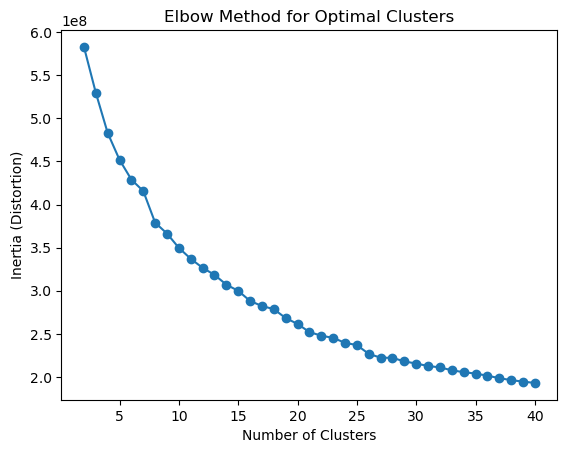

In [27]:
plt.plot(range(2, max_n), distortions, marker="o")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia (Distortion)")
plt.title("Elbow Method for Optimal Clusters")
plt.show()

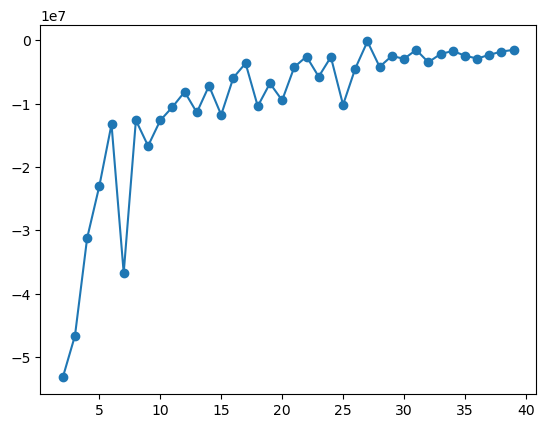

In [30]:
plt.plot(range(2, max_n-1), first_diff, marker="o", label="Inertia")

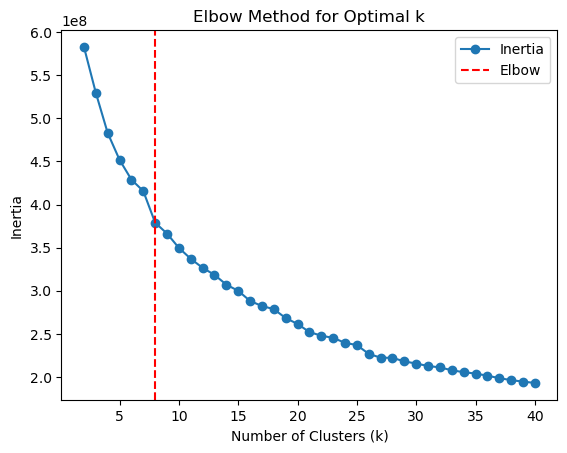

Optimal number of clusters: 8


In [28]:
# Step 1: Calculate the first derivative (change in inertia)
first_diff = np.diff(distortions)

# Step 2: Calculate the second derivative (change in first derivative)
second_diff = np.diff(first_diff)

# Step 3: Find the index where the second derivative is maximum (elbow point)
elbow_index = np.argmax(second_diff) + 1  # Add 1 to match the corresponding k value

# Step 4: Plot the inertia and show the elbow
plt.plot(range(2, max_n), distortions, marker="o", label="Inertia")
plt.axvline(x=range(2, max_n)[elbow_index], color='r', linestyle='--', label="Elbow")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal k")
plt.legend()
plt.show()

# Print the optimal number of clusters
print(f"Optimal number of clusters: {range(2, max_n)[elbow_index]}")

In [42]:
from sklearn.cluster import KMeans

n_clusters = 23 # Choose number of clusters
pc_da_cropped = pc_da.loc[:, :, :n_clusters]

# --- Step 1: Reshape Data for Clustering ---
data_matrix = pc_da_cropped.values  # Shape: (time, spatial, n_cluster)
n_time, n_spatial, n_pcs = data_matrix.shape

# --- Step 2: Apply K-Means Clustering ---
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init="auto")

# Fit clustering separately for each timestep
clusters = np.empty((n_time, n_spatial), dtype=int)
for t in range(n_time):
    clusters[t] = kmeans.fit_predict(data_matrix[t])  # Cluster spatial points for each timestep

# --- Step 3: Convert Clustering Results Back to Xarray ---
cluster_da = xr.DataArray(
    clusters,
    dims=["time", "spatial"],
    coords={"time": pc_da_cropped["time"], "spatial": pc_da_cropped["spatial"]},
    name="Clusters"
)
cluster_da = cluster_da.unstack('spatial')[0]

In [52]:
clustered_da = xr.full_like(ds.isel(time=0).gdp.load(), np.nan)
clustered_da.loc[cluster_da.lat, cluster_da.lon] = cluster_da

In [57]:
from matplotlib.colors import ListedColormap
# Get colors from "tab20" (20 colors) and "Set3" (12 colors)
colors = list(plt.get_cmap("tab20").colors) + list(plt.get_cmap("Set3").colors)

colors = colors[:n_clusters]

# Create a ListedColormap
custom_cmap = ListedColormap(colors, name="custom_30")

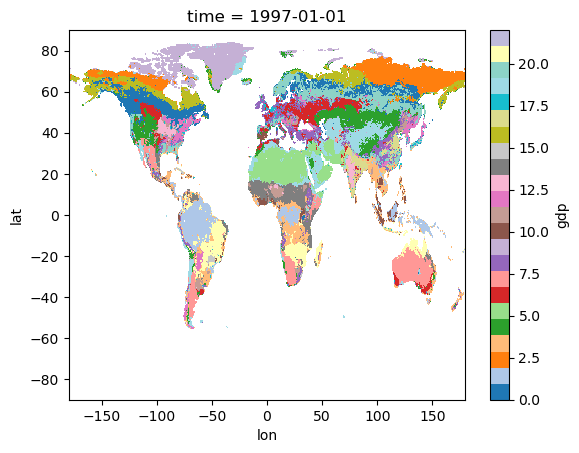

In [58]:
clustered_da.plot(cmap=custom_cmap)

In [18]:
ds = xr.open_dataset(r"/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/isimip_landuse_1901_2021_reprocessed.nc", decode_times=False)

In [ ]:
from sklearn.cluster import SpectralClustering

spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels = spectral.fit_predict(data_matrix)

In [ ]:
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.cluster import SpectralClustering

n_time, n_samples, n_features = data_matrix.shape
data_matrix_reshaped = data_matrix.reshape(n_samples, n_time * n_features)

# Compute similarity matrix
gamma = 1.0 / (2 * np.var(data_matrix_reshaped))  
affinity_matrix = rbf_kernel(data_matrix_reshaped, gamma=gamma)

# Run Spectral Clustering
spectral = SpectralClustering(n_clusters=25, affinity='precomputed', random_state=42)
labels = spectral.fit_predict(data_matrix_reshaped)

In [125]:
from sklearn.cluster import AgglomerativeClustering
from scipy.sparse import csr_matrix
from sklearn.neighbors import kneighbors_graph

n_clusters = 100

ba_da_stacked = ba_da.stack(spatial=('lat', 'lon')).dropna(dim='spatial')
ba_da_stacked_normalized = (ba_da_stacked - ba_da_stacked.mean(dim='time'))/ba_da_stacked.std(dim='time')
ba_da_stacked_normalized = ba_da_stacked_normalized.fillna(0)

pc_cropped_stacked_2d = pc_da_cropped.drop_vars(('lat', 'lon')).stack(spatial_pc = ('time', 'pc'))

# Build a sparse nearest-neighbor graph (only links nearby land pixels)
connectivity = kneighbors_graph(np.array(list(zip(pc_da_cropped.lat.values, pc_da_cropped.lon.values))), n_neighbors=10, include_self=False)

# Run memory-efficient Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=n_clusters, connectivity=connectivity, linkage="ward")
labels = agglo.fit_predict(pc_cropped_stacked_2d)

/apps/brussel/RL8/zen4/software/scikit-learn/1.3.1-gfbf-2023a/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:304: UserWarning: the number of connected components of the connectivity matrix is 12 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


In [126]:
agglo_cluster_da = xr.DataArray(
    labels,
    dims=["spatial"],
    coords={"spatial": pc_cropped_stacked_2d["spatial"]},
    name="Clusters"
)
agglo_cluster_da = agglo_cluster_da.unstack('spatial')

ValueError: cannot unstack dimensions that do not have exactly one multi-index: ('spatial',)

In [ ]:
agglo_clustered_da = xr.full_like(ds.isel(time=0).gdp.load(), np.nan)
agglo_clustered_da.loc[agglo_cluster_da.lat, agglo_cluster_da.lon] = agglo_cluster_da

from matplotlib.colors import ListedColormap
# Get colors from "tab20" (20 colors) and "Set3" (12 colors)
colors = list(plt.get_cmap("tab20").colors) + list(plt.get_cmap("Set3").colors)

colors = colors[:n_clusters]

# Create a ListedColormap
custom_cmap = ListedColormap(colors, name="custom_30")

agglo_clustered_da.plot(cmap=custom_cmap)

#### Spatial Autocorrelation

In [33]:
# ---------------------------
# 1. Create or load your DataArray
# ---------------------------
da = obs_da

# ---------------------------------------------------
# Define the spatial weights kernel (rook contiguity)
# ---------------------------------------------------

kernel = np.array([[1, 1, 1],
                   [1, 0, 1],
                   [1, 1, 1]])

morans_I_time = []
for t in range(da.shape[0]):
    slice2d = da.values[t]  # Extract the 2D slice for the current time step
    moran_I = compute_morans_I_2d(slice2d, kernel)
    morans_I_time.append(moran_I)

morans_I_time = np.array(morans_I_time)

print(morans_I_time)

[0.83583837 0.82049364 0.77322005 0.68870137 0.67984624 0.83223516
 0.84142345 0.79185874 0.7545027  0.72396992 0.75260281 0.81482748
 0.84935323 0.80041107 0.78311657 0.68890464 0.75367349 0.84228124
 0.82912165 0.78225667 0.75694401 0.77256648 0.7836341  0.86518881
 0.85342325 0.79738676 0.79110225 0.68929694 0.7532079  0.82743293
 0.83676571 0.77130655 0.77478687 0.74421721 0.79821987 0.86387496
 0.86475618 0.80145762 0.74880808 0.70755614 0.73158354 0.8379377
 0.83237991 0.77106178 0.77084842 0.72485807 0.79713964 0.87476512
 0.82629823 0.73227909 0.61078089 0.61454606 0.62464399 0.6693856
 0.72085199 0.71633119 0.67564029 0.58912427 0.64019788 0.80158162
 0.81147273 0.72785348 0.58337158 0.5899968  0.64147846 0.7296759
 0.71737161 0.67056169 0.61530104 0.63066215 0.66050837 0.81946913
 0.83450657 0.73453849 0.67196208 0.67406827 0.69938164 0.77699147
 0.80201573 0.76906121 0.67527481 0.64542355 0.71140371 0.84785185
 0.83560714 0.76760942 0.7726744  0.68832463 0.72940275 0.7361459

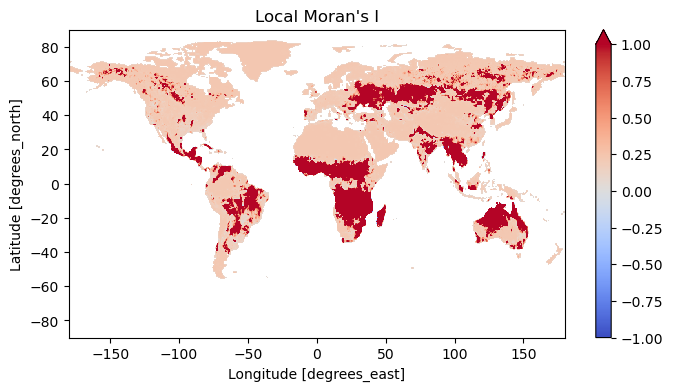

In [38]:
local_I_list = []
for t in range(da.shape[0]):
    slice2d = da.values[t]  # Extract the 2D slice for the current time step.
    local_I = compute_local_morans_I_2d(slice2d, kernel)
    local_I_list.append(local_I)

# Convert the list to a 3D numpy array and create a new DataArray.
local_I_array = np.array(local_I_list)
local_I_da = xr.DataArray(local_I_array, coords=da.coords, dims=da.dims)

# -----------------------------------------------
# Plot the local Moran's I for the first time step.
# -----------------------------------------------
plt.figure(figsize=(8, 4))
local_I_da.mean(dim='time').plot(cmap='coolwarm', vmax=1)
plt.title("Local Moran's I")
plt.show()

In [33]:
temporal_corr_df = pd.Series()
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
for model in model_cubelist:
    temporal_corr_df[f'{model.long_name}'] = xr.corr(pipeline(model), pipeline(obs_cube)).values.item()
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
print('Temporal Correlation (monthly)')
print(' & '.join([str(i) for i in temporal_corr_df.values.round(decimals=2)]))

Temporal Correlation (monthly)
0.8 & 0.07 & 0.29 & 0.57 & 0.38 & -0.01 & -0.34 & 0.69 & -0.21


#### Old Evaluation

In [13]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
start_year, end_year = 1997, 2019
with open(f'static_results_{start_year}_{end_year}.json', 'w') as f:
    rmse = {}
    spatial_rmse = {}
    corr = {}
    spatial_corr = {}
    monthly_corr = {}
    yearly_corr = {}
    for model in model_cubelist:
        model = constrain_time(model, start_year, end_year)
        obs_cube_constrained = constrain_time(obs_cube, start_year, end_year)
        modelname = f'{model.long_name}'
        
        rmse[modelname] = RMSE(model, obs_cube_constrained)
        
        pipeline = lambda cube: xr.DataArray.from_iris(cube)
        corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()

        pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
        spatial_rmse[modelname] = RMSE(pipeline(model), pipeline(obs_cube_constrained))
        spatial_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()

        pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
        monthly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()

        pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
        yearly_corr[modelname] = xr.corr(pipeline(model), pipeline(obs_cube_constrained)).values.item()

    metrics = {'rmse': rmse, 'spatial_rmse': spatial_rmse, 'corr': corr, 'spatial_corr': spatial_corr, 'monthly_corr': monthly_corr, 'yearly_corr': yearly_corr}
    json.dump(metrics , f) 
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)

In [93]:
rmse_df = pd.Series()
rmse_df['LSTM'] = RMSE(predicted_cube, obs_cube)
for model in model_cubelist:
    rmse_df[f'{model.long_name}'] = RMSE(model, obs_cube)
print('RMSE (in %)')
print(rmse_df.sort_values().round(decimals=2))

RMSE (in %)
LSTM                       1.82
ssib4-triffid-fire         2.02
jules-inferno-vn6p3        2.16
classic                    2.18
lpj-guess-simfire-blaze    2.30
lpj-guess-spitfire         2.32
lpjml5-7-10-fire           2.37
visit                      2.56
orchidee-mict              2.83
elm-eca                    3.07
dtype: float64


In [100]:
corr_df = pd.Series()
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(cube)
corr_df['LSTM'] = xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item()
for model in model_cubelist:
    corr_df[f'{model.long_name}'] = xr.corr(pipeline(model), pipeline(obs_cube)).values.item()
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
print('Spatio-Temporal Correlation')
print(corr_df.sort_values(ascending=False).round(decimals=2))

Spatio-Temporal Correlation (monthly)
LSTM                       0.62
ssib4-triffid-fire         0.51
classic                    0.40
jules-inferno-vn6p3        0.37
lpjml5-7-10-fire           0.30
lpj-guess-simfire-blaze    0.29
lpj-guess-spitfire         0.26
orchidee-mict              0.18
elm-eca                    0.11
visit                      0.01
dtype: float64


In [95]:
spatial_rmse_df = pd.Series()
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
spatial_rmse_df['LSTM'] = RMSE(pipeline(predicted_cube), pipeline(obs_cube))
for model in model_cubelist:
    spatial_rmse_df[f'{model.long_name}'] = RMSE(pipeline(model), pipeline(obs_cube))
print('Spatial RMSE (in %)')
print(spatial_rmse_df.sort_values().round(decimals=2))

Spatial RMSE (in %)
LSTM                       0.58
ssib4-triffid-fire         0.75
jules-inferno-vn6p3        0.82
lpj-guess-simfire-blaze    0.85
classic                    0.87
lpjml5-7-10-fire           0.89
lpj-guess-spitfire         0.96
elm-eca                    1.02
orchidee-mict              1.24
visit                      1.32
dtype: float64


In [96]:
spatial_corr_df = pd.Series()
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(pixel_mean(cube))
spatial_corr_df['LSTM'] = xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).item()
for model in model_cubelist:
    spatial_corr_df[f'{model.long_name}'] = xr.corr(pipeline(model), pipeline(obs_cube)).values.item()
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
print('Spatial Correlation')
print(spatial_corr_df.sort_values(ascending=False).round(decimals=2))

Spatial Correlation
LSTM                       0.82
ssib4-triffid-fire         0.69
jules-inferno-vn6p3        0.62
classic                    0.61
lpj-guess-simfire-blaze    0.58
lpjml5-7-10-fire           0.53
lpj-guess-spitfire         0.43
orchidee-mict              0.40
elm-eca                    0.32
visit                     -0.01
dtype: float64


In [97]:
temporal_corr_df = pd.Series()
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_global(cube, area_weighted=True))
temporal_corr_df['LSTM'] = xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).values.item()
for model in model_cubelist:
    temporal_corr_df[f'{model.long_name}'] = xr.corr(pipeline(model), pipeline(obs_cube)).values.item()
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
print('Temporal Correlation (monthly)')
print(temporal_corr_df.sort_values(ascending=False).round(decimals=2))

Temporal Correlation (monthly)
LSTM                       0.72
ssib4-triffid-fire         0.66
classic                    0.55
lpj-guess-simfire-blaze    0.49
jules-inferno-vn6p3        0.39
lpjml5-7-10-fire           0.35
lpj-guess-spitfire         0.18
elm-eca                    0.11
visit                      0.11
orchidee-mict             -0.13
dtype: float64


In [104]:
temporal_corr_yearly_df = pd.Series()
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
pipeline = lambda cube: xr.DataArray.from_iris(to_annual(to_global(cube, area_weighted=True)))
temporal_corr_yearly_df['LSTM'] = xr.corr(pipeline(predicted_cube), pipeline(obs_cube)).values.item()
for model in model_cubelist:
    temporal_corr_yearly_df[f'{model.long_name}'] = xr.corr(pipeline(model), pipeline(obs_cube)).values.item()
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
print('Temporal Correlation (yearly)')
print(temporal_corr_yearly_df.sort_values(ascending=False).round(decimals=2))

Temporal Correlation (yearly)
LSTM                       0.86
classic                    0.80
ssib4-triffid-fire         0.69
lpj-guess-simfire-blaze    0.57
lpj-guess-spitfire         0.38
jules-inferno-vn6p3        0.29
elm-eca                    0.07
lpjml5-7-10-fire          -0.01
visit                     -0.21
orchidee-mict             -0.34
dtype: float64


In [99]:
from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    return f"{res.slope:.2f} ± {ts*res.stderr:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")

trend_mha_df = pd.Series()
trend_mha_df['GFED5'] = calculate_trend(obs_cube)
trend_mha_df['LSTM'] = calculate_trend(predicted_cube)
for model in model_cubelist:
    trend_mha_df[f'{model.long_name}'] = calculate_trend(model)
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
warnings.simplefilter(action="default", category=iris.warnings.IrisUserWarning)
print('Trend (in Mha per year)')
print(trend_mha_df)

Trend (in Mha per year)
GFED5                      -7.14 ± 2.91
LSTM                       -2.33 ± 1.16
classic                    -3.74 ± 1.90
elm-eca                     0.68 ± 4.22
jules-inferno-vn6p3        -0.13 ± 0.77
lpj-guess-simfire-blaze    -1.87 ± 0.68
lpj-guess-spitfire         -0.89 ± 2.13
lpjml5-7-10-fire            1.62 ± 2.13
orchidee-mict               1.26 ± 1.02
ssib4-triffid-fire         -2.20 ± 1.05
visit                       3.76 ± 4.68
dtype: object


In [105]:
from numpy.linalg import lstsq
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
warnings.simplefilter(action="ignore", category=iris.warnings.IrisVagueMetadataWarning)
def calculate_trend_perc(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    res = stats.linregress(x, y)
    # Two-sided inverse Students t-distribution
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    perc_change = res.slope/res.intercept * 100
    perc_error = ts*res.stderr/res.intercept * 100
    return f"{perc_change:.2f} ± {perc_error:.2f}"
    #print(f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
    #print(f"intercept (95%): {res.intercept:.6f}" f" +/- {ts*res.intercept_stderr:.6f}")
print('Trend (in % per year)')
print('GFED5', calculate_trend_perc(obs_cube))
print('LSTM', calculate_trend_perc(predicted_cube))
for model in model_cubelist:
    print(model.long_name, calculate_trend_perc(model))
warnings.simplefilter(action="default", category=iris.warnings.IrisVagueMetadataWarning)
warnings.simplefilter(action="default", category=iris.warnings.IrisUserWarning)

Trend (in % per year)
GFED5 -0.83 ± 0.34
LSTM -0.31 ± 0.16
classic -0.50 ± 0.26
elm-eca 0.14 ± 0.89
jules-inferno-vn6p3 -0.02 ± 0.15
lpj-guess-simfire-blaze -0.40 ± 0.14
lpj-guess-spitfire -0.20 ± 0.47
lpjml5-7-10-fire 0.39 ± 0.51
orchidee-mict 0.22 ± 0.17
ssib4-triffid-fire -0.44 ± 0.21
visit 1.00 ± 1.24


In [106]:
from scipy.stats import theilslopes
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
def calc_theils(cube):
    y = to_annual(to_global(to_mha(cube))).data
    x = np.arange(len(y))
    return theilslopes(x, y)
print('Trend (in % per year)')
obs_slopes = calc_theils(obs_cube)
print('GFED5', f'{obs_slopes.slope:.2f} ± {abs((obs_slopes.low_slope - obs_slopes.high_slope)/2):.2f}')
lstm_slopes = calc_theils(predicted_cube)
print('LSTM', f'{lstm_slopes.slope:.2f} ± {abs((lstm_slopes.low_slope - lstm_slopes.high_slope)/2):.2f}')
for model in model_cubelist:
    model_slopes = calc_theils(model)
    print(model.long_name, f'{model_slopes.slope:.2f} ± {abs((model_slopes.low_slope - model_slopes.high_slope)/2):.2f}')

Trend (in % per year)
GFED5 -0.09 ± 0.03
LSTM -0.20 ± 0.09
classic -0.12 ± 0.07
elm-eca -0.01 ± 0.06
jules-inferno-vn6p3 -0.05 ± 0.31
lpj-guess-simfire-blaze -0.33 ± 0.12
lpj-guess-spitfire -0.04 ± 0.11
lpjml5-7-10-fire 0.08 ± 0.11
orchidee-mict 0.22 ± 0.19
ssib4-triffid-fire -0.23 ± 0.12
visit 0.04 ± 0.05


### General Plots

#### Examples (monthly)

<Figure size 640x480 with 0 Axes>

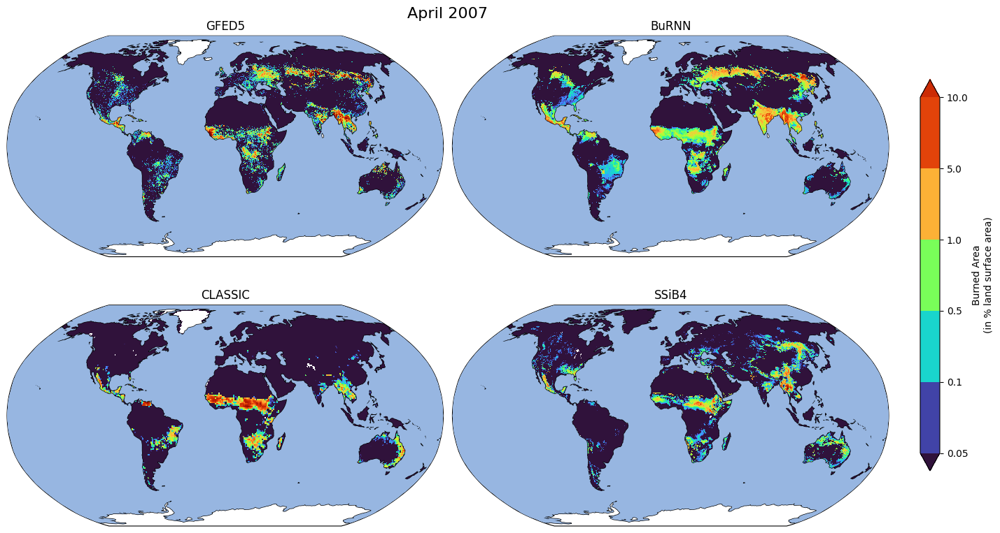

In [112]:
import calendar
month_dict = {idx: month for idx, month in enumerate(list(calendar.month_name))}

year = 2007
month = 4
idx = (year - 1997)*12 + month-1

cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = np.array([0.05, 0.1, 0.5, 1, 5, 10])  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000
norm = mcolors.LogNorm(vmin=0.05*cmap_corr_f, vmax=20*cmap_corr_f)


fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

ax = axs[0]
mesh = iplt.pcolormesh((obs_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('GFED5')

ax = axs[1]
iplt.pcolormesh((predicted_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('BuRNN')

ax = axs[2]
iplt.pcolormesh((model_cubelist[0][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('CLASSIC')

ax = axs[3]
iplt.pcolormesh((model_cubelist[7][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('SSiB4')

plt.tight_layout(h_pad=0.5)
# 1) Reserve room on the right (tweak the 0.85 until nothing overlaps)
fig.subplots_adjust(right=0.85)

# 2) Manually add a slim axes for the colorbar at [left, bottom, width, height]
#    all in figure‐fraction coordinates
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar_ax.set_frame_on(False)
cbar_ax.set_yticks([])
cbar_ax.set_xticks([])
# 3) Draw the colorbar into that axes
cbar = fig.colorbar(mesh, ax=cbar_ax, fraction=1, pad=0.04, orientation='vertical', label='Burned Area\n(in % land surface area)', boundaries=boundaries*cmap_corr_f, ticks=boundaries*cmap_corr_f, extend='both')

# (optional) if you want the original data-scale legend, divide ticks back:
cbar.set_ticks(boundaries * cmap_corr_f)
cbar.set_ticklabels(boundaries)

fig.suptitle(f'{month_dict[month]} {year}', fontsize=16, x=0.43)
plt.savefig(os.path.join(logs_path, 'example_1.png'), dpi=400, bbox_inches='tight', pad_inches=0.1)
plt.show()

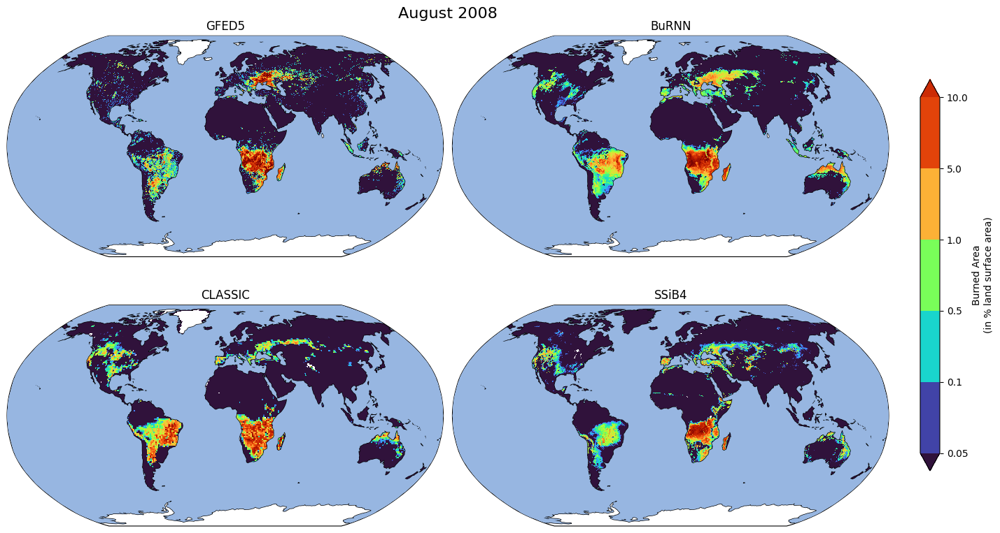

In [113]:
year = 2008
month = 8
idx = (year - 1997)*12 + month-1

cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = np.array([0.05, 0.1, 0.5, 1, 5, 10])  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000
norm = mcolors.LogNorm(vmin=0.05*cmap_corr_f, vmax=20*cmap_corr_f)


fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

ax = axs[0]
mesh = iplt.pcolormesh((obs_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('GFED5')

ax = axs[1]
iplt.pcolormesh((predicted_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('BuRNN')

ax = axs[2]
iplt.pcolormesh((model_cubelist[0][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('CLASSIC')

ax = axs[3]
iplt.pcolormesh((model_cubelist[7][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('SSiB4')

plt.tight_layout(h_pad=0.5)
# 1) Reserve room on the right (tweak the 0.85 until nothing overlaps)
fig.subplots_adjust(right=0.85)

# 2) Manually add a slim axes for the colorbar at [left, bottom, width, height]
#    all in figure‐fraction coordinates
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar_ax.set_frame_on(False)
cbar_ax.set_yticks([])
cbar_ax.set_xticks([])
# 3) Draw the colorbar into that axes
cbar = fig.colorbar(mesh, ax=cbar_ax, fraction=1, pad=0.04, orientation='vertical', label='Burned Area\n(in % land surface area)', boundaries=boundaries*cmap_corr_f, ticks=boundaries*cmap_corr_f, extend='both')

# (optional) if you want the original data-scale legend, divide ticks back:
cbar.set_ticks(boundaries * cmap_corr_f)
cbar.set_ticklabels(boundaries)

fig.suptitle(f'{month_dict[month]} {year}', fontsize=16, x=0.43)
plt.savefig(os.path.join(logs_path, 'example_2.png'), dpi=400, bbox_inches='tight', pad_inches=0.1)
plt.show()

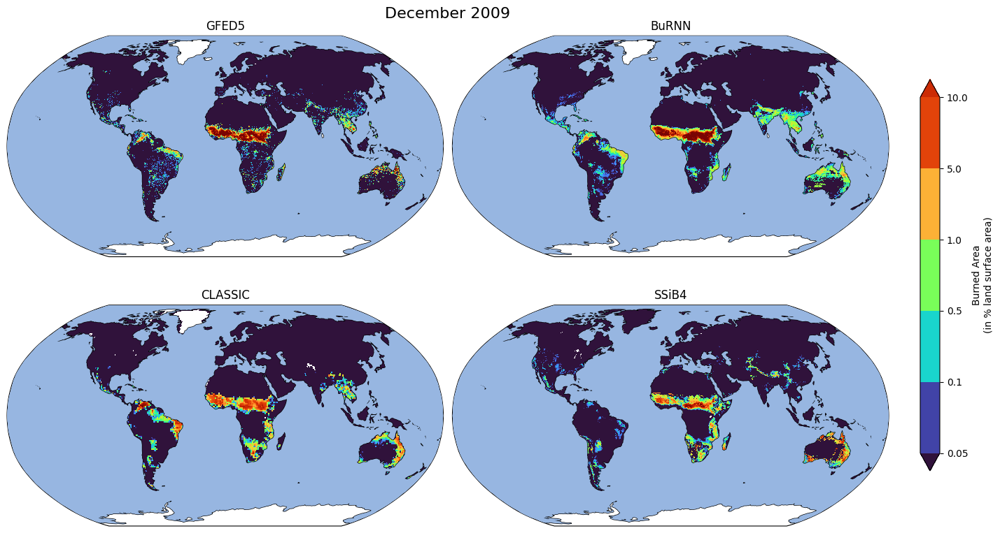

In [114]:
year = 2009
month = 12
idx = (year - 1997)*12 + month-1

cmap = plt.get_cmap('turbo').copy()
# Get the darkest color in turbo
darkest_turbo_color = cmap(0.0)  # 0.0 = bottom of the colormap
# Set it as the 'under' color
cmap.set_under(darkest_turbo_color)
boundaries = np.array([0.05, 0.1, 0.5, 1, 5, 10])  # Discrete steps
# for some reason the cmap doesn't like it when you use lognorm norm and when vmin is below 1.
# So we multiply our results by a large factor, and divide our cbar so it shows the original values.
cmap_corr_f = 1000
norm = mcolors.LogNorm(vmin=0.05*cmap_corr_f, vmax=20*cmap_corr_f)


fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 8), subplot_kw={'projection': ccrs.Robinson()})
axs = axs.ravel()

ax = axs[0]
mesh = iplt.pcolormesh((obs_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('GFED5')

ax = axs[1]
iplt.pcolormesh((predicted_cube[idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
ax.set_title('BuRNN')

ax = axs[2]
iplt.pcolormesh((model_cubelist[0][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('CLASSIC')

ax = axs[3]
iplt.pcolormesh((model_cubelist[7][idx]+0.0001)*cmap_corr_f, norm=norm, cmap=cmap, axes=ax)
ax.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax.add_feature(cartopy.feature.OCEAN, zorder=10)
_ = ax.set_title('SSiB4')

plt.tight_layout(h_pad=0.5)
# 1) Reserve room on the right (tweak the 0.85 until nothing overlaps)
fig.subplots_adjust(right=0.85)

# 2) Manually add a slim axes for the colorbar at [left, bottom, width, height]
#    all in figure‐fraction coordinates
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
cbar_ax.set_frame_on(False)
cbar_ax.set_yticks([])
cbar_ax.set_xticks([])
# 3) Draw the colorbar into that axes
cbar = fig.colorbar(mesh, ax=cbar_ax, fraction=1, pad=0.04, orientation='vertical', label='Burned Area\n(in % land surface area)', boundaries=boundaries*cmap_corr_f, ticks=boundaries*cmap_corr_f, extend='both')

# (optional) if you want the original data-scale legend, divide ticks back:
cbar.set_ticks(boundaries * cmap_corr_f)
cbar.set_ticklabels(boundaries)

fig.suptitle(f'{month_dict[month]} {year}', fontsize=16, x=0.43)
plt.savefig(os.path.join(logs_path, 'example_3.png'), dpi=400, bbox_inches='tight', pad_inches=0.1)
plt.show()

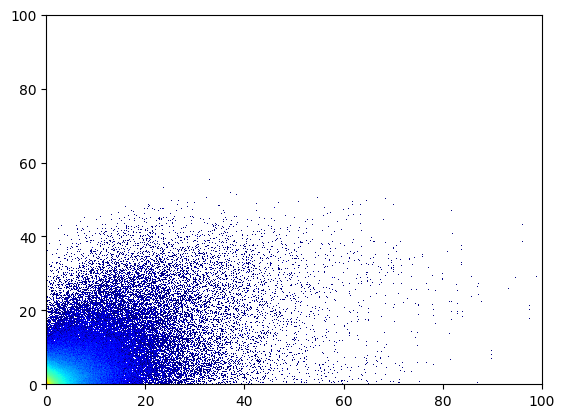

In [13]:
import matplotlib.colors as mcolors
x = constrain_time(obs_da, 1997, 2019).values.flatten()
y = constrain_time(predicted_da, 1997, 2019).values.flatten()
mask = ~np.logical_or(np.isnan(x), np.isnan(y))
x = x[mask]
y = y[mask]
(h, xedges, yedges, im) = plt.hist2d(x, y, bins=[1000, 1000], cmap=plt.cm.jet, norm=mcolors.LogNorm(vmin=1, vmax=1e6), range=[[0, 100], [0, 100]])
plt.show()

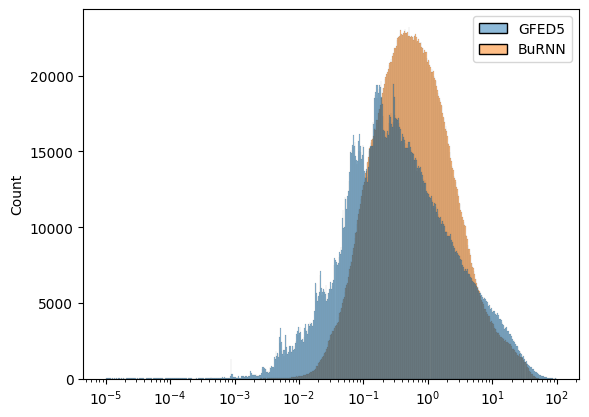

In [14]:
df = pd.DataFrame({'GFED5': x, 'BuRNN': y})
sns.histplot(df, log_scale=True, binrange=(-5, 2))
plt.show()

In [12]:
def calculate_edges(centers):
    if type(centers) not in [list, np.array]:
        centers = centers.values
    midpoints = (centers[:-1] + centers[1:]) / 2
    # first edge
    first_edge = centers[0] - (midpoints[0] - centers[0])
    # last edge
    last_edge = centers[-1] + (centers[-1] - midpoints[-1])
    # combine
    edges = np.concatenate([[first_edge], midpoints, [last_edge]])
    return edges

def calculate_area_weights(lat, lon):
    lat_edges = calculate_edges(lat)  # len(lat)+1
    lon_edges = calculate_edges(lon)  # len(lon)+1

    lat_edges_rad = np.deg2rad(lat_edges)
    lon_edges_rad = np.deg2rad(lon_edges)

    R = 6371000  # meters
    dlat_sin = np.abs(np.sin(lat_edges_rad[1:]) - np.sin(lat_edges_rad[:-1]))  # len(lat)
    dlon = np.abs(lon_edges_rad[1:] - lon_edges_rad[:-1])  # len(lon)

    # Use meshgrid to get 2D array exactly matching (lat, lon)
    dlat2d, dlon2d = np.meshgrid(dlat_sin, dlon, indexing="ij")
    area_vals = R**2 * dlat2d * dlon2d  # shape (lat, lon)

    area = xr.DataArray(area_vals, dims=("lat", "lon"), coords={"lat": lat, "lon": lon})
    return area

def to_mha_xarray(ds):
    area = calculate_area_weights(ds.lat, ds.lon)
    return ds*area/10**12

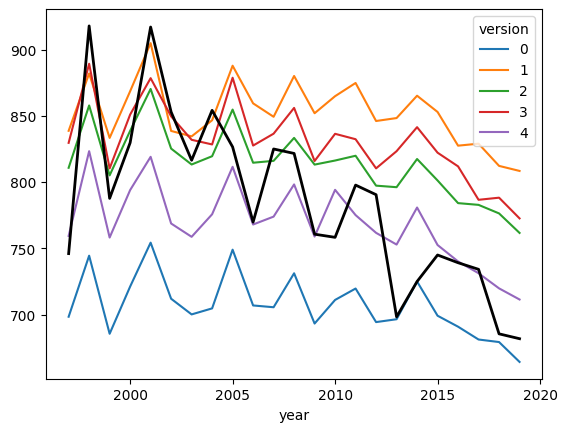

In [12]:
to_mha_xarray(predicted_da).groupby('time.year').sum().sum(dim=['lat', 'lon']).plot.line(x='year')
to_mha_xarray(obs_da).groupby('time.year').sum().sum(dim=['lat', 'lon']).plot.line(x='year', c='k', linewidth=2)
plt.show()

In [11]:
predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted_full.nc'), chunks={})['percentage_of_area_burned']
predicted_da = constrain_time(predicted_da, 1997, 2019)
predicted_da = np.maximum(predicted_da, 0).load()
predicted_da = np.minimum(predicted_da, 100)

predicted_df_yearly = to_mha_xarray(predicted_da).groupby('time.year').sum()
obs_df_yearly = to_mha_xarray(obs_da).groupby('time.year').sum()

#predicted_da_mha_gfed.groupby(predicted_da_mha_gfed.Region).sum().to_pandas().rename(columns=gfed_idx_name)

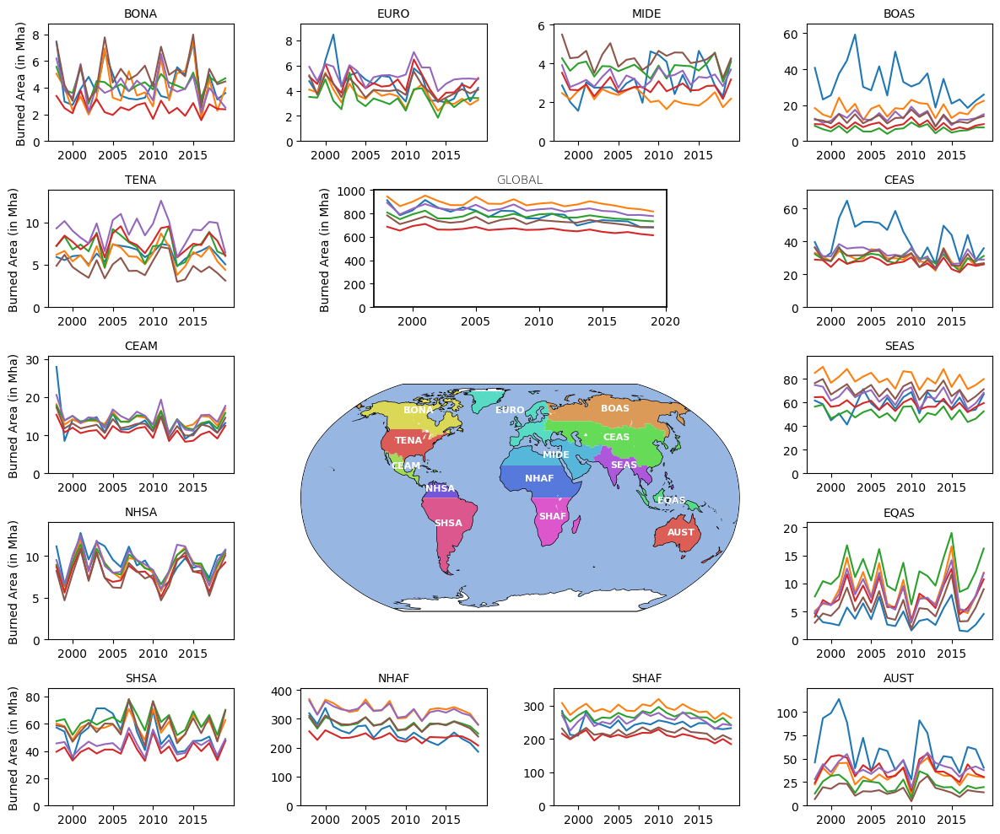

In [100]:
predicted_da = xr.open_dataset(os.path.join(logs_path, 'predicted_full.nc'), chunks={})['percentage_of_area_burned']
predicted_da = constrain_time(predicted_da, 1997, 2019)
predicted_da = np.maximum(predicted_da, 0).load()
predicted_da = np.minimum(predicted_da, 100)

gfed_regions = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Supplementary_Data/base_regions_upscaled.nc").__xarray_dataarray_variable__
gfed_regions = xr.DataArray(np.vectorize(gfed_idx_name.get)(gfed_regions), coords=gfed_regions.coords, dims=gfed_regions.dims)
gfed_regions = xr.where(gfed_regions == 'OCEAN', np.nan, gfed_regions)

predicted_df_yearly = to_mha_xarray(predicted_da).groupby('time.year').sum()
predicted_df_yearly['Region'] = gfed_regions
obs_df_yearly = to_mha_xarray(obs_da).groupby('time.year').sum()
obs_df_yearly['Region'] = gfed_regions

predicted_df_yearly_gfed = predicted_df_yearly.groupby('Region').sum()
obs_df_yearly_gfed = obs_df_yearly.groupby('Region').sum()

import matplotlib.gridspec as gridspec

start_year, end_year = 1997, 2019

modelname = 'BuRNN'

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(5, 4, figure=fig)

gfed_plot_order = ['BONA', 'EURO', 'MIDE', 'BOAS', 'TENA', 'CEAS', 'CEAM', 'SEAS', 'NHSA', 'EQAS', 'SHSA', 'NHAF', 'SHAF', 'AUST']

obs_df_plot = obs_df_yearly_gfed.loc[f'{start_year}-01-01':]
pred_df_plot = predicted_df_yearly_gfed.loc[slice(None), f'{start_year}-01-01':]

outer_axes = []  # List to collect all outer axes
idx = 0
# Loop through grid cells
for i in range(5):
    for j in range(4):
        # Check if the cell is on the outer border
        if i in [0, 4] or j in [0, 3]:
            ax = fig.add_subplot(gs[i, j])
            regionname = gfed_plot_order[idx]
            obs_region, model_region = obs_df_plot.loc[slice(None), regionname].to_pandas(), pred_df_plot.loc[slice(None), slice(None), regionname].to_pandas()
            obs_region = obs_region.rename('GFED5')
            pd.concat([obs_region, model_region.T], axis=1).plot(ax=ax, legend=False)
            ax.set_title(regionname, fontsize=10) 
            ax.set_xlabel('')
            if not j:
                ax.set_ylabel('Burned Area (in Mha)')
            model_max, obs_max = model_region.max(), obs_region.max()
            if type(model_max) == pd.Series:
                model_max = model_max.max()
            max_val = max(model_max, obs_max)
            ax.set_ylim([0, max_val*1.1])
            outer_axes.append(ax)
            idx += 1
            ax.set_xticks(np.array([2000, 2005, 2010, 2015]), [2000, 2005, 2010, 2015])

ax_global = fig.add_subplot(gs[1, 1:3])
pd.concat([obs_df_plot.sum(axis=1).to_pandas().rename('GFED5'), pred_df_plot.sum(axis=2).to_pandas().T], axis=1).plot(ax=ax_global, legend=False)
ax_global.set_title('GLOBAL', fontsize=10, weight=1.2) 
ax_global.set_ylim(0, 1000)
ax_global.set_xlabel('')
ax_global.set_ylabel('Burned Area (in Mha)')


#ax_global.set_position([global_pos.x0 + dis_change, global_pos.y0, global_pos.width-1.8*dis_change, global_pos.height], which='active')

# Combine the six middle cells into one central axis
ax_center = fig.add_subplot(gs[2:4, 1:3], projection=ccrs.Robinson())
ax_center.add_feature(cartopy.feature.COASTLINE, zorder=5)
ax_center.add_feature(cartopy.feature.OCEAN, zorder=10)


gfed_keys = list(gfed_mask.keys())
gfed_combined = deepcopy(gfed_mask[gfed_keys[0]]).rename('GFED') * 0
for idx, regionname in enumerate(gfed_keys):
    gfed_combined.values += idx*(~gfed_mask[gfed_keys[idx]])
region_idcs = {idx: region for idx, region in enumerate(list(gfed_mask.keys()))}

geometries = []
labels = []
for geom, value in shapes(gfed_combined.values.astype(np.float32), transform=from_bounds(gfed_combined.lon.min(), gfed_combined.lat.min(), gfed_combined.lon.max(), gfed_combined.lat.max(), gfed_combined.lon.size, gfed_combined.lat.size)):
    geometries.append(shape(geom))  # Convert to Shapely geometry
    labels.append(int(value))       # Preserve the region label

# Create GeoDataFrame
gdf = gpd.GeoDataFrame({'region': [region_idcs[label] for label in labels], 'geometry': geometries}, crs="EPSG:4326")
gdf = gdf.dissolve(by='region').reset_index()
gdf = gdf.drop(10)

ax_center.set_extent([-180, 180, -90, 90])
ax_center = gdf.plot(ax=ax_center, transform=ccrs.PlateCarree(), legend=False, cmap=sns.color_palette('hls', 14, as_cmap=True))
gdf.apply(lambda x: ax_center.annotate(text=x.region, xy=x.geometry.centroid.coords[0], xycoords=ccrs.PlateCarree(), ha='center', fontsize=8, zorder=100, c='white', weight='bold'), axis=1)

for ax in outer_axes:
    ax.minorticks_off()

plt.tight_layout()

pos = ax_global.get_position()
new_width = pos.width / 1.5
new_x0 = pos.x0 + (pos.width - new_width) / 2
new_y0 = pos.y0
ax_global.set_position([new_x0, new_y0, new_width, pos.height])
for spine in ax_global.spines:
    ax_global.spines[spine].set_linewidth(1.25)
    
plt.show()

#### stuff

In [ ]:
log_transform(xr.DataArray([))

In [85]:
def preprocess_gfed(ds):
    if 'iLCT' in dict(ds.dims).keys():
        ds = ds.drop_dims('iLCT')
    return ds
gfed5loc = r'/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/data/dataset/GFED5/Original/'
gfed5loc = sorted([os.path.join(gfed5loc, fn) for fn in os.listdir(gfed5loc) if fn.endswith('.nc')])
split_idx = 48 # For some reason we can't load in the 1997-2000 data together with the 2001-2020 data
gfed5_part1 = xr.open_mfdataset(gfed5loc[:48], engine='netcdf4', preprocess=preprocess_gfed, parallel=False)
gfed5_part2 = xr.open_mfdataset(gfed5loc[48:], engine='netcdf4', preprocess=preprocess_gfed, parallel=False)
lats = np.arange(89.75, -90, -0.5)
lons = np.arange(-179.75, 180, 0.5)
gfed5_part1 = gfed5_part1.interp(lat=lats, lon=lons)/4
gfed5_part2 = gfed5_part2.coarsen(lat=2, lon=2).sum().reindex(lat=lats)

In [ ]:
gfed5_crop = gfed5_part2.Crop.rename({'lat': 'latitude', 'lon': 'longitude'}).load().to_iris()
for coord in ('latitude', 'longitude'):
    gfed5_crop.coords(coord)[0].guess_bounds()
    gfed5_crop.coords(coord)[0].units = 'degrees'
    gfed5_crop.coords(coord)[0].coord_system = cs

gred5_crops_europe = mask_region(gfed5_crop, gfed_masks[6])
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')
time_coord = gred5_crops_europe.coords('time')[0]
time_coord.long_name = None
time_coord.standard_name = 'time'
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
gred5_crops_europe.replace_coord(new_time_coord)
gred5_crops_europe.coords('time')[0].units = time_unit

In [ ]:
gfed5_total = gfed5_part2.Total.rename({'lat': 'latitude', 'lon': 'longitude'}).load().to_iris()
for coord in ('latitude', 'longitude'):
    gfed5_total.coords(coord)[0].guess_bounds()
    gfed5_total.coords(coord)[0].units = 'degrees'
    gfed5_total.coords(coord)[0].coord_system = cs

gfed5_total_europe = mask_region(gfed5_total, gfed_masks[6])
time_unit = cf_units.Unit('days since 1901-01-01T00:00:00', calendar='standard')
time_coord = gfed5_total_europe.coords('time')[0]
time_coord.long_name = None
time_coord.standard_name = 'time'
time_coord.units = time_coord.units.change_calendar('standard')
date_values = time_coord.units.num2date(time_coord.points)
new_time_values = time_unit.date2num(date_values)
new_time_coord = iris.coords.DimCoord(new_time_values,
                                      standard_name='time',
                                      var_name='time',
                                      units=time_coord.units)
gfed5_total_europe.replace_coord(new_time_coord)
gfed5_total_europe.coords('time')[0].units = time_unit

#### Timeseries

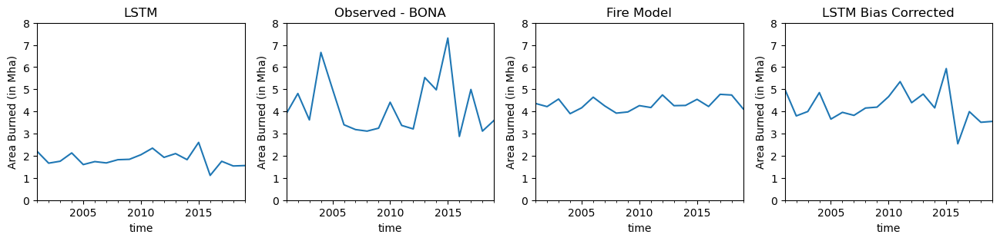

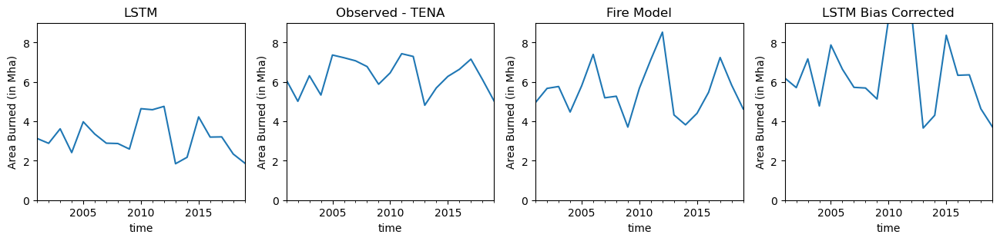

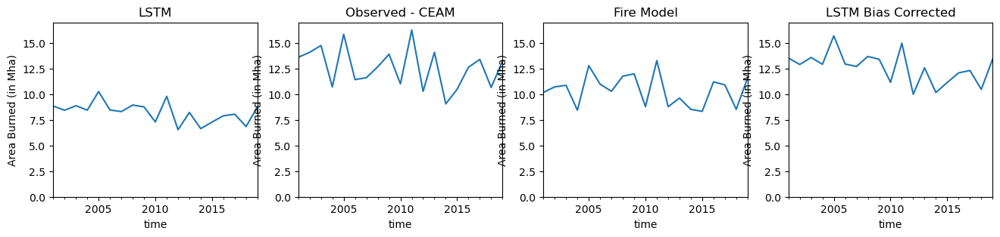

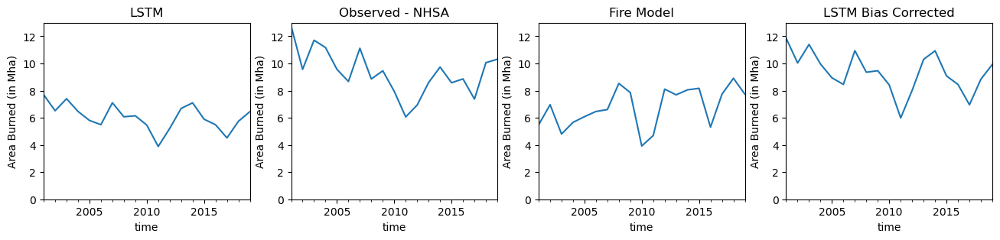

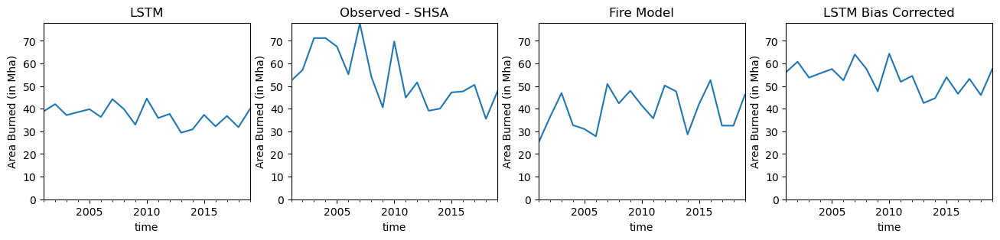

...

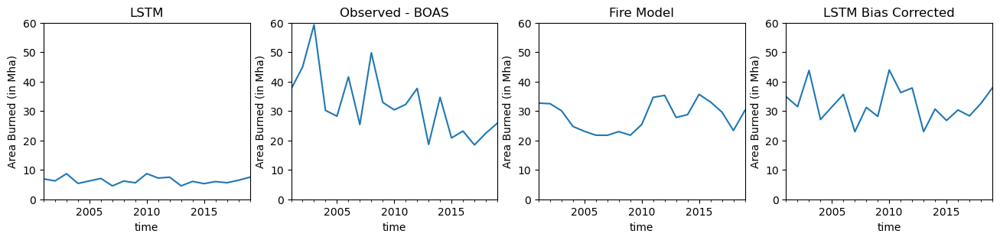

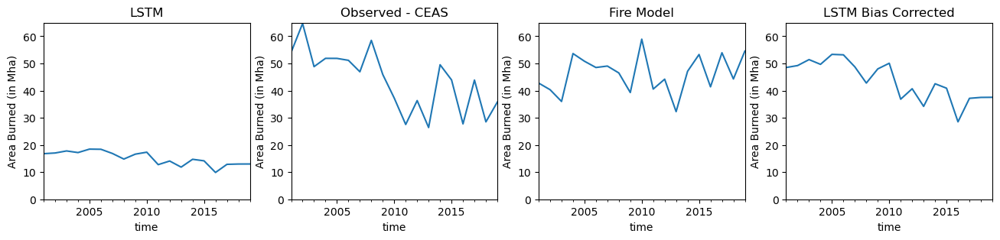

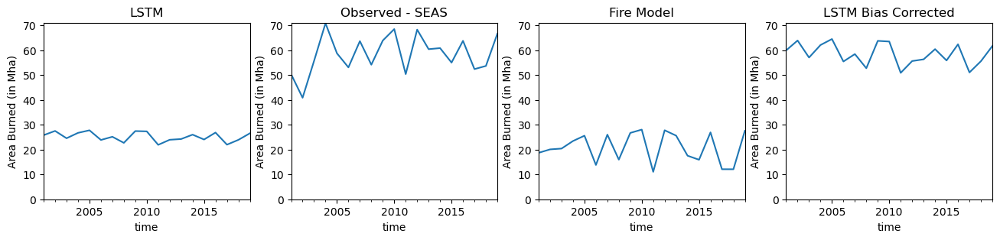

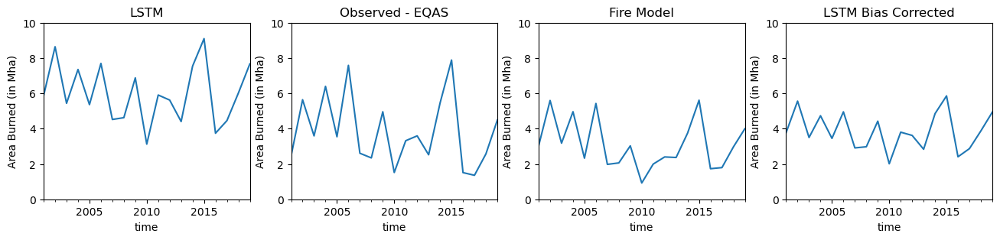

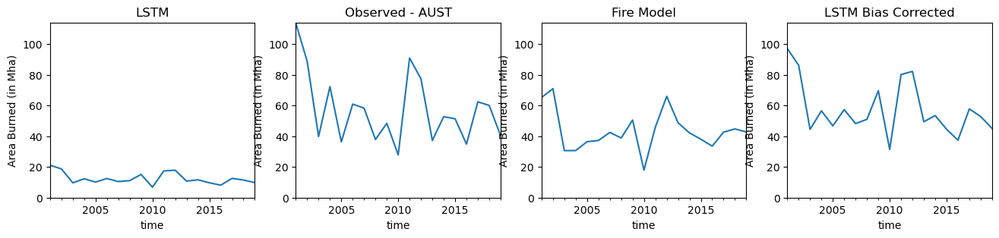

In [23]:
RA = False
start_year = 2001
end_year = 2019

index = [gfed_idx_name[el] for el in gfed_masks.keys()]

# Create df to hold all model correlation data
model_corr_df = pd.DataFrame(index=index, columns=pd.MultiIndex.from_product([model_df_yearly.columns.unique(level='Model'), ['Pearson', 'Spear.']], names=['Model', 'Correlation']))
model_corr_df = model_corr_df.sort_index()

# Create df to hold LSTM and best model correlation data
corr_df = pd.DataFrame(index=index, columns=pd.MultiIndex.from_product([['LSTM', 'Best Fire Model'], ['Pearson', 'Spearmann']], names=['Model', 'Correlation']))
corr_df = corr_df.sort_index()

# Create df to hold all model RMSE data
model_rmse_df = pd.DataFrame(index=index, columns=model_df_yearly.columns.unique(level='Model'))
model_rmse_df = model_rmse_df.sort_index()

# Create df to hold LSTM and best model RMSE data
rmse_df = pd.DataFrame(index=index, columns=['LSTM', 'Best Fire Model'])
rmse_df = rmse_df.sort_index()

predicted_data = constrain_time(predicted_df_yearly_gfed, start_year, end_year)
true_data = constrain_time(obs_df_yearly_gfed, start_year, end_year)
model_data = constrain_time(model_df_yearly_gfed, start_year, end_year)

for region in index:
    region_num = gfed_name_idx[region]
    fig, axs = plt.subplots(1, 4, figsize=(16, 3))
    predicted_region_data = predicted_data.loc[slice(None), region]
    true_region_data = true_data.loc[slice(None), region]
    model_region_data = model_data.loc[slice(None), region]
    
    predicted_region_data_RA = (predicted_region_data - predicted_region_data.mean())/predicted_region_data.mean()
    true_region_data_RA = (true_region_data - true_region_data.mean())/true_region_data.mean()
    model_region_data_RA = (model_region_data - model_region_data.mean())/model_region_data.mean()
    
    if RA:
        ylabel = 'Relative Anomaly'
        ymin = -1
    
    else:
        ylabel = 'Area Burned (in Mha)'
        ymin = 0

    # Calculate model correlations
    region_results_pearson = model_region_data.T.groupby('Model', observed=True).apply(lambda df: pearsonr(df.squeeze(), true_region_data.values))
    region_results_pearson = region_results_pearson.apply(lambda stat_results: stat_results.statistic if stat_results.pvalue<=0.05 else np.nan)
    model_corr_df.loc[region, (slice(None), 'Pearson')] = region_results_pearson.values
    
    region_results_spear = model_region_data.T.groupby('Model', observed=True).apply(lambda df: spearmanr(df.squeeze(), true_region_data.values))
    region_results_spear = region_results_spear.apply(lambda stat_results: stat_results.statistic if stat_results.pvalue<=0.05 else np.nan)
    model_corr_df.loc[region, (slice(None), 'Spear.')] = region_results_spear.values

    # Calculate model RMSE
    region_results_rmse = model_region_data.T.groupby('Model', observed=True).apply(lambda df: RMSE(df.squeeze(), true_region_data.values))
    model_rmse_df.loc[region] = region_results_rmse.values

    rmse_df.loc[region, 'LSTM'] = RMSE(predicted_region_data, true_region_data)

    best_model_region = region_results_rmse.index[region_results_rmse.argmin()]
    best_model_region_data = model_region_data.loc[slice(None), best_model_region]
    rmse_df.loc[region, 'Best Fire Model'] = model_rmse_df.loc[region, best_model_region]
    
    best_model_region_RA = region_results_pearson.index[region_results_pearson.argmax()]
    best_model_region_data_RA = model_region_data_RA.loc[slice(None), best_model_region_RA]
    corr_df.loc[region, 'Best Fire Model'] = model_corr_df.loc[region, best_model_region_RA].values
    
    if RA:
        ymax = math.ceil(max(predicted_region_data_RA.max(), true_region_data_RA.max(), best_model_region_data_RA.max()))

        predicted_region_data_RA.plot(ax=axs[0], ylim=[ymin, ymax])
        axs[0].set_title('LSTM')
        axs[0].set_ylabel(ylabel)

        true_region_data_RA.plot(ax=axs[1], ylim=[ymin, ymax])
        axs[1].set_title(f'Observed - {region}')
        axs[1].set_ylabel(ylabel)

        best_model_region_data_RA.plot(ax=axs[2], ylim=[ymin, ymax])
        axs[2].set_title('Fire Model')
        axs[2].set_ylabel(ylabel)
    
    else:
        ymax = math.ceil(max(predicted_region_data.max(), true_region_data.max(), best_model_region_data.max()))

        predicted_region_data.plot(ax=axs[0], ylim=[ymin, ymax])
        axs[0].set_title('LSTM')
        axs[0].set_ylabel(ylabel)

        true_region_data.plot(ax=axs[1], ylim=[ymin, ymax])
        axs[1].set_title(f'Observed - {region}')
        axs[1].set_ylabel(ylabel)

        best_model_region_data.plot(ax=axs[2], ylim=[ymin, ymax])
        axs[2].set_title('Fire Model')
        axs[2].set_ylabel(ylabel)

        correction_factor = true_region_data.mean()/predicted_region_data.mean()
        (predicted_region_data*correction_factor).plot(ax=axs[3], ylim=[ymin, ymax])
        axs[3].set_title('LSTM Bias Corrected')
        axs[3].set_ylabel(ylabel)
    

    pearson_result = pearsonr(predicted_region_data.values, true_region_data.values)
    spearman_result = spearmanr(predicted_region_data.values, true_region_data.values)
    
    pearson_result_model = pearsonr(best_model_region_data.values, true_region_data.values)
    spearman_result_model = spearmanr(best_model_region_data.values, true_region_data.values)

    if pearson_result.pvalue<0.05:
        corr_df.loc[(region), ('LSTM', 'Pearson')] = pearson_result.statistic
    if pearson_result_model.pvalue<0.05:
        corr_df.loc[(region), ('Best Fire Model', 'Pearson')] = pearson_result_model.statistic
    if spearman_result.pvalue<0.05:
        corr_df.loc[(region), ('LSTM', 'Spearmann')] = spearman_result.statistic
    if spearman_result_model.pvalue<0.05:
        corr_df.loc[(region), ('Best Fire Model', 'Spearmann')] = spearman_result_model.statistic

rmse_df['Ensemble Mean'] = model_rmse_df.mean(axis=1)
corr_df['Ensemble Mean'] = model_corr_df.mean(axis=1)

In [132]:
print('Number of regions where LSTM outperforms process-based models based on correlation')
(corr_df['LSTM'] > corr_df['Best Fire Model']).sum()

Number of regions where LSTM outperforms process-based models based on correlation


Correlation
Pearson      17
Spearmann    18
dtype: int64

In [133]:
print('Number of regions where LSTM is worse than best process-based model based on correlation')
(corr_df['LSTM'] < corr_df['Best Fire Model']).sum()

Number of regions where LSTM is worse than best process-based model based on correlation


Correlation
Pearson      13
Spearmann    10
dtype: int64

In [134]:
print('Number of regions where LSTM is worse than process-based ensemble mean based on correlation')
(corr_df['LSTM', 'Spearmann'] < corr_df['Ensemble Mean']).sum()

Number of regions where LSTM is worse than process-based ensemble mean based on correlation


9

In [135]:
print('Number of regions where LSTM outperforms all process-based models based on RMSE')
(rmse_df['LSTM'] < rmse_df['Best Fire Model']).sum()

Number of regions where LSTM outperforms all process-based models based on RMSE


12

In [136]:
print('Number of regions where LSTM outperforms process-based ensemble mean based on RMSE')
(rmse_df['LSTM'] < rmse_df['Ensemble Mean']).sum()

Number of regions where LSTM outperforms process-based ensemble mean based on RMSE


39

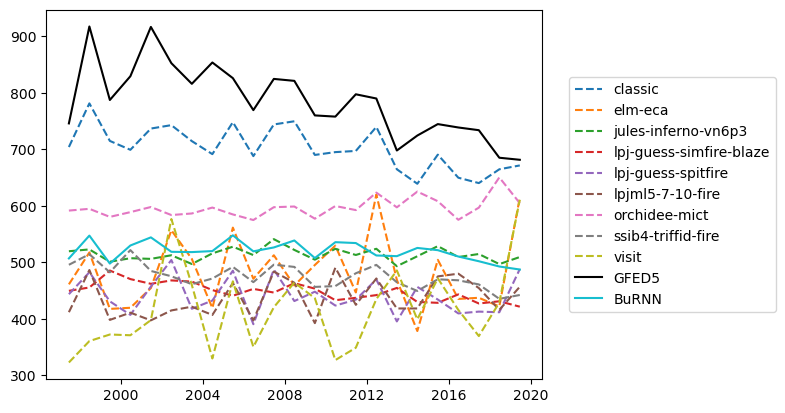

In [138]:
warnings.simplefilter(action="ignore", category=iris.warnings.IrisUserWarning)
for cube in model_cubelist:
    iplt.plot(to_annual(to_global(to_mha(cube))), label=cube.long_name, linestyle='--')
iplt.plot(to_annual(to_global(to_mha(obs_cube))), label=obs_cube.long_name, c='k')
iplt.plot(to_annual(to_global(to_mha(predicted_cube))), label=predicted_cube.long_name)
plt.legend(ncol=1, bbox_to_anchor=(1.04, 0.5), loc="center left")
plt.savefig(os.path.join(figures_path, 'global_annual_mean.png'), dpi=300)
warnings.simplefilter(action="default", category=iris.warnings.IrisUserWarning)

### Regional Plots

In [12]:
corr_df.style.format(precision=2)

In [17]:
rmse_df.style.format(precision=2)

,LSTM,Best Fire Model,Ensemble Mean
ARP,0.02,0.01,1.17
CAF,55.88,53.44,88.55
CAR,0.58,0.27,0.87
CAU,4.66,7.30,15.10
CNA,1.40,1.33,4.39
EAS,3.27,4.56,7.75
EAU,1.21,1.57,7.12
ECA,0.19,0.36,2.18
EEU,6.94,7.17,11.55
ENA,0.74,0.56,2.60


In [60]:
model_rmse_df

Model,classic,elm-eca,jules-inferno-vn6p3,lpj-guess-simfire-blaze,lpj-guess-spitfire,lpjml5-7-10-fire,orchidee-mict,ssib4-triffid-fire,visit
ARP,0.032238,0.009865,0.927254,1.266212,6.363432,0.561162,0.032214,0.418995,0.899629
CAF,53.443868,113.34288,66.360987,93.451049,108.260129,85.161449,75.708205,62.069408,139.115634
CAR,0.26502,0.515115,0.364415,0.347896,0.891085,0.989306,0.94466,1.051509,2.454755
CAU,12.924819,25.608106,9.717419,9.710938,7.970863,12.206501,8.294665,7.303984,42.168026
CNA,9.152689,10.422769,8.256644,2.462531,1.667958,2.345297,1.333444,1.818929,2.089726
EAS,10.598248,4.686347,6.875415,9.25903,10.993229,10.691103,4.563812,6.056091,6.034635
EAU,10.000576,7.497576,1.574639,2.780253,3.679223,3.440552,4.963958,8.830245,21.344782
ECA,0.858791,1.443172,0.379816,1.432642,1.42021,2.561246,4.63646,0.355949,6.518556
EEU,12.563269,12.921017,10.954911,11.809228,12.954746,11.735039,7.166511,11.720476,12.09553
ENA,0.880956,4.950671,8.045586,0.556238,1.198177,0.715924,1.21677,0.770062,5.025841


In [61]:
model_corr_df

Model         classic             elm-eca           jules-inferno-vn6p3  \
Correlation   Pearson    Spear.   Pearson    Spear.             Pearson   
ARP               NaN       NaN       NaN       NaN                 NaN   
CAF          0.673072  0.680702       NaN  0.521053            0.661648   
CAR          0.583408  0.557895   0.46826   0.57193                 NaN   
CAU           0.78715  0.636842       NaN       NaN            0.586346   
CNA               NaN       NaN       NaN       NaN            0.614124   
EAS               NaN  0.484211       NaN  0.610526            0.589109   
EAU               NaN  0.545614       NaN       NaN                 NaN   
ECA               NaN       NaN       NaN       NaN            0.689631   
EEU               NaN       NaN       NaN       NaN                 NaN   
ENA          0.529292  0.484211  0.659705  0.642105            0.675686   
ESAF         0.769007   0.82807       NaN       NaN            0.668137   
ESB               NaN       NaN       NaN  0.494737                 NaN   
MDG               NaN       NaN       NaN       NaN                 NaN   
MED          0.584866  0.619298       NaN       NaN                 NaN   
NAU               NaN       NaN       NaN       NaN            0.515952   
NCA          0.793811  0.787719   0.88043  0.791228                 NaN   
NEAF         0.733972   0.77193       NaN       NaN            0.728391   
NEN               NaN       NaN       NaN       NaN            0.472418   
NES          0.782089  0.659649  0.809973  0.731579            0.723259   
NEU          0.509167       NaN  0.515811       NaN            0.567484   
NSA           0.61123  0.577193  0.531009       NaN                 NaN   
NWN               NaN       NaN  0.458553       NaN                 NaN   
NWS          0.554245  0.521053  0.607978  0.596491                 NaN   
NZ                NaN  0.542105       NaN  0.657895            0.616837   
RAR               NaN       NaN       NaN       NaN            0.565662   
RFE          0.687594  0.624561       NaN       NaN            0.551042   
SAH               NaN       NaN       NaN       NaN                 NaN   
SAM          0.693029   0.64386  0.588861       NaN                 NaN   
SAS               NaN       NaN       NaN       NaN                 NaN   
SAU               NaN       NaN       NaN       NaN                 NaN   
SCA          0.755773  0.780702  0.582663  0.614035                 NaN   
SEA          0.699486  0.649123       NaN  0.508772             0.71969   
SEAF          0.65701  0.785965       NaN       NaN              0.7469   
SES               NaN  0.542105       NaN       NaN            0.543518   
SSA               NaN       NaN       NaN       NaN                 NaN   
SWS               NaN       NaN       NaN       NaN                 NaN   
TIB               NaN       NaN       NaN       NaN                 NaN   
WAF           0.77284  0.763158  0.479285       NaN            0.834018   
WCA               NaN       NaN       NaN       NaN                 NaN   
WCE               NaN       NaN       NaN       NaN                 NaN   
WNA          0.774582  0.745614  0.689027  0.740351            0.701773   
WSAF         0.458666  0.501754       NaN  0.505263                 NaN   
WSB               NaN       NaN       NaN  0.684211                 NaN   

Model                 lpj-guess-simfire-blaze           lpj-guess-spitfire  \
Correlation    Spear.                 Pearson    Spear.            Pearson   
ARP               NaN                0.561296  0.664912                NaN   
CAF          0.666667                     NaN       NaN                NaN   
CAR               NaN                     NaN       NaN                NaN   
CAU          0.685965                     NaN       NaN           0.704105   
CNA          0.573684                     NaN      -0.5                NaN   
EAS          0.629825                     NaN       NaN                NaN   


Region,NWN,NEN,WNA,CNA,ENA,NCA,SCA,CAR,NWS,NSA,...,TIB,EAS,ARP,SAS,SEA,NAU,CAU,EAU,SAU,NZ
time,,,,,,,,,,,,,,,,,,,,,
1997-01-01,0.000102,0.000003,0.005539,0.186221,0.114827,0.311064,0.586388,0.246373,0.786508,0.920646,...,0.136528,0.998483,0.005261,2.265375,2.730663,0.186356,0.177453,0.237365,0.394164,0.015618
1997-02-01,0.000394,0.000124,0.009455,0.176443,0.156911,0.485769,0.938017,0.373278,0.712326,1.068827,...,0.238938,1.617836,0.006000,4.611971,4.100717,0.051298,0.062033,0.160776,0.398311,0.017702
1997-03-01,0.003455,0.000751,0.034009,0.403802,0.213460,0.690578,1.533738,0.511943,0.737936,1.564403,...,0.531486,2.578672,0.005117,6.493853,5.128256,0.097713,0.226983,0.183324,0.352561,0.017450
1997-04-01,0.099645,0.012644,0.059659,0.301614,0.317334,0.745000,1.711716,0.491243,0.467417,1.073270,...,0.366477,2.137251,0.007779,4.867372,2.773003,0.480335,0.182662,0.257790,0.341941,0.014300
1997-05-01,0.300930,0.080123,0.118951,0.321269,0.209695,0.865010,1.269785,0.283573,0.298581,0.486788,...,0.293624,0.976317,0.014839,3.466838,1.256138,0.699307,0.060775,0.189804,0.211264,0.015428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01,0.215345,0.096853,0.377415,0.172552,0.155341,0.226486,0.105657,0.042677,0.526568,0.760623,...,0.012371,0.191624,0.041710,0.183914,1.809130,3.117256,0.287951,0.317052,0.111397,0.007481
2019-09-01,0.145820,0.014032,0.309393,0.223670,0.264225,0.141498,0.053240,0.023010,0.625453,1.088107,...,0.018343,0.557777,0.037601,0.202108,2.738995,3.589825,0.487289,0.510364,0.173785,0.009172
2019-10-01,0.123901,0.010815,0.256247,0.200079,0.206739,0.146216,0.027653,0.031234,0.496495,0.857911,...,0.056139,0.850194,0.030921,0.472359,2.514675,2.985624,0.628100,0.495568,0.234157,0.006635


In [24]:
predicted_df_PD = predicted_df.loc['1997-01-01':]
predicted_regional_climatology = predicted_df_PD.groupby(predicted_df_PD.index.month).mean().rename(index=lambda x: pd.to_datetime(x, format='%m').strftime('%B')[:3])
observed_regional_climatology = obs_df.groupby(obs_df.index.month).mean().rename(index=lambda x: pd.to_datetime(x, format='%m').strftime('%B')[:3])
model_regional_climatology = model_df.groupby(model_df.index.month).mean().rename(index=lambda x: pd.to_datetime(x, format='%m').strftime('%B')[:3])

NameError: name 'index' is not defined

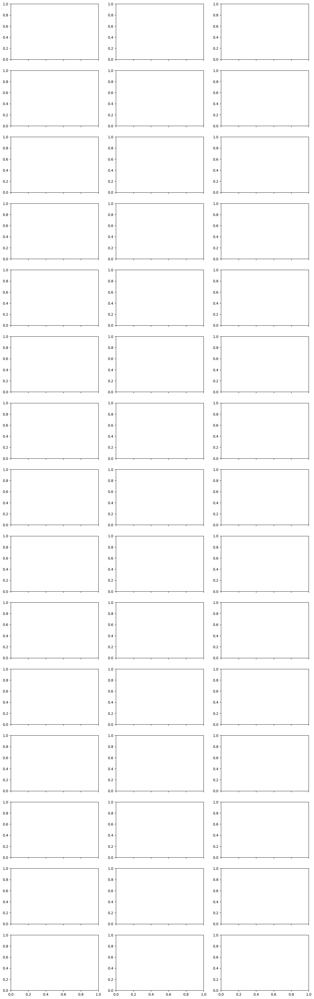

In [25]:
pd.options.mode.chained_assignment = None
fig, axs = plt.subplots(15, 3, figsize=(15, 50), sharex=True, sharey=False)
axs = axs.ravel()

fraction = True

for idx, region in enumerate(index):
    ax = axs[idx]
    region_num = AR6_name_idx[region]

    predicted_region_data = predicted_regional_climatology.loc[slice(None), region]
    observed_region_data = observed_regional_climatology.loc[slice(None), region]
    modelled_region_data = model_regional_climatology.loc[slice(None), region]

    if fraction:
        predicted_region_data /= predicted_region_data.sum()
        observed_region_data /= observed_region_data.sum()
        modelled_region_data /= modelled_region_data.sum()

    predicted_region_data.name = 'LSTM'
    observed_region_data.name = 'Observed'
    modelled_region_data.name = 'Fire Model'

    modelled_region_data.loc[:, 'LSTM'] = predicted_region_data
    modelled_region_data.loc[:, 'Observed'] = observed_region_data
    
    palette = sns.color_palette('Greys', n_colors=len(modelled_region_data.columns)+3)[3:]
    palette[-2:] = sns.color_palette(n_colors=2)

    sns.lineplot(modelled_region_data, ax=ax, palette=palette, dashes=False)
    ax.set_title(region)
    handles, labels = ax.get_legend_handles_labels()
    ax.get_legend().remove()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.01))
plt.tight_layout()
pd.options.mode.chained_assignment = 'warn'

### Debugging and deeper analysis

In [41]:
predictions = predicted_da.values
true_values = obs_da.values

equals = (true_values>0.0) == (predictions>0.0)
equals.mean()

0.9412577020710324

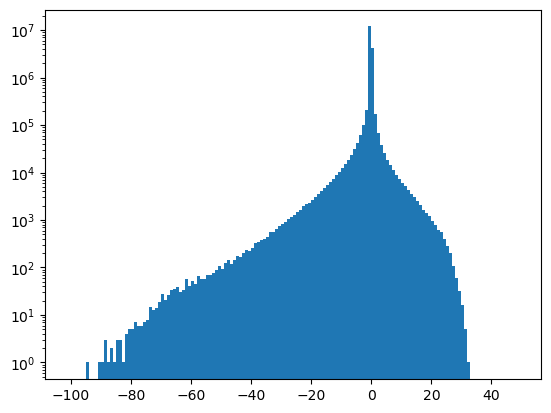

In [42]:
dif_plot = plt.hist(predictions.flatten()-true_values.flatten(), bins=np.arange(-101, 50), log=True)

Text(0, 0.5, 'Frequency')

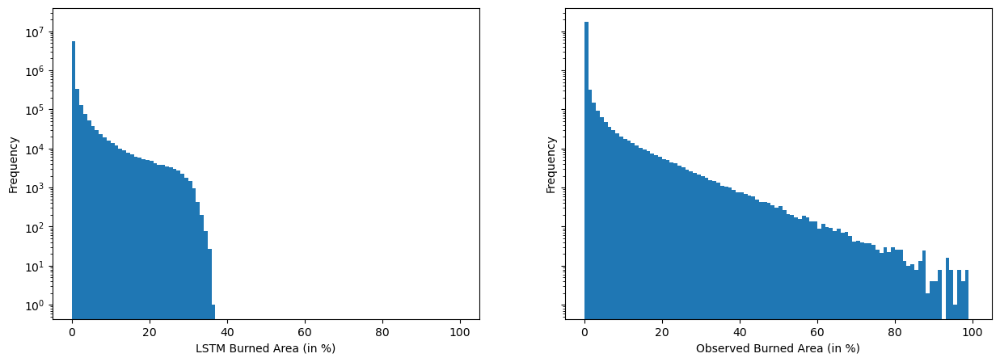

In [43]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

ax = axs[0]
preds_histplot = ax.hist(predictions.flatten(), bins=np.arange(0, 101), log=True)
ax.set_xlabel('LSTM Burned Area (in %)')
ax.set_ylabel('Frequency')

ax = axs[1]
true_values_histplot = ax.hist(true_values.flatten(), bins=np.arange(0, 101), log=True)
ax.set_xlabel('Observed Burned Area (in %)')
ax.set_ylabel('Frequency')

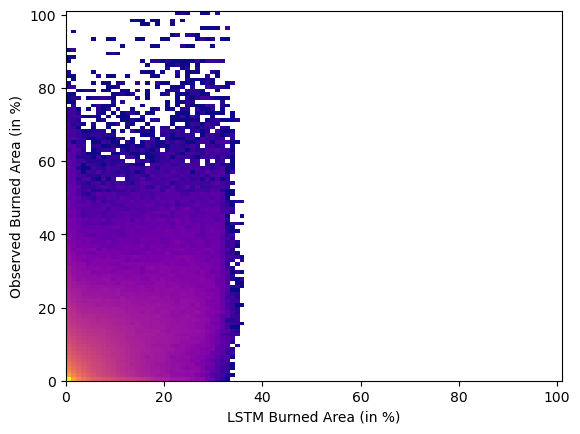

In [44]:
hist2d_plot = plt.hist2d(predictions.flatten(), true_values.flatten(), bins=100, cmap='plasma', norm=mcolors.LogNorm(), range=[[0, 101], [0, 101]])
_ = plt.xlabel('LSTM Burned Area (in %)')
_ = plt.ylabel('Observed Burned Area (in %)')

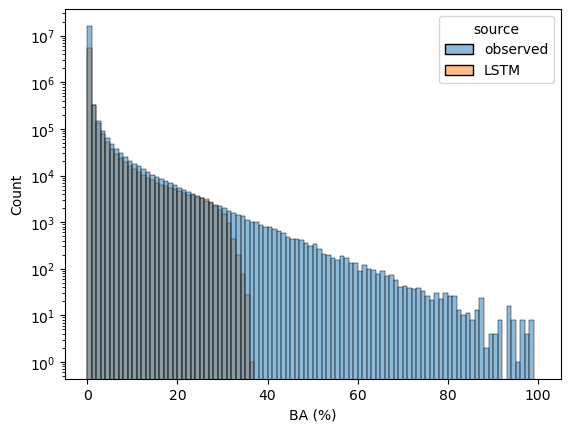

In [45]:
values = np.array([obs_cube.data.flatten(), predicted_cube.data.flatten()])
values = values.T[~np.isnan(values).max(axis=0)]

pred_df = pd.DataFrame(values, columns=['observed', 'LSTM'])
pred_df = pred_df.stack().reset_index().drop('level_0', axis=1).rename(columns={'level_1': 'source', 0: 'BA (%)'})

ax = sns.histplot(pred_df, x='BA (%)', hue='source', bins=np.arange(101))
ax.set_yscale('log')

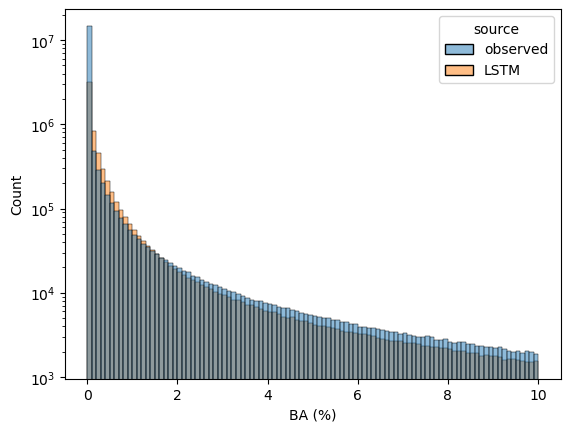

In [46]:
ax = sns.histplot(pred_df, x='BA (%)', hue='source', bins=np.arange(101)/10)
ax.set_yscale('log')

## ISIMIP Land Use Generation

In [ ]:
isimip_lu = xr.open_dataset("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/isimip_landuse_1901_2021.nc", decode_times=False, chunks={})
isimip_lu['forest'] = isimip_lu['primary_forests'] + isimip_lu['secondary_forests']
isimip_lu['nonforest'] = isimip_lu['primary_nonforests'] + isimip_lu['secondary_nonforests']
crop_list = [var for var in list(isimip_lu.keys()) if 'c3' in var or 'c4' in var]
isimip_lu['crops'] = isimip_lu[crop_list[0]]

isimip_lu['time'] = np.arange(np.datetime64('1901-01-01'), np.datetime64('2021-02-01'), dtype='datetime64[M]')

for crop in crop_list[1:]:
    isimip_lu['crops'] += isimip_lu[crop]
    
isimip_lu = isimip_lu.drop_vars(['primary_forests', 'secondary_forests', 'primary_nonforests', 'secondary_nonforests', 'pastures'] + crop_list + [var for var in list(isimip_lu.keys()) if 'secondary' in var])
isimip_lu.to_netcdf("/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/isimip_landuse_1901_2021_reprocessed.nc")

## FWI Normalisation

In [ ]:
fwi = constrain_time(xr.open_dataset(os.path.join(data_path, 'fwi_monthly.nc'), chunks = {}), 1997, 2019).load()
fwi_mean = fwi.groupby('time.year').max().mean(dim='year')
fwi_normalised = fwi / fwi_mean
fwi_normalised = fwi_normalised.rename({key: key+'_normalised' for key in list(fwi_normalised.keys())})
fwi_normalised.to_netcdf(os.path.join(data_path, 'fwi_normalised.nc'), engine='netcdf4')

## CLM Land Cover Generation

cdo select,name=PCT_LAKE,PCT_URBAN,PCT_CROP,PCT_NAT_PFT "/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Reconstruction_Data/landuse.timeseries_360x720cru_SSP2-4.5_1850-2100_78pfts_c240216.nc" ./Data/CLM_landuse.nc

In [120]:
list(clm.keys())

['PCT_URBAN',
 'PCT_LAKE',
 'PCT_CROP',
 'Bare Ground',
 'Needleleaf evergreen tree – temperate',
 'Needleleaf evergreen tree - boreal',
 'Needleleaf deciduous tree – boreal',
 'Broadleaf evergreen tree – tropical',
 'Broadleaf evergreen tree – temperate',
 'Broadleaf deciduous tree – tropical',
 'Broadleaf deciduous tree – temperate',
 'Broadleaf deciduous tree – boreal',
 'Broadleaf evergreen shrub - temperate',
 'Broadleaf deciduous shrub – temperate',
 'Broadleaf deciduous shrub – boreal',
 'C3 arctic grass',
 'C3 grass',
 'C4 grass']

In [123]:
clm = xr.open_dataset(r'/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/CLM_landuse.nc', engine='netcdf4', chunks={})
clm['time'] = np.arange(1850-1970, 2101-1970, 1).astype('datetime64[Y]')
clm['PCT_URBAN'] = clm.PCT_URBAN.sum(dim='numurbl')

frac_pft = (100 - (clm.PCT_URBAN + clm.PCT_LAKE + clm.PCT_CROP))/100
pft_names = ['Bare Ground', 'Needleleaf evergreen tree - temperate', 'Needleleaf evergreen tree - boreal', 'Needleleaf deciduous tree - boreal', 'Broadleaf evergreen tree - tropical', 'Broadleaf evergreen tree - temperate', 'Broadleaf deciduous tree - tropical', 'Broadleaf deciduous tree - temperate', 'Broadleaf deciduous tree - boreal', 'Broadleaf evergreen shrub - temperate', 'Broadleaf deciduous shrub - temperate', 'Broadleaf deciduous shrub - boreal', 'C3 arctic grass', 'C3 grass', 'C4 grass']

for idx, pft in enumerate(pft_names):
    clm[pft] = clm.PCT_NAT_PFT[:, idx]*frac_pft
clm = clm.drop_vars(['PCT_NAT_PFT']).drop_dims('natpft').rename({'lsmlat': 'lat', 'lsmlon': 'lon'})

clm['Needleleaf tree'] = clm['Needleleaf evergreen tree - temperate'] + clm['Needleleaf evergreen tree - boreal'] + clm['Needleleaf deciduous tree - boreal']
clm['Broadleaf deciduous tree'] = clm['Broadleaf deciduous tree - tropical'] + clm['Broadleaf deciduous tree - temperate'] + clm['Broadleaf deciduous tree - temperate']
clm['Broadleaf evergreen tree'] = clm['Broadleaf evergreen tree - tropical'] + clm['Broadleaf evergreen tree - temperate']
clm['C3 grass'] += clm['C3 arctic grass'] 
clm['Broadleaf shrub - temperate'] = clm['Broadleaf evergreen shrub - temperate'] + clm['Broadleaf deciduous shrub - temperate']

clm = clm.drop_vars(['Needleleaf evergreen tree - temperate', 'Needleleaf evergreen tree - boreal', 'Needleleaf deciduous tree - boreal', 'Broadleaf deciduous tree - tropical', 'Broadleaf deciduous tree - temperate', 
                    'Broadleaf deciduous tree - temperate', 'C3 arctic grass', 'Broadleaf evergreen shrub - temperate', 'Broadleaf deciduous shrub - temperate'])

clm['lat'] = np.arange(-89.75, 90, 0.5)
clm['lon'] = np.concatenate([np.arange(0.25, 180, 0.5), np.arange(-179.75, 0, 0.5)])

clm = clm.sortby("lon").sortby("lat", ascending=False)

clm.to_netcdf(r'/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/CLM_landuse_corrected.nc')

/tmp/ipykernel_1003179/1474637021.py:2: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  clm['time'] = np.arange(1850-1970, 2101-1970, 1).astype('datetime64[Y]')
/tmp/ipykernel_1003179/1474637021.py:2: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced b

cdo inttime,1901-01-01,12:00:00,1month "/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/CLM_landuse_corrected.nc" "/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Data/CLM_landuse_monthly.nc"

In [36]:
clm_landuse_path = os.path.join(data_path, 'CLM_landuse_monthly.nc')
clm_landuse = xr.open_dataset(clm_landuse_path, chunks={})

americas = np.arange(1, 16, 1)
africa = np.arange(20, 28, 1)
euraustralasia = [idx for idx in np.unique(obs_da.Region)[:-1] if (idx not in americas) and (idx not in africa)]

americas = obs_da.Region.isin(americas)
africa = obs_da.Region.isin(africa)
euraustralasia = obs_da.Region.isin(euraustralasia)

clm_landuse['C4 grass Americas'] = clm_landuse['C4 grass']*americas
clm_landuse['C4 grass Africa'] = clm_landuse['C4 grass']*africa
clm_landuse['C4 grass Euraustralasia'] = clm_landuse['C4 grass']*euraustralasia

clm_landuse.to_netcdf(os.path.join(data_path, 'CLM_landuse_monthly_grasses_extended.nc'))

# Old

### RandomForests

In [4]:
classifier=RandomForestClassifier(random_state=0, verbose=5, n_jobs=-1, n_estimators=20, min_samples_leaf=0.0001, class_weight='balanced_subsample')
regressor=RandomForestRegressor(random_state=0, verbose=5, n_jobs=-1, n_estimators=20, min_samples_leaf=0.0001)

In [5]:
model = ZeroInflatedRegressor(
    classifier=classifier,
    regressor=regressor
)

In [6]:
model

ZeroInflatedRegressor(classifier=RandomForestClassifier(class_weight='balanced_subsample',
                                                        min_samples_leaf=0.0001,
                                                        n_estimators=20,
                                                        n_jobs=-1,
                                                        random_state=0,
                                                        verbose=5),
                      regressor=RandomForestRegressor(min_samples_leaf=0.0001,
                                                      n_estimators=20,
                                                      n_jobs=-1, random_state=0,
                                                      verbose=5))

In [7]:
y_train_nonzero = y_train[y_train!=0]
x_train_nonzero = x_train.sel(sample=y_train_nonzero.sample)

In [49]:
current_date = datetime.datetime.now().strftime('%Y-%m-%d_%H%M%S')
model.fit(x_train, log_transform(y_train*100)/2)

joblib.dump(model, os.path.join(data_path.parent, 'Models', f"ZIR_{current_date}.joblib"))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.


building tree 1 of 20building tree 2 of 20
building tree 3 of 20

building tree 4 of 20
building tree 5 of 20
building tree 6 of 20
building tree 7 of 20
building tree 8 of 20
building tree 9 of 20
building tree 10 of 20
building tree 11 of 20
building tree 12 of 20
building tree 13 of 20
building tree 14 of 20
building tree 15 of 20
building tree 16 of 20
building tree 17 of 20
building tree 18 of 20
building tree 19 of 20
building tree 20 of 20


[Parallel(n_jobs=-1)]: Done   6 out of  20 | elapsed:   31.0s remaining:  1.2min
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:   31.8s remaining:   26.0s
[Parallel(n_jobs=-1)]: Done  16 out of  20 | elapsed:   31.8s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:   31.8s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   6 out of  20 | elapsed:    0.6s remaining:    1.3s
[Parallel(n_jobs=20)]: Done  11 out of  20 | elapsed:    0.7s remaining:    0.5s
[Parallel(n_jobs=20)]: Done  16 out of  20 | elapsed:    0.7s remaining:    0.2s
[Parallel(n_jobs=20)]: Done  20 out of  20 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.


building tree 1 of 20
building tree 2 of 20
building tree 3 of 20
building tree 4 of 20
building tree 5 of 20
building tree 6 of 20
building tree 7 of 20
building tree 8 of 20
building tree 9 of 20
building tree 10 of 20
building tree 11 of 20
building tree 12 of 20
building tree 13 of 20
building tree 14 of 20
building tree 15 of 20
building tree 16 of 20
building tree 17 of 20
building tree 18 of 20
building tree 19 of 20
building tree 20 of 20


[Parallel(n_jobs=-1)]: Done   6 out of  20 | elapsed:  7.2min remaining: 16.7min
[Parallel(n_jobs=-1)]: Done  11 out of  20 | elapsed:  7.3min remaining:  5.9min
[Parallel(n_jobs=-1)]: Done  16 out of  20 | elapsed:  7.3min remaining:  1.8min
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  7.6min finished


['/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Models/ZIR_2024-05-15_212139.joblib']

### NeuralNets

In [4]:
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        # 1 input image channel, 6 output channels, 5x5 square convolution
        # kernel
        # an affine operation: y = Wx + b
        self.fc1 = nn.LazyLinear(64)
        self.fc2 = nn.Linear(64, 128)
        self.fc3 = nn.Linear(128, 256)
        self.fc4 = nn.Linear(256, 128)
        self.fc5 = nn.Linear(128, 64)
        self.fc6 = nn.Linear(64, 32)
        self.fc7 = nn.Linear(32, 1)


    def forward(self, x):
        x = torch.flatten(x, 1) # flatten all dimensions except the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = F.relu(self.fc5(x))
        x = F.relu(self.fc6(x))
        x = self.fc7(x)
        return x

In [5]:
# define the LightningModule
class LitModel(pl.LightningModule):
    def __init__(self, dw_alpha=0):
        super().__init__()
        self.model = Net()
        self.dw = DenseWeight(alpha=dw_alpha)
        
    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # training_step defines the train loop.
        # it is independent of forward
        x, y_true = batch
        x = x.view(x.size(0), -1)
        y_predict = self(x)
        loss = self.loss(y_predict, y_true)
        # Logging to TensorBoard (if installed) by default
        self.log("train_loss", loss)
        return loss

    def configure_optimizers(self):
        optimizer = optim.SGD(self.parameters(), lr=1e-3) # Change to Adam
        return optimizer
    
    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        return self.model(batch[0])
    
    def loss(self, y_predict, y_true):
        squared_error = (y_predict - y_true)**2
        weights = torch.from_numpy(np.float32(self.dw(y_true)))
        loss = (weights * squared_error).mean()
        return loss

In [6]:
class Calculate_DensityWeights(pl.Callback):       
    def on_train_start(self, trainer, pl_module):
        # This method will be called before training starts  
        pl_module.dw.fit(np.concatenate([batch[1].numpy() for batch in trainer.train_dataloader], axis=0))

In [7]:
class MyDataSet(torch.utils.data.Dataset):
    def __init__(self, x, y, transform=None):
        super(MyDataSet, self).__init__()
        # store the raw tensors
        self._x = x
        self._y = y

    def __len__(self):
        # a DataSet must know it size
        return self._x.shape[0]

    def __getitem__(self, index):
        x = self._x[index, :]
        y = self._y[index, :]
        return x, y

In [14]:
class MyZeroInflatedRegressor(ZeroInflatedRegressor):
    @property
    def feature_importances_(self):
        self._feature_importances = self.calculate_feature_importances_()
        return self._feature_importances

    def calculate_feature_importances_(self):
        try:
            classifier_feature_importances_ = self.classifier.feature_importances_
        except sklearn.exceptions.NotFittedError:
            classifier_feature_importances_ = np.zeros(1)

        try:
            regressor_feature_importances_ = self.regressor.feature_importances_
        except sklearn.exceptions.NotFittedError:
            regressor_feature_importances_ = np.zeros(1)

        return (classifier_feature_importances_ + regressor_feature_importances_)/2

In [8]:
def log_transform(tensor):
    return torch.log10(tensor+1)

def log_untransform(tensor):
    return 10**(tensor)-1

def preprocess_x(x):
    # takes an xarray dataarray (x) and returns Tensor
    return torch.nn.functional.normalize(torch.from_numpy(np.float32(x.to_numpy())))
    
def preprocess_y(y):
    return torch.from_numpy(np.float32(y.to_numpy())[:, np.newaxis])

In [9]:
batch_size=64
num_workers=0

In [10]:
train_dataset = MyDataSet(x=preprocess_x(x_train), y=preprocess_y(y_train))
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, num_workers=num_workers, pin_memory=False)

In [11]:
val_dataset = MyDataSet(x=preprocess_x(x_val), y=preprocess_y(y_val))
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers, pin_memory=False)

PosixPath('/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction')

In [28]:
timestamp = datetime.datetime.now().strftime('%Y-%m-%d@%H:%M:%S')

callback1 = Calculate_DensityWeights()
trainer = pl.Trainer(max_epochs=3, callbacks=[callback1], accelerator='gpu')

model = LitModel(dw_alpha=1)
trainer.fit(model, train_dataloaders=train_loader)
trainer.save_checkpoint(os.path.join(model_path, f"neuralnet_{timestamp}.ckpt"))

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Initializing distributed: GLOBAL_RANK: 0, MEMBER: 1/2
Initializing distributed: GLOBAL_RANK: 1, MEMBER: 2/2
----------------------------------------------------------------------------------------------------
distributed_backend=nccl
All distributed processes registered. Starting with 2 processes
----------------------------------------------------------------------------------------------------



ProcessRaisedException: 

-- Process 0 terminated with the following error:
Traceback (most recent call last):
  File "/apps/brussel/RL8/broadwell/software/PyTorch/1.12.0-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/torch/multiprocessing/spawn.py", line 69, in _wrap
    fn(i, *args)
  File "/apps/brussel/RL8/broadwell/software/PyTorch-Lightning/1.7.7-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/pytorch_lightning/strategies/launchers/multiprocessing.py", line 133, in _wrapping_function
    results = function(*args, **kwargs)
  File "/apps/brussel/RL8/broadwell/software/PyTorch-Lightning/1.7.7-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/pytorch_lightning/trainer/trainer.py", line 735, in _fit_impl
    results = self._run(model, ckpt_path=self.ckpt_path)
  File "/apps/brussel/RL8/broadwell/software/PyTorch-Lightning/1.7.7-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/pytorch_lightning/trainer/trainer.py", line 1102, in _run
    self.strategy.setup_environment()
  File "/apps/brussel/RL8/broadwell/software/PyTorch-Lightning/1.7.7-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/pytorch_lightning/strategies/strategy.py", line 130, in setup_environment
    self.accelerator.setup_environment(self.root_device)
  File "/apps/brussel/RL8/broadwell/software/PyTorch-Lightning/1.7.7-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/pytorch_lightning/accelerators/cuda.py", line 43, in setup_environment
    torch.cuda.set_device(root_device)
  File "/apps/brussel/RL8/broadwell/software/PyTorch/1.12.0-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/torch/cuda/__init__.py", line 314, in set_device
    torch._C._cuda_setDevice(device)
  File "/apps/brussel/RL8/broadwell/software/PyTorch/1.12.0-foss-2022a-CUDA-11.7.0/lib/python3.10/site-packages/torch/cuda/__init__.py", line 207, in _lazy_init
    raise RuntimeError(
RuntimeError: Cannot re-initialize CUDA in forked subprocess. To use CUDA with multiprocessing, you must use the 'spawn' start method


In [ ]:
model = LitModel.load_from_checkpoint(os.path.join(model_path, f"neuralnet_{timestamp}.ckpt"))
trainer = pl.Trainer()

In [7]:
def log_transform(tensor):
    return torch.log10(tensor+1)/2

def log_untransform(tensor):
    return 10**(tensor*2)-1

def preprocess_x(x):
    # takes an xarray dataarray (x) and returns Tensor
    return torch.nn.functional.normalize(torch.from_numpy(np.float32(x.to_numpy())))
    
def preprocess_y(y):
    return torch.from_numpy(preprocess_y_core(y))

def preprocess_y_core(y):
    return np.float32(y.to_numpy())[:, np.newaxis]

def arr_log_transform(arr):
    return np.log10(arr+1)/2

def normalize(arr):
    return (arr*(arr.size-1)+0.5)/arr.size

def unnormalize(arr):
    return ((arr*arr.size)-0.5)/(arr.size-1)

def fix_upper_values(arr):
    return np.where(arr>1, 1, arr)


In [4]:
X_val = sm.add_constant(x_val)

/apps/brussel/RL8/broadwell/software/statsmodels/0.13.1-foss-2022a/lib/python3.10/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [8]:
y_predict = log_untransform(unnormalize(results.predict(X_val)))
y_true = y_val.values

In [9]:
def score_zir(y_predict, y_true):
    true_positives_idcs = np.bitwise_and(y_predict != 0, y_true != 0)
    true_positives = true_positives_idcs.sum()
    false_positives = np.bitwise_and(y_predict != 0, y_true == 0).sum()
    false_negatives = np.bitwise_and(y_predict == 0, y_true != 0).sum()
    true_negatives = np.bitwise_and(y_predict == 0, y_true == 0).sum()
    
    precision = true_positives/(true_positives+false_positives)
    recall = true_positives/(true_positives+false_negatives)
    accuracy = (true_positives+true_negatives)/y_true.size
    
    rmse = sqrt(mean_squared_error(y_predict[true_positives_idcs], y_true[true_positives_idcs]))
    
    return {'precision': precision, 'recall': recall, 'accuracy': accuracy, 'rmse': rmse}

In [10]:
print(score_zir(y_predict, y_true))

{'precision': 0.19023736348427603, 'recall': 1.0, 'accuracy': 0.19023736348427603, 'rmse': 5.539444758295916}


In [6]:
from statsmodels.regression.linear_model import OLSResults
results = OLSResults.load(r"/vscmnt/brussel_pixiu_data/_data_brussel/vo/000/bvo00012/vsc10262/Wildfires/WP1_Long_Term_BA_Reconstruction/Models/BR_2024-03-22_141343.pkl")

In [15]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              BetaModel Results                               
==============================================================================
Dep. Variable:                      y   Log-Likelihood:            -3.7338e+08
Model:                      BetaModel   AIC:                         7.468e+08
Method:            Maximum Likelihood   BIC:                         7.468e+08
Date:                Fri, 22 Mar 2024                                         
Time:                        14:18:37                                         
No. Observations:            13619496                                         
Df Residuals:                13619469                                         
Df Model:                          25                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -17.6295        nan        nan        nan         nan         nan
x1            -0.9398        nan        nan        nan         nan         nan
x2             0.4632        nan        nan        nan         nan         nan
x3            -2.3264        nan        nan        nan         nan         nan
x4             0.5099        nan        nan        nan         nan         nan
x5             6.7017        nan        nan        nan         nan         nan
x6             8.6273        nan        nan        nan         nan         nan
x7             7.6896        nan        nan        nan         nan         nan
x8            14.8309        nan        nan        nan         nan         nan
x9             6.6206        nan        nan        nan         nan         nan
x10           -5.3885        nan        nan        nan         nan         nan
x11           16.8188        nan        nan        nan         nan         nan
x12           17.5645        nan        nan        nan         nan         nan
x13            0.4282        nan        nan        nan         nan         nan
x14           -0.0007        nan        nan        nan         nan         nan
x15           -3.2664        nan        nan        nan         nan         nan
x16            0.9731        nan        nan        nan         nan         nan
x17           39.7321        nan        nan        nan         nan         nan
x18        -3.554e-11        nan        nan        nan         nan         nan
x19            0.0387        nan        nan        nan         nan         nan
x20           -0.0387        nan        nan        nan         nan         nan
x21            0.0387        nan        nan        nan         nan         nan
x22           -0.0983        nan        nan        nan         nan         nan
x23           -0.2403        nan        nan        nan         nan         nan
x24           -0.1900        nan        nan        nan         nan         nan
x25            0.2707        nan        nan        nan         nan         nan
precision    -28.3087        nan        nan        nan         nan         nan
==============================================================================
"""

In [99]:
y_predict = trainer.predict(model=model, dataloaders=val_loader)
y_predict = np.array([np.float32(val[0]) for batch in y_predict for val in batch])
y_true = np.concatenate([np.float32(val) for batch in val_loader for val in batch[1]])

/apps/brussel/RL8/broadwell/software/PyTorch-Lightning/1.7.7-foss-2022a/lib/python3.10/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:236: PossibleUserWarning: The dataloader, predict_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 28 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Predicting: 212805it [00:00, ?it/s]

In [13]:
def rmse(arr1, arr2):
    return np.sqrt(np.mean(np.square(arr1-arr2)))

In [15]:
hist, bins = np.histogram(y_predict, bins=30)

# Plot histogram
plt.figure(figsize=(8, 6))
plt.hist(y_predict, bins=bins, edgecolor='black')

(array([1.671223e+06, 1.084900e+04, 7.932000e+03, 5.830000e+03,
        3.344000e+03, 1.311000e+03, 5.660000e+02, 3.090000e+02,
        2.380000e+02, 1.460000e+02, 1.000000e+02, 8.700000e+01,
        7.000000e+01, 6.000000e+01, 4.100000e+01, 4.700000e+01,
        2.500000e+01, 2.400000e+01, 2.200000e+01, 1.800000e+01,
        1.800000e+01, 1.700000e+01, 1.900000e+01, 6.000000e+00,
        6.000000e+00, 4.000000e+00, 9.000000e+00, 3.000000e+00,
        1.500000e+01, 2.900000e+01]),
 array([-1.35257368e-06,  3.24463185e+00,  6.48926506e+00,  9.73389826e+00,
         1.29785315e+01,  1.62231647e+01,  1.94677979e+01,  2.27124311e+01,
         2.59570643e+01,  2.92016975e+01,  3.24463307e+01,  3.56909639e+01,
         3.89355971e+01,  4.21802303e+01,  4.54248635e+01,  4.86694967e+01,
         5.19141299e+01,  5.51587631e+01,  5.84033964e+01,  6.16480296e+01,
         6.48926628e+01,  6.81372960e+01,  7.13819292e+01,  7.46265624e+01,
         7.78711956e+01,  8.11158288e+01,  8.43604620e+01,

In [21]:
y_val_mean = np.full_like(y_val.values, y_val.values.mean())
y_val_zero = np.zeros_like(y_val.values)

In [22]:
rmse(y_val_mean, y_val.values)

2.161408612113096

In [23]:
rmse(y_val_zero, y_val.values)

2.1894452170150993

## Load Model

In [17]:
model = joblib.load(os.path.join(model_path, 'ZIR_2024-03-21_103344.joblib'))

KeyError: 255

## Evaluate Model

In [28]:
def score_zir(y_predict, y_true):
    true_positives_idcs = np.bitwise_and(y_predict != 0, y_true != 0)
    true_positives = true_positives_idcs.sum()
    false_positives = np.bitwise_and(y_predict != 0, y_true == 0).sum()
    false_negatives = np.bitwise_and(y_predict == 0, y_true != 0).sum()
    true_negatives = np.bitwise_and(y_predict == 0, y_true == 0).sum()
    
    precision = true_positives/(true_positives+false_positives)
    recall = true_positives/(true_positives+false_negatives)
    accuracy = (true_positives+true_negatives)/y_true.size
    
    rmse = sqrt(mean_squared_error(y_predict[true_positives_idcs], y_true[true_positives_idcs]))
    
    return {'precision': precision, 'recall': recall, 'accuracy': accuracy, 'rmse': rmse}

In [29]:
xr.where(log_inverse(y_predict)>0.01, log_inverse(y_predict), 0).max()

15.452578449209478

In [55]:
y_predict = log_inverse(model.predict(x_val)*2)/100
y_true = y_val.values

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   6 out of  20 | elapsed:    0.2s remaining:    0.5s
[Parallel(n_jobs=20)]: Done  11 out of  20 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=20)]: Done  16 out of  20 | elapsed:    0.2s remaining:    0.1s
[Parallel(n_jobs=20)]: Done  20 out of  20 | elapsed:    0.2s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   6 out of  20 | elapsed:    0.9s remaining:    2.2s
[Parallel(n_jobs=20)]: Done  11 out of  20 | elapsed:    1.2s remaining:    1.0s
[Parallel(n_jobs=20)]: Done  16 out of  20 | elapsed:    1.3s remaining:    0.3s
[Parallel(n_jobs=20)]: Done  20 out of  20 | elapsed:    1.4s finished


(0.0, 1.0)

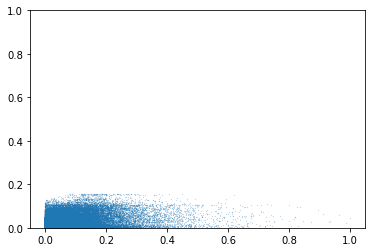

In [72]:
ax = plt.scatter(y_true, y_predict, s=0.01)
plt.ylim(0, 1)

In [62]:
score_zir(xr.where(y_predict<0.0005, 0, y_predict), y_true)

{'precision': 0.4529347469850655,
 'recall': 0.8406720312239466,
 'accuracy': 0.7765259920299253,
 'rmse': 0.045322986789506976}

In [12]:
score_zir(y_predict, y_true)

{'precision': 0.4688685818550024,
 'recall': 0.8664645179617976,
 'accuracy': 0.7878737147314799,
 'rmse': 0.04026516928508439}

In [7]:
score_zir(y_predict, y_true)

{'precision': 0.42582772432940347,
 'recall': 0.8782682010732259,
 'accuracy': 0.753387133866695,
 'rmse': 4.364381299044659}

In [13]:
pred_df = pd.DataFrame(data=[y_true, y_predict], index=['true', 'predicted']).T

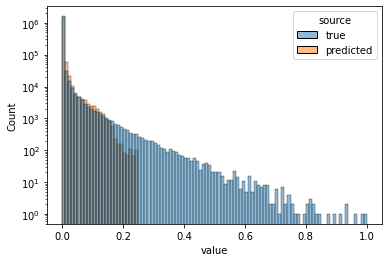

In [14]:
ax = sns.histplot(pred_df.stack().reset_index().drop('level_0', axis=1).rename(columns={'level_1': 'source', 0: 'value'}), x='value', hue='source', bins=np.arange(101)/100)
ax.set_yscale('log')

In [34]:
y_predict_int = np.rint(y_predict).astype(np.int8)
y_true_int = np.rint(y_true).astype(np.int8)
results = np.zeros((y_true_int.max()+1, y_predict_int.max()+1))

for pred_val, true_val in list(zip(y_predict_int, y_true_int)):
    results[true_val, pred_val] += 1

/tmp/ipykernel_1384320/2064407896.py:1: RuntimeWarning: invalid value encountered in true_divide
  data = results/results.sum(axis=1)[:, np.newaxis]


<AxesSubplot:>

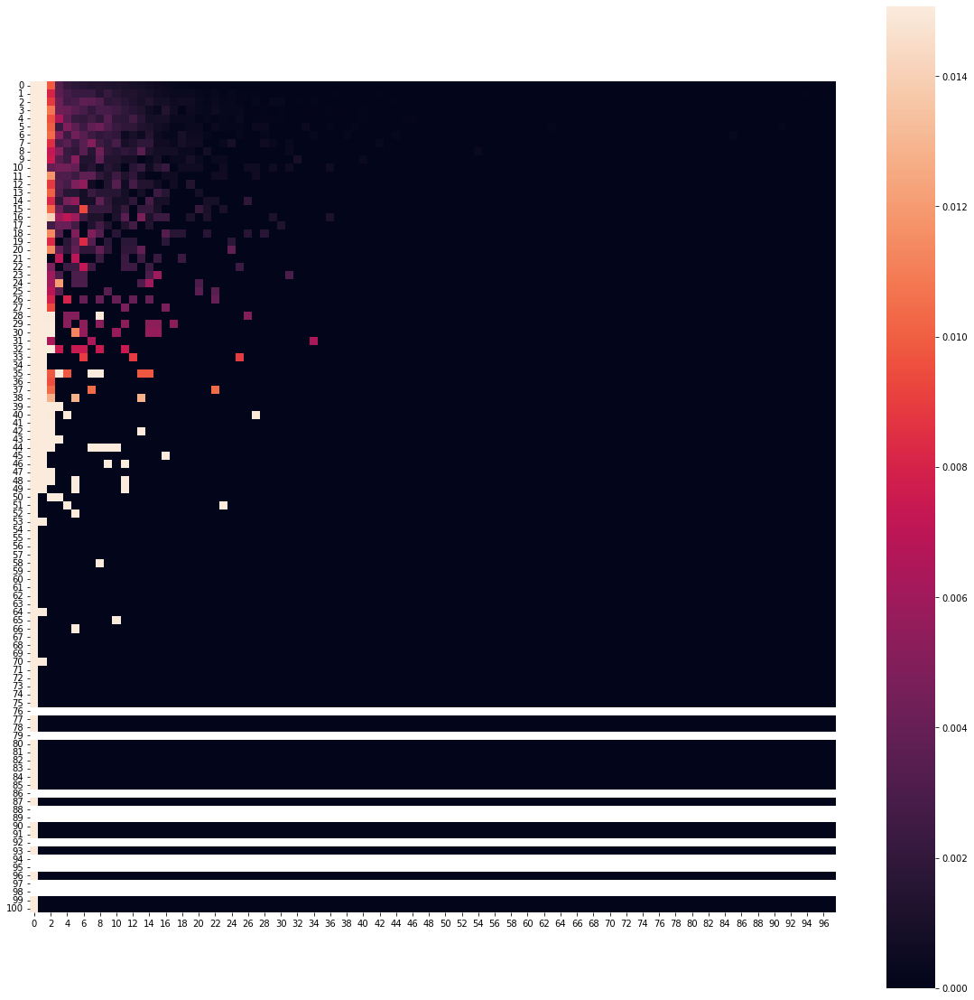

In [40]:
data = results/results.sum(axis=1)[:, np.newaxis]

fig, ax = fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(data, robust=True, annot=False, square=True, ax=ax)

In [9]:
classifier_importances = model.classifier_.feature_importances_
classifier_std = np.std([tree.feature_importances_ for tree in model.classifier_.estimators_], axis=0)

regressor_importances = model.regressor_.feature_importances_
regressor_std = np.std([tree.feature_importances_ for tree in model.regressor_.estimators_], axis=0)

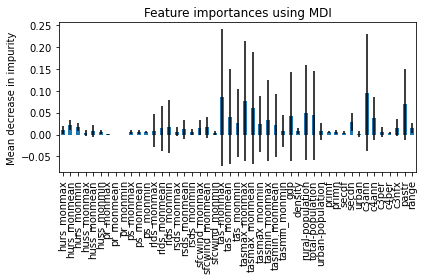

In [10]:






fig, ax = plt.subplots()
classifier_importances = pd.Series(classifier_importances, index=x_train.coords['variable'])
classifier_importances.plot.bar(yerr=classifier_std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()